**1. Importing libraries**

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import pandas as pd
import optlib.optical as opt
import copy

np.seterr(divide='ignore', invalid='ignore')

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
plt.rcParams['font.size'] = 14
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

%matplotlib notebook

**2. Path to the directory containing Henke ionisation data (download from https://henke.lbl.gov/optical_constants/asf.html)**

In [2]:
xraypath = '/Users/olgaridzel/Research/optical-data-fit/sf/'

***FITTING PART***

**DNA**

In [7]:
# A = [2.88,17.04,25.53,2.48,30.87,17.34,27.94,23,23.48,22.85,20.23,25.42,29,17.28,65.7,12.84,32.66,6.22]
# gamma = [1.2,2,1.9,1.8,2.5,2.2,2.9,3.6,3.9,5,6.1,15.6,8.2,7.6,73.3,6.9,14.3,6.8]
# omega = [6.6,8.5,9.7,10.2,10.8,12,13.3,14.8,16.6,18.7,21,22.9,24,28.1,32,32.5,37.3,50.1]

# A = [4.946, 20.194, 55.306, 30.608, 42.568, 26.358, 53.914, 49.603, 24.178, 42.152, 15.363, 28.376, 9.072]
# gamma = [1.388, 1.544, 2.31, 2.538, 3.694, 4.212, 7.409, 9.314, 8.155, 86.548, 6.728, 11.875, 7.722]
# omega = [6.845, 8.569, 9.912, 11.694, 13.524, 15.987, 18.686, 22.955, 27.917, 36.823, 32.637, 37.962, 49.586]

# A = [3.281, 12.062, 51.737, 38.191, 28.848, 25.252, 53.063, 50.481, 23.312, 42.919, 14.645, 33.835, 10.316]
# gamma = [2.451, 2.897, 4.369, 5.086, 3.747, 4.19, 7.66, 9.73, 8.872, 85.187, 7.109, 13.063, 8.468]
# omega = [8.493, 12.337, 10.558, 12.64, 14.2, 16.4, 18.99, 23.206, 27.779, 58.417, 32.296, 38.073, 50.465]
# alpha = 2.9815559743351343e-19

A = [3.631, 21.745, 18.571, 29.649, 33.411, 33.648, 42.703, 44.641, 28.212, 3.199, 21.354, 32.024, 7.641]
gamma = [1.223, 1.596, 1.645, 1.981, 2.645, 3.381, 5.15, 6.672, 7.683, 99.769, 6.006, 9.975, 4.75]
omega = [9.177, 11.962, 10.606, 13.292, 14.823, 16.72, 19.151, 22.503, 30.411, 41.445, 26.288, 35.255, 49.035]
alpha = 0.7288947499868125

M = (39 * 12.01 + 13 * 14.007 + 24 * 15.999 + 4 * 30.974 + 49 * 1.01) / (39 + 13 + 24 + 4 + 49) # Molar weight
Z_av = (39 * 6 + 13 * 7 + 24 * 8 + 4 * 15 + 49 * 1) / (39 + 13 + 24 + 4 + 49)
rho = 1.35 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','n','o','p','h'], [39,13,24,4,49])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

dna_drude = opt.Material('DNA', oscillators, composition, eloss, q, xraypath)
dna_drude.Eg = 4.5
dna_drude.width_of_the_valence_band = 0.5
dna_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
dna_drude.static_refractive_index = 1.58
dna_drude.electron_density = 0.292
dna_drude.Z = Z_av
dna_drude.use_henke_for_ne = False
dna_drude.use_kk_relation = False

fsum = dna_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(dna_drude.Z))

kksum = dna_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 4.295343242759757
Z = 4.852713178294573
Insulator Eg = 4.5
KKSum = 0.9264246550368799


Starting optimisation...
found minimum after 50001 evaluations
minimum value =  0.0008165943321158341
result code =  5
FSum = 4.27234764565342
Z = 4.852713178294573
Insulator Eg = 4.5
KKSum = 0.9256697712809507
A = [3.716, 22.457, 17.281, 28.892, 32.266, 34.607, 41.77, 44.29, 28.572, 2.849, 24.512, 28.734, 6.835]
gamma = [1.1, 1.526, 1.481, 1.853, 2.483, 3.246, 4.841, 6.352, 7.54, 99.961, 6.103, 8.881, 4.74]
omega = [9.189, 11.914, 10.569, 13.245, 14.752, 16.644, 19.058, 22.311, 30.317, 45.044, 26.156, 34.795, 48.346]
alpha = 0.7290981886449187
Starting optimisation...
found minimum after 50000 evaluations
minimum value =  0.0018669987180211006
result code =  5
FSum = 4.303578118350302
Z = 4.852713178294573
Insulator Eg = 4.5
KKSum = 0.9263406529269217
A = [3.772, 22.403, 17.383, 28.169, 32.589, 35.335, 41.405, 44.166, 28.841, 2.599, 25.719, 27.915, 11.086]
gamma = [1.204, 1.599, 1.567, 1.907, 2.549, 3.386, 5.018, 6.546, 7.675, 99.99, 6.442, 9.095, 8.006]
omega = [9.157, 11.921, 10.57,

<IPython.core.display.Javascript object>


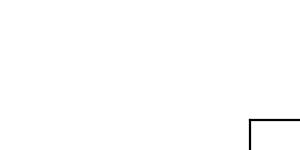

In [9]:
fd = np.loadtxt('/Users/olgaridzel/Research/olga-optical-data/MATLAB/organic/dna/dna_physdat_die.txt')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,3]

fd = pd.read_csv('../diimfp/dna_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]
E0 = 1600

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(dna_drude, exp_data, E0, n_q = 6)
result = opt_.runOptimisation(0.99, 0.01, maxeval = 50000, xtol_rel = 1e-4, isGlobal = True)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')

opt_ = opt.OptFit(oscOptimised, exp_data, E0, n_q = 6)
result = opt_.runOptimisation(0.95, 0.05, maxeval = 50000, xtol_rel = 1e-6)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = dna_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 2)}',linewidth=2)
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 3)}',linewidth=2)
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model} E0 = {E0/1000} keV')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_alpha={round(oscOptimised.oscillators.alpha,3)}_fit.png', dpi=600)

In [17]:
# As in the manuscript
# A = [0.039,0.077,0.081,0.043,0.064,0.066,0.075,0.078,0.064,0.064,0.017]
# gamma = [3.49,4.4,4.6,3.63,4.04,4.3,5.12,6.95,10.34,13.53,22.91]
# omega = [11.4,14.31,16.71,18.36,20.04,21.97,24.25,27.23,31.3,35.61,48.97]

# Without any zeroing
# A = [0.044, 0.04, 0.095, 0.041, 0.044, 0.058, 0.052, 0.062, 0.063, 0.08, 0.019]
# gamma = [3.807, 4.626, 5.639, 4.711, 4.745, 4.554, 5.646, 10.565, 14.858, 16.956, 70.238]
# omega = [12.957, 15.246, 20.942, 18.915, 23.325, 17.03, 25.993, 30.364, 23.871, 34.013, 58.818]

A = [0.037, 0.032, 0.084, 0.027, 0.044, 0.038, 0.055, 0.039, 0.043, 0.103, 0.075, 0.008, 0.016]
gamma = [3.417, 4.497, 5.324, 7.224, 3.607, 4.187, 3.717, 6.4, 16.063, 12.012, 12.722, 99.269, 90.085]
omega = [12.723, 15.509, 16.593, 20.754, 21.501, 24.612, 19.01, 23.189, 38.159, 28.376, 29.922, 44.798, 52.438]

M = (39 * 12.01 + 13 * 14.007 + 24 * 15.999 + 4 * 30.974 + 49 * 1.01) / (39 + 13 + 24 + 4 + 49) # Molar weight
rho = 1.35 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','n','o','p','h'], [39,13,24,4,49])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

dna_dl = opt.Material('DNA', oscillators, composition, eloss, q, xraypath)
dna_dl.Eg = 4.5
dna_dl.width_of_the_valence_band = 0.5
dna_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
dna_dl.static_refractive_index = 1.58
dna_dl.electron_density = 0.292
dna_dl.Z = 4.9
dna_dl.use_KK_constraint = False
dna_dl.use_kk_relation = False

fsum = dna_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(dna_dl.Z))

kksum = dna_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 4.644160556464786
Z = 4.9
Insulator Eg = 4.5
KKSum = 0.9757058314143646


In [ ]:
fd = np.loadtxt('/Users/olgaridzel/Research/olga-optical-data/MATLAB/organic/dna/dna_physdat_die.txt')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,3]

fd = pd.read_csv('../diimfp/dna_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(dna_dl, exp_data, 1600, n_q = 10)
result = opt_.runOptimisation('elf+ndiimfp', maxeval = 1000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = dna_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label='Fit')
axs[0].plot(exp_data.x_elf,exp_data.y_elf,label='Experimental data')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
axs[1].plot(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

In [19]:
import copy

currentU 1.0 UstepSize 1.0
currentU 2.0 UstepSize 1.0
currentU 3.0 UstepSize 1.0
currentU 4.0 UstepSize 1.0
currentU 5.0 UstepSize 1.0
currentU 6.0 UstepSize 1.0
currentU 7.0 UstepSize 1.0
currentU 8.0 UstepSize 1.0
currentU 9.0 UstepSize 1.0
currentU 10.0 UstepSize 1.0
currentU 11.0 UstepSize 1.0
currentU 12.0 UstepSize 1.0
newsumA 0.9185075885164012
currentU 11.1 UstepSize 0.1
currentU 11.2 UstepSize 0.1
currentU 11.299999999999999 UstepSize 0.1
currentU 11.399999999999999 UstepSize 0.1
currentU 11.499999999999998 UstepSize 0.1
newsumA 0.9850658137241252
currentU 11.409999999999998 UstepSize 0.01
currentU 11.419999999999998 UstepSize 0.01
currentU 11.429999999999998 UstepSize 0.01
currentU 11.439999999999998 UstepSize 0.01
currentU 11.449999999999998 UstepSize 0.01
currentU 11.459999999999997 UstepSize 0.01
currentU 11.469999999999997 UstepSize 0.01
currentU 11.479999999999997 UstepSize 0.01
newsumA 0.9997889429862088


<IPython.core.display.Javascript object>


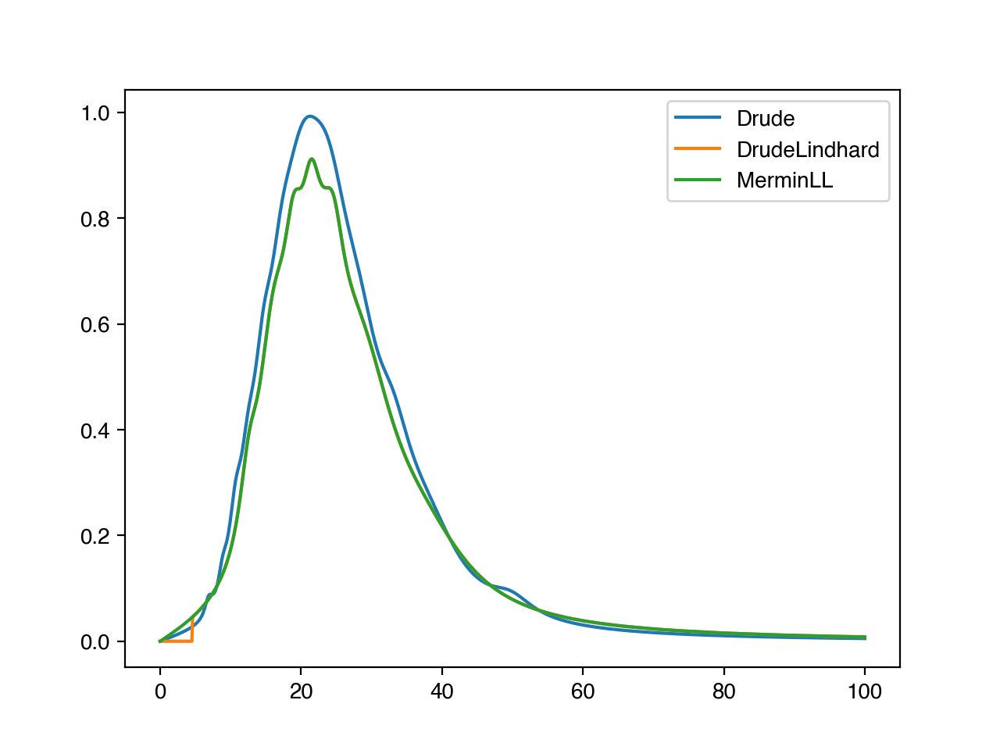

In [20]:
dna_dl.calculateELF()
# dna_drude.calculateELF()

osc = copy.deepcopy(dna_dl)
osc.convert_to_MLL()
dna_mll = osc
dna_mll.oscillators.model = 'MerminLL'
dna_mll.calculateELF()

plt.figure()
plt.plot(dna_drude.eloss, dna_drude.ELF, label=dna_drude.oscillators.model)
plt.plot(dna_dl.eloss, dna_dl.ELF, label=dna_dl.oscillators.model)
plt.plot(dna_mll.eloss, dna_mll.ELF, label=dna_mll.oscillators.model)
plt.legend()
plt.show()

In [13]:
fd = pd.read_csv('../diimfp/dna_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

In [ ]:
# dna_dl = oscOptimised
plt.figure()

dna_dl.calculateDIIMFP(1600, decdigs = 8)
plt.plot(dna_dl.DIIMFP_E, dna_dl.DIIMFP, label='DL')

osc = dna_dl
osc.convert_to_MLL()
dna_mll = osc
dna_mll.oscillators.model = 'MerminLL'
# dna_mll.calculateELF()

dna_mll.calculateDIIMFP(1600, decdigs = 8)
plt.plot(dna_mll.DIIMFP_E, dna_mll.DIIMFP, label='MLL')
plt.plot(x_exp_ndiimfp,y_exp_ndiimfp,label='Experimental data')

plt.xlabel('$\omega$ (eV)')
plt.xlim(0,100)
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


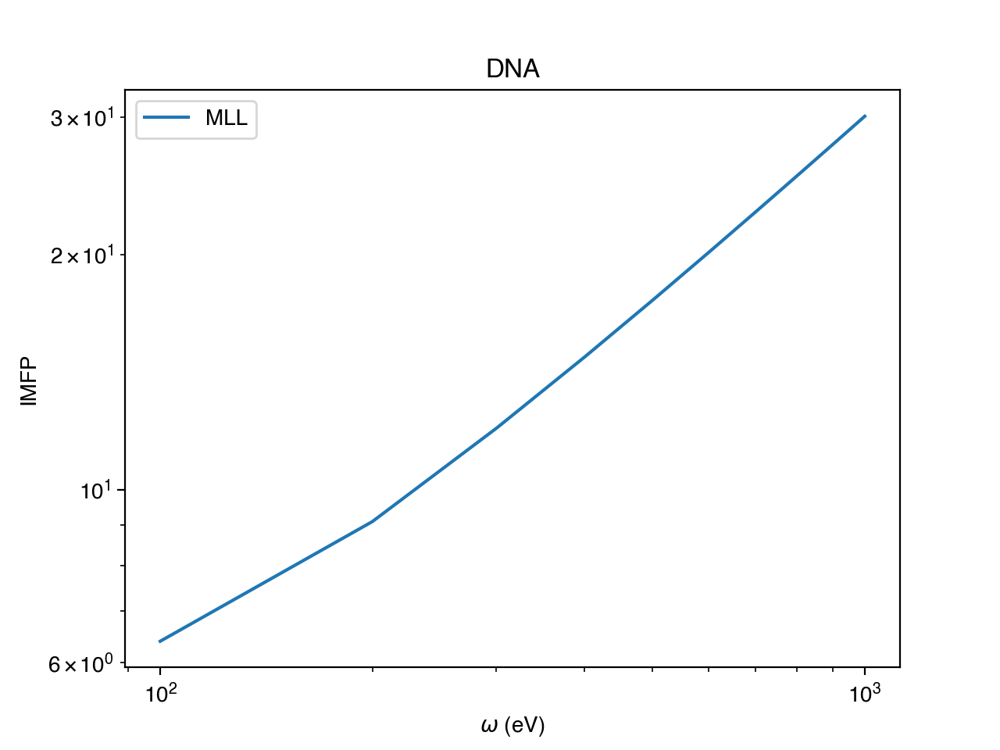

In [21]:
# osc = dna_drude
energy = opt.linspace(100, 1000, 100)

plt.figure()
plt.title(f'{osc.name}')
# osc.calculateIMFP(energy, False)
# plt.plot(osc.IMFP_E, osc.IMFP, label='Drude')

osc = dna_mll
osc.calculateIMFP(energy, False)
plt.plot(osc.IMFP_E, osc.IMFP, label='MLL')

plt.xscale('log')
plt.yscale('log')

plt.xlabel('$\omega$ (eV)')
plt.ylabel('IMFP')
plt.legend()
plt.show()

In [22]:

fd = np.loadtxt('/Users/olgaridzel/Research/olga-optical-data/imfp/tpp_data.dat')
plt.plot(fd[:,0], fd[:,5], label='TPP data')

**Irganox**

In [7]:
# As in the manuscript
# A = [4.19,16.58,32.18,55.48,35.05,9.03,21.51,25.32,29.22,11.87,34.75,30.35,30.16,30.86,16.16]
# gamma = [0.7,2.3,3.3,4.1,4.2,3.2,5.3,6.2,8.0,14.5,11.5,13.7,14.3,16.5,14.0]
# omega = [6.2,9.6,11.4,13.6,16.2,18.3,19.7,22.0,25.4,30.0,30.6,38.0,46.6,56.7,72.9]

# Without zeroing
# A = [4.667, 16.59, 31.492, 58.43, 37.051, 8.94, 21.39, 24.572, 29.22, 12.774, 35.013, 29.573, 30.212, 28.056, 15.357]
# gamma = [0.68, 1.934, 2.833, 3.897, 4.113, 3.117, 5.017, 5.866, 7.663, 14.555, 11.254, 13.36, 13.861, 16.395, 23.818]
# omega = [6.182, 9.544, 11.319, 13.551, 16.179, 18.301, 19.717, 21.973, 25.445, 30.383, 30.607, 38.028, 46.611, 56.809, 72.715]

# A = [4.902, 16.275, 31.551, 58.15, 37.036, 8.862, 21.332, 24.783, 29.246, 12.668, 34.702, 28.918, 30.692, 28.956, 15.259]
# gamma = [0.661, 1.966, 2.906, 3.942, 4.096, 3.118, 5.011, 5.867, 7.638, 14.043, 11.494, 13.297, 14.055, 16.682, 21.755]
# omega = [6.145, 9.524, 11.325, 13.555, 16.192, 18.336, 19.735, 22.006, 25.531, 30.309, 30.743, 37.968, 46.557, 56.757, 72.479]

A = [3.175, 23.118, 43.815, 43.116, 20.857, 11.21, 18.649, 25.724, 27.698, 10.446, 29.612, 25.11, 27.582, 23.499, 11.213]
gamma = [0.49, 2.177, 3.416, 3.328, 3.763, 3.208, 5.557, 10.715, 7.441, 24.825, 19.602, 22.928, 24.288, 31.212, 36.812]
omega = [6.353, 9.748, 11.889, 14.35, 16.827, 18.756, 21.178, 20.514, 25.598, 31.111, 31.722, 37.566, 43.084, 76.591, 79.106]
alpha = 0.01

M = (73 * 12.01 + 12 * 15.999 + 108 * 1.01) / (73 + 12 + 108) # Molar weight
Z_av = (73 * 6 + 12 * 8 + 108 * 1) / (73 + 12 + 108) # Molar weight
rho = 1.077 #1.15 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','o','h'], [73,12,108])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

irganox_drude = opt.Material('Irganox', oscillators, composition, eloss, q, xraypath)
irganox_drude.Eg = 5.4
irganox_drude.width_of_the_valence_band = 10
irganox_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
irganox_drude.static_refractive_index = 1.535
irganox_drude.electron_density = 0.278
irganox_drude.Z = Z_av
# irganox_drude.use_henke_for_ne = True
irganox_drude.use_KK_relation = False

fsum = irganox_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(irganox_drude.Z))

kksum = irganox_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.093782210913928
Z = 3.326424870466321
Insulator Eg = 5.4
KKSum = 0.964184070059906


Starting optimisation...
found minimum after 10000 evaluations
minimum value =  0.0007538488753717236
result code =  5
FSum = 3.2703125887276245
Z = 3.326424870466321
Insulator Eg = 5.4
KKSum = 0.9993627844452034
A = [3.48, 26.432, 35.877, 52.64, 25.22, 9.178, 22.021, 28.676, 31.995, 21.74, 34.626, 28.17, 33.132, 17.477, 12.701]
gamma = [0.097, 1.619, 2.752, 2.769, 2.974, 2.893, 5.868, 6.495, 9.078, 22.81, 14.663, 20.378, 25.341, 57.881, 67.52]
omega = [6.363, 9.527, 13.805, 11.677, 15.994, 18.144, 21.236, 19.062, 25.037, 31.899, 30.162, 48.827, 39.275, 138.684, 58.708]
alpha = 0.008575294907850767


<IPython.core.display.Javascript object>


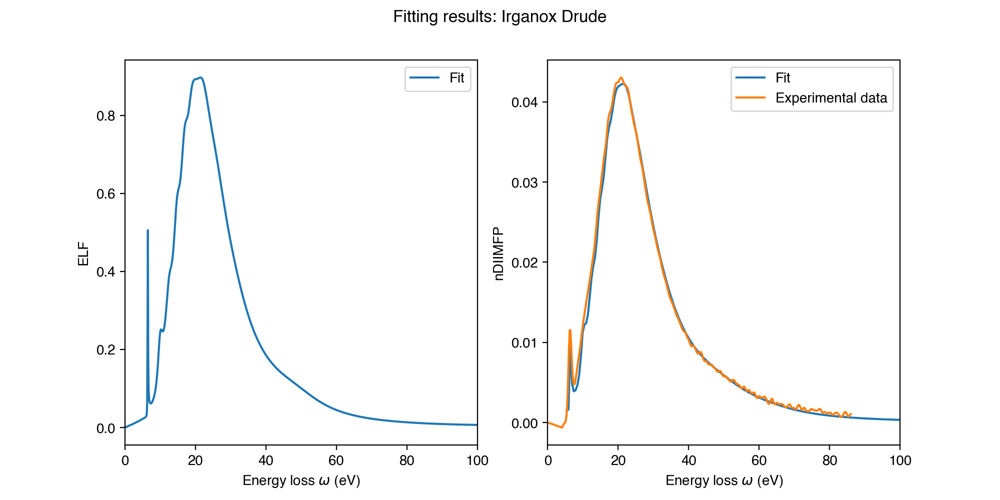

In [9]:
fd = np.loadtxt('/Users/olgaridzel/Research/olga-optical-data/MATLAB/organic/dna/dna_physdat_die.txt')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,3]

fd = pd.read_csv('../diimfp/irganox_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(irganox_drude, exp_data, 1600, n_q = 8)
result = opt_.runOptimisation(1, 0, maxeval = 10000, xtol_rel = 1e-4, isGlobal = False)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label='Fit')
# axs[0].plot(exp_data.x_elf,exp_data.y_elf,label='Experimental data')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
axs[1].plot(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

<IPython.core.display.Javascript object>


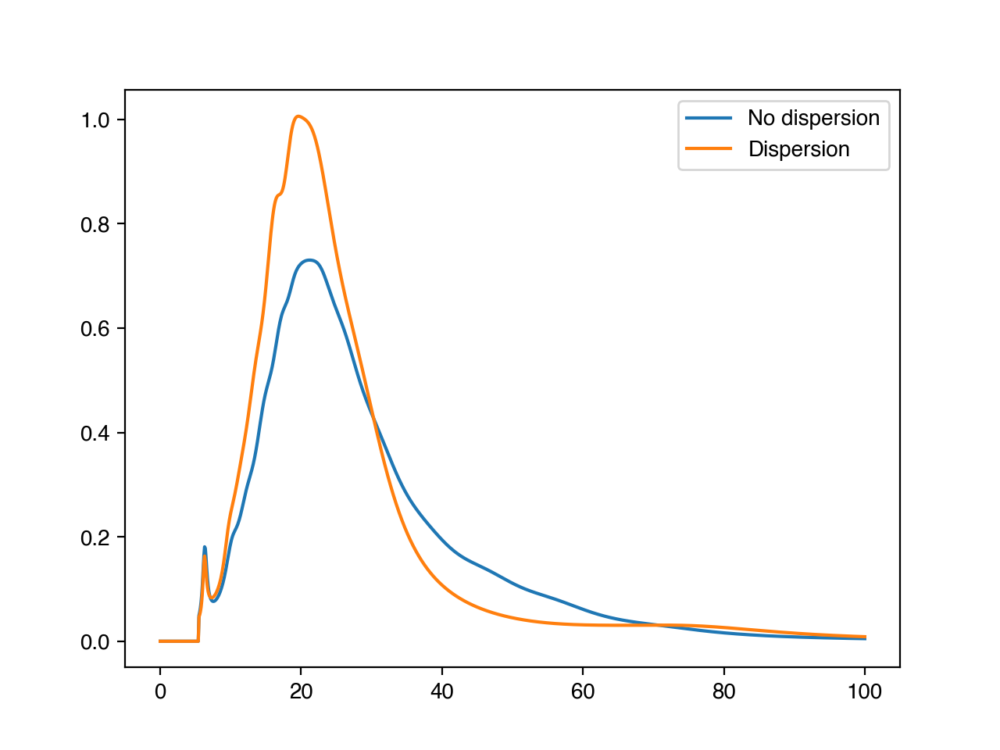

In [15]:
plt.figure()
oscOptimised.calculateELF()
irganox_drude.calculateELF()

plt.plot(irganox_drude.eloss, irganox_drude.ELF, label="No dispersion")
plt.plot(oscOptimised.eloss, oscOptimised.ELF, label="Dispersion")
plt.legend()
plt.show()

In [15]:
# A = [0.013, 0.024, 0.022, 0.034, 0.041, 0.027, 0.039, 0.036, 0.029, 0.052, 0.011, 0.027, 0.028, 0.032, 0.034, 0.039, 0.026, 0.009]
# gamma = [0.62, 2.75, 2.38, 2.91, 3.33, 2.23, 2.68, 3.01, 3.13, 3.95, 2.79, 3.99, 5.79, 7.61, 16.11, 32.31, 23.78, 99.65]
# omega = [6.36, 10.4, 12.42, 14.49, 16, 17.34, 18.96, 20.47, 21.81, 23.44, 25.11, 26.6, 28.72, 31.73, 35.99, 41.09, 48.01, 57.08]

# without zeroing
# A = [0.013, 0.024, 0.029, 0.035, 0.044, 0.03, 0.058, 0.043, 0.075, 0.062, 0.037, 0.057, 0.023, 0.026, 0.019]
# gamma = [0.511, 2.481, 2.701, 2.638, 3.082, 3.544, 3.203, 3.146, 4.689, 5.731, 7.032, 18.638, 26.579, 27.136, 99.978]
# omega = [6.38, 12.943, 10.833, 14.815, 17.403, 16.401, 19.374, 21.348, 23.631, 26.858, 31.113, 35.888, 42.553, 48.058, 56.081]

# with zeroing
A = [0.014, 0.026, 0.028, 0.035, 0.043, 0.03, 0.057, 0.043, 0.076, 0.062, 0.036, 0.059, 0.04, 0.026]
gamma = [0.68, 2.481, 2.795, 2.643, 3.118, 3.516, 3.257, 3.211, 4.879, 5.891, 7.039, 18.281, 30.005, 28.457]
omega = [6.347, 12.791, 10.658, 14.778, 17.372, 16.354, 19.314, 21.284, 23.542, 26.693, 30.872, 35.326, 42.145, 50.619]

M = (73 * 12.01 + 12 * 15.999 + 108 * 1.01) / (73 + 12 +108) # Molar weight
rho = 1.15 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','o','h'], [73,12,108])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

irganox_dl = opt.Material('Irganox', oscillators, composition, eloss, q, xraypath)
irganox_dl.Eg = 5.4
irganox_dl.width_of_the_valence_band = 10
irganox_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
irganox_dl.static_refractive_index = 1.535
irganox_dl.electron_density = 0.278
irganox_dl.Z = 3.3
irganox_dl.use_henke_for_ne = False
irganox_dl.use_KK_constraint = False
irganox_dl.use_KK_relation = False

fsum = irganox_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(irganox_dl.Z))

kksum = irganox_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.3028653405536534
Z = 3.3
KKSum = 0.9739490831704654


<IPython.core.display.Javascript object>


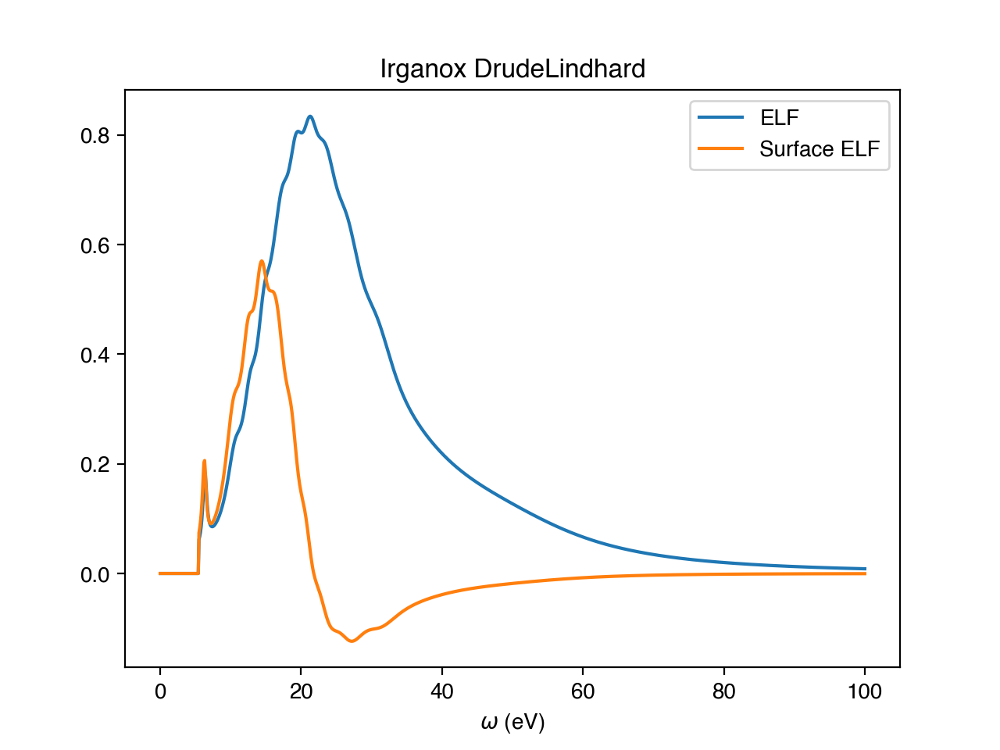

In [16]:
osc = irganox_dl
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


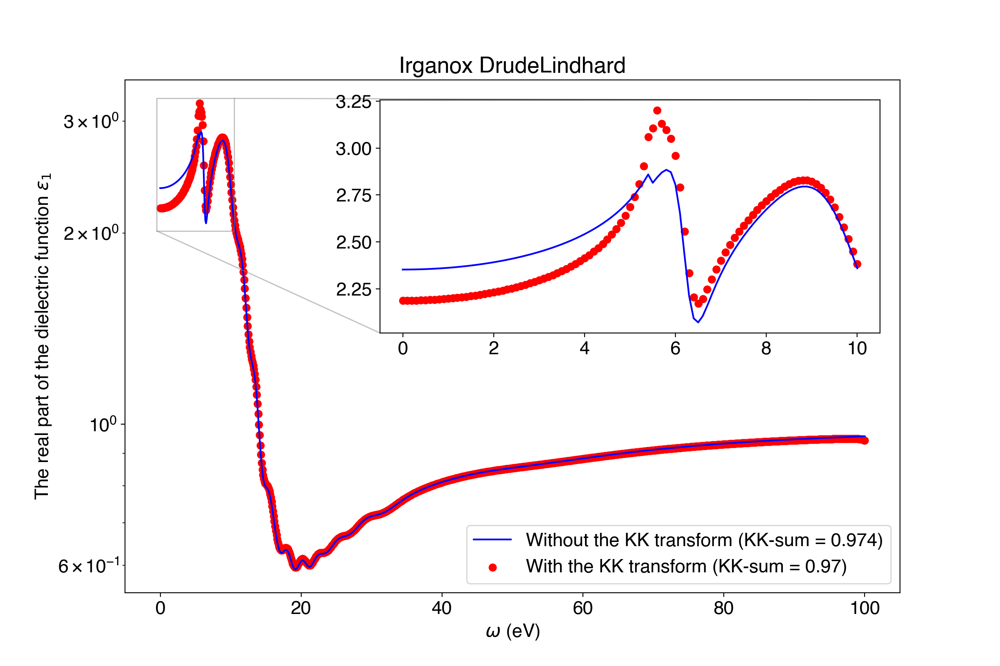

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 3.3028653405536534
KKSum = 0.9739490831704654

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 3.3003921858321212
KKSum = 0.9696580354426866


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [15]:
fig, ax = plt.subplots(figsize=[12,8])

osc = irganox_dl
x_limit = 10

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 3.306470771889163
Z = 3.3
KKSum = 0.9750795008404282
A = [0.014, 0.026, 0.028, 0.035, 0.043, 0.03, 0.057, 0.043, 0.076, 0.062, 0.036, 0.059, 0.04, 0.026]
gamma = [0.478, 2.481, 2.795, 2.643, 3.118, 3.516, 3.257, 3.211, 4.879, 5.891, 7.039, 18.281, 30.005, 28.457]
omega = [6.347, 12.791, 10.658, 14.778, 17.372, 16.354, 19.314, 21.284, 23.542, 26.693, 30.872, 35.326, 42.145, 50.619]
osc.A = [0.014 0.026 0.028 0.035 0.043 0.03 0.057 0.043 0.076 0.062 0.036 0.059 0.04 0.026];
osc.G = [0.478 2.481 2.795 2.643 3.118 3.516 3.257 3.211 4.879 5.891 7.039 18.281 30.005 28.457];
osc.Om = [6.347 12.791 10.658 14.778 17.372 16.354 19.314 21.284 23.542 26.693 30.872 35.326 42.145 50.619];


<IPython.core.display.Javascript object>


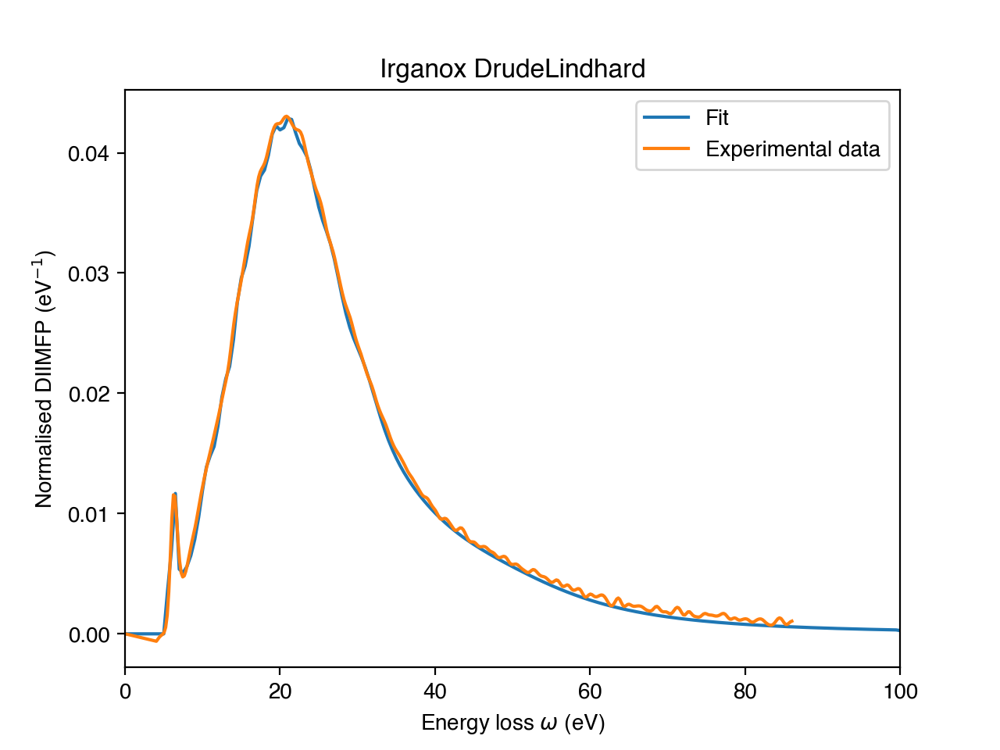

In [35]:
fd = pd.read_csv('../diimfp/irganox_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(irganox_dl, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 1000, xtol_rel = 1e-14)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


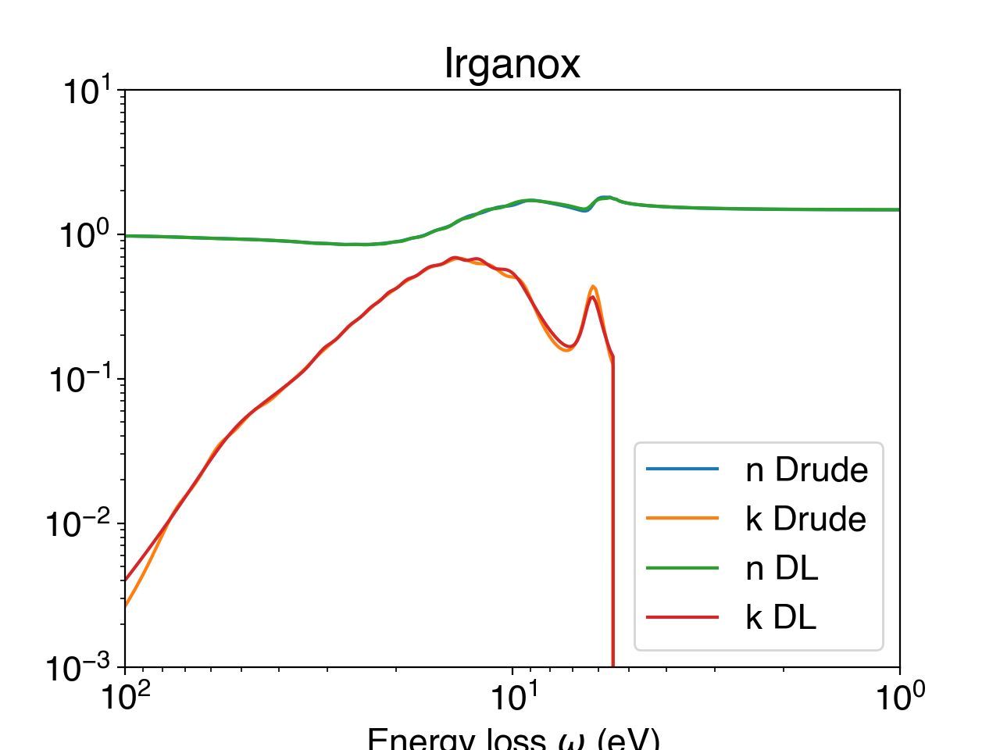

In [16]:
irganox_drude.calculateOpticalConstants()

plt.figure()
plt.plot(irganox_drude.eloss,irganox_drude.refractive_index,label='n Drude')
plt.plot(irganox_drude.eloss,irganox_drude.extinction_coefficient,label='k Drude')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(100,1)
plt.ylim(0.001,10)
plt.title(f'{irganox_drude.name}')

irganox_dl.calculateOpticalConstants_()
plt.plot(irganox_dl.eloss,irganox_dl.refractive_index,label='n DL')
plt.plot(irganox_dl.eloss,irganox_dl.extinction_coefficient,label='k DL')

plt.legend()
plt.show()

irganox_drude.writeOpticalData()

**Kapton**

In [61]:
# A = [30.3300, 9.3000, 23.8700, 42.6400, 42.3600, 35.4100, 71.0900, 38.1300, 31.0700, 32.3500, 30.4500, 27.7000, 10.89]
# gamma = [1.9000, 1.5000, 2.5000, 3.5000, 5.0, 6.3000, 10.1000, 10.2000, 11.6000, 15.2000, 17.7000, 14.1000, 8.7000]
# omega = [5.5000, 8.7000, 10.1000, 11.8000, 14.2000, 16.7000, 20.1000, 25.3000, 31.4000, 38.2000, 47.5000, 57.0, 66.1000]

A = [15.716, 48.928, 16.765, 42.76, 41.428, 55.707, 47.382, 19.805, 34.794, 26.037, 31.393, 18.785, 5.702]
gamma = [1.023, 4.701, 3.873, 3.848, 4.523, 6.531, 11.156, 14.512, 13.045, 13.183, 13.242, 99.433, 96.535]
omega = [5.759, 12.6, 10.456, 10.978, 15.167, 18.34, 23.732, 26.705, 32.185, 21.851, 41.859, 488.742, 437.641]
alpha = 0.01

M = (22 * 12.01 + 2 * 14.007 + 5 * 15.999 + 10 * 1.01) / (22 + 2 + 5 + 10) # Molar weight
Z_av = (22 * 6 + 2 * 7 + 5 * 8 + 10 * 1) / (22 + 2 + 5 + 10)
rho = 1.42 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','n','o','h'], [22,2,5,10])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

kapton_drude = opt.Material('Kapton', oscillators, composition, eloss, q, xraypath)
kapton_drude.Eg = 4.2
kapton_drude.width_of_the_valence_band = 18.8
kapton_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
kapton_drude.static_refractive_index = 1.8515 #1.754
kapton_drude.electron_density = 0.309
kapton_drude.Z = Z_av
kapton_drude.use_henke_for_ne = False
kapton_drude.use_KK_relation = False

fsum = kapton_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(kapton_drude.Z))

kksum = kapton_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 4.664007995731456
Z = 5.0256410256410255
Insulator Eg = 4.2
KKSum = 0.9431760492593628


Starting optimisation...
found minimum after 10000 evaluations
minimum value =  0.004475137957369894
result code =  5
FSum = 4.7821180259047935
Z = 5.0256410256410255
Insulator Eg = 4.2
KKSum = 0.9633396599911578
A = [19.11, 54.043, 17.738, 47.158, 43.273, 55.487, 45.972, 19.677, 38.993, 24.829, 31.268, 32.861, 9.843]
gamma = [1.091, 4.499, 6.732, 3.516, 4.944, 7.563, 11.252, 12.532, 14.883, 12.621, 16.777, 99.427, 96.399]
omega = [5.66, 12.664, 11.112, 10.357, 15.698, 19.158, 25.278, 30.308, 36.769, 22.045, 49.503, 488.682, 437.238]
alpha = 0.009799088708492497


<IPython.core.display.Javascript object>


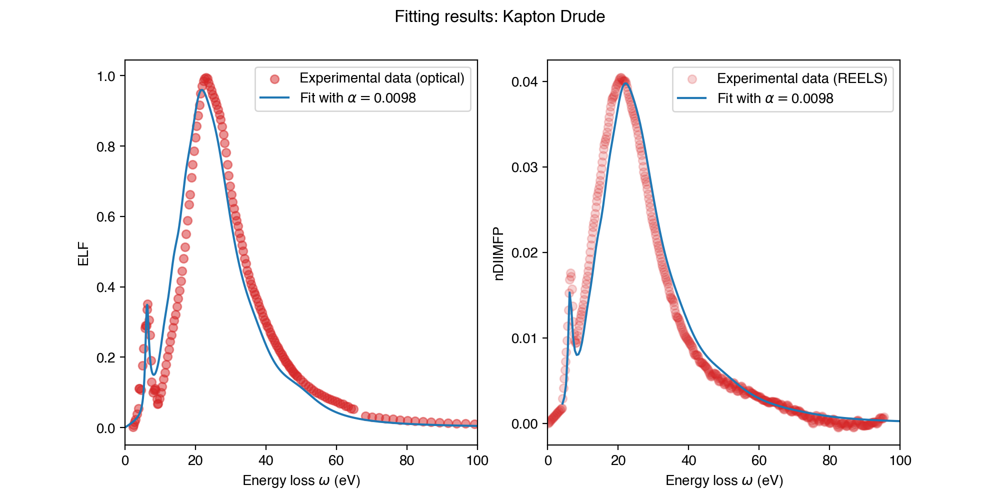

In [62]:
fd = np.loadtxt('/Users/olgaridzel/Research/PHYSDAT/opt/pal/kapton.diel')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,1]

fd = pd.read_csv('../diimfp/kapton_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(kapton_drude, exp_data, 1600, n_q = 8)
result = opt_.runOptimisation(0.95,0.05, maxeval = 10000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = kapton_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_fit.png', dpi=600)

<IPython.core.display.Javascript object>


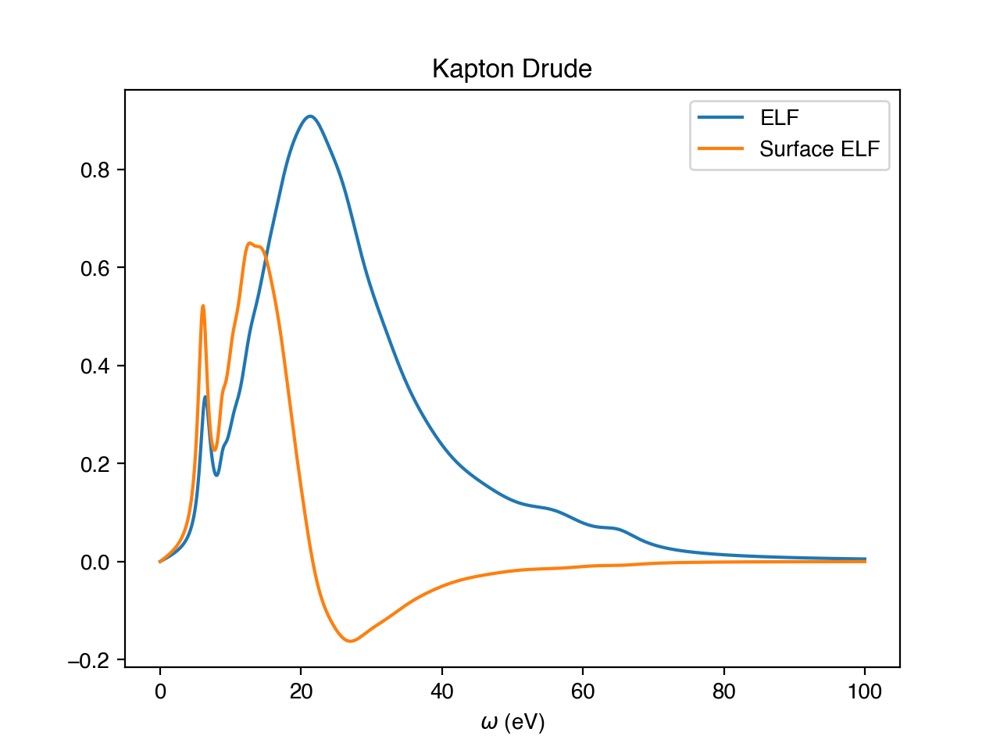

In [4]:
osc = kapton_drude
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


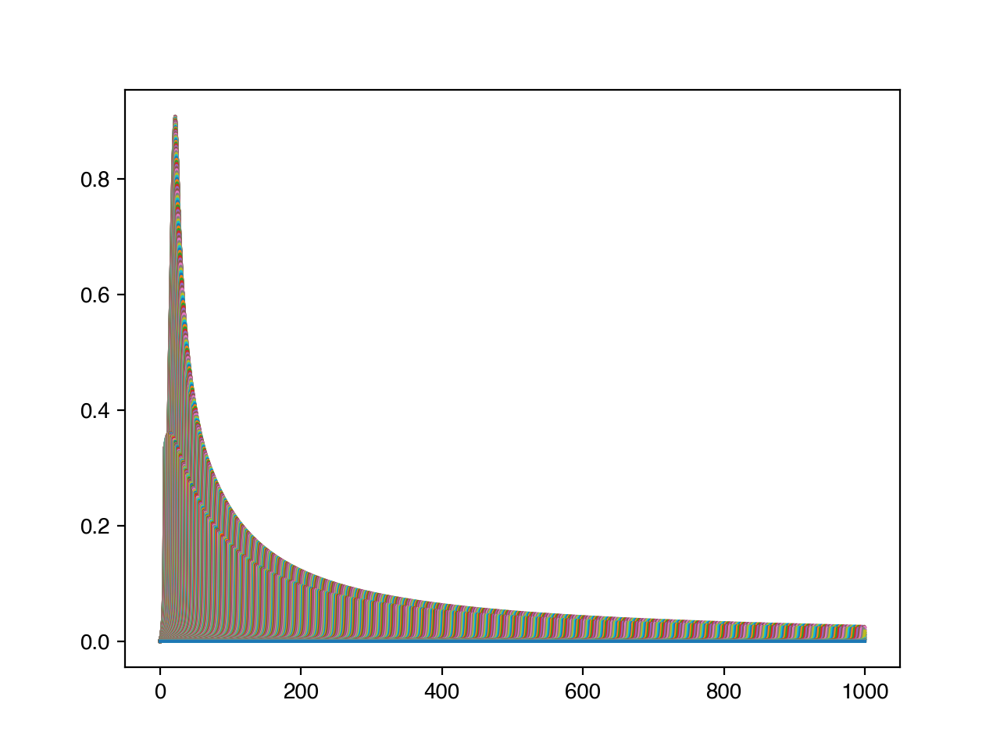

In [9]:
plt.figure()

kapton_drude.eloss = np.linspace(0,1000,5000)
q_list = opt.linspace(0.0, 20, 0.02)

fd = open('/Users/olgaridzel/Research/MAST-SEY/examples/Kapton/Kapton_CUSTOM_Drude/elf.in', 'w')

for q in q_list:
    kapton_drude.q = q
    kapton_drude.calculateELF()
    for i in range(len(kapton_drude.eloss)):
        fd.write(f'{kapton_drude.eloss[i]:.8f} {kapton_drude.ELF[i]:.8f}\n')
    fd.write(f'{q} {q}\n')
    fd.write('99999999 99999999\n')
    plt.plot(kapton_drude.eloss, kapton_drude.ELF)
    
plt.show()
fd.close()

<IPython.core.display.Javascript object>


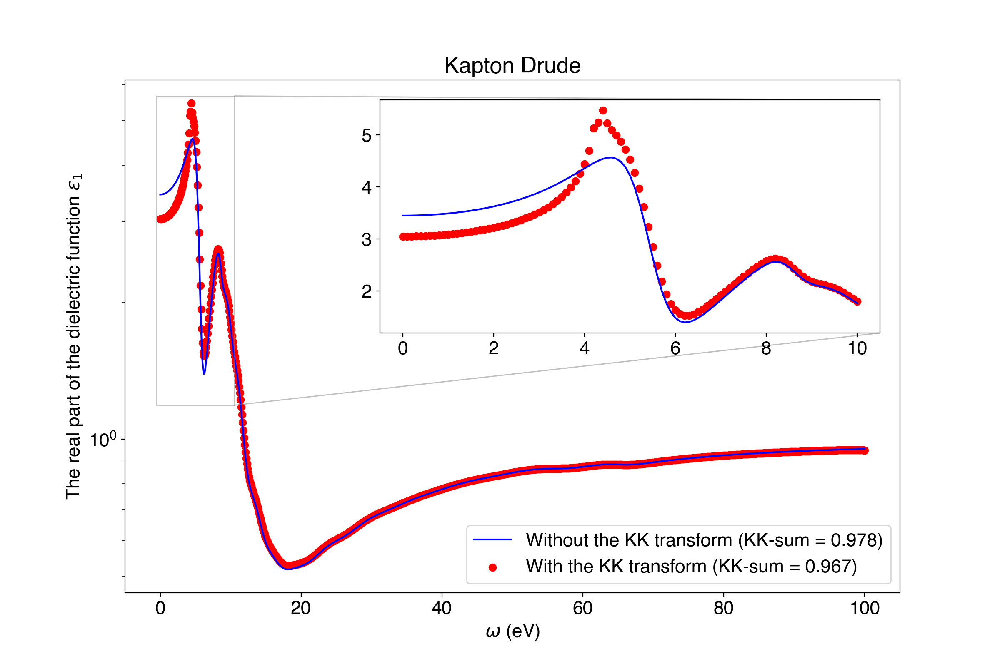

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 5.0042493345434895
KKSum = 0.9778375916072901

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 4.984791928080567
KKSum = 0.9670816721072037


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [59]:
fig, ax = plt.subplots(figsize=[12,8])

osc = kapton_drude
x_limit = 10

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 4.874408386954025
Z = 5.0256410256410255
Insulator Eg = 4.2
KKSum = 1.0272955155868129
A = [36.737, 17.353, 22.045, 41.225, 44.642, 34.626, 81.875, 35.985, 26.373, 27.593, 22.787, 24.752, 10.084]
gamma = [1.389, 1.481, 3.151, 3.081, 5.013, 9.913, 15.508, 17.003, 17.846, 28.059, 28.953, 23.294, 12.896]
omega = [5.353, 8.768, 9.883, 11.123, 14.146, 17.151, 19.406, 23.086, 28.445, 34.035, 45.31, 84.537, 59.237]
alpha = 0.0083035835499186

osc.A = [36.737 17.353 22.045 41.225 44.642 34.626 81.875 35.985 26.373 27.593 22.787 24.752 10.084];
osc.G = [1.389 1.481 3.151 3.081 5.013 9.913 15.508 17.003 17.846 28.059 28.953 23.294 12.896];
osc.Om = [5.353 8.768 9.883 11.123 14.146 17.151 19.406 23.086 28.445 34.035 45.31 84.537 59.237];


<IPython.core.display.Javascript object>


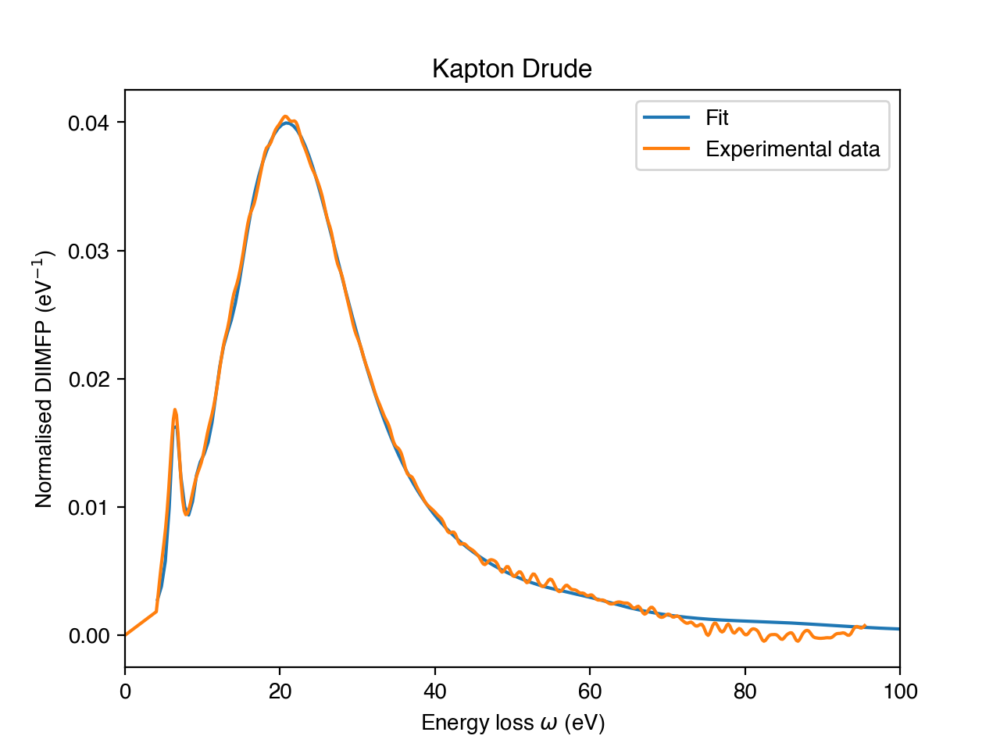

In [17]:
fd = pd.read_csv('../diimfp/kapton_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(kapton_drude, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 500, xtol_rel = 1e-12)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
print()
print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

In [19]:
#A = [0.06, 0.017, 0.021, 0.05, 0.026, 0.062, 0.048, 0.035, 0.045, 0.031, 0.059, 0.031, 0.041, 0.004, 0.063, 0.024, 0.026, 0.01, 0.027]
#gamma = [1.66, 4.65, 3.3, 3.67, 2.84, 3.53, 3.12, 3.1, 3.97, 4.43, 6.01, 5.65, 6.7, 6.87, 10.9, 15.87, 13.52, 59.05, 22.89]
#omega = [6.44, 9.87, 10.34, 12.71, 14.26, 16.13, 18.09, 19.75, 21.32, 22.54, 24.33, 25.61, 27.97, 28.57, 32.36, 32.96, 40.32, 40.91, 55.29]

# A = [0.048, 0.018, 0.041, 0.02, 0.081, 0.045, 0.052, 0.119, 0.122, 0.038, 0.042, 0.028, 0.021]
# gamma = [1.326, 3.526, 3.593, 2.554, 4.479, 3.745, 4.53, 7.703, 11.122, 12.459, 98.707, 36.772, 28.252]
# omega = [6.44, 10.135, 12.451, 14.225, 16.549, 18.862, 21.043, 23.84, 28.261, 35.181, 36.657, 43.673, 49.898]

# with zeroing
A = [0.049, 0.036, 0.042, 0.02, 0.093, 0.045, 0.047, 0.114, 0.145, 0.036, 0.025, 0.021]
gamma = [1.313, 5.345, 3.732, 2.852, 4.724, 3.975, 4.801, 8.996, 12.028, 13.034, 38.271, 23.605]
omega = [6.398, 10.408, 12.754, 14.484, 16.963, 19.503, 21.736, 24.06, 28.204, 36.04, 46.39, 51.72]

M = (22 * 12.01 + 2 * 14.007 + 5 * 15.999 + 10 * 1.01) / (22 + 2 + 5 + 10) # Molar weight
rho = 1.42 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','n','o','h'], [22,2,5,10])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

kapton_dl = opt.Material('Kapton', oscillators, composition, eloss, q, xraypath)
kapton_dl.Eg = 4.2
kapton_dl.width_of_the_valence_band = 10
kapton_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
kapton_dl.static_refractive_index = 1.8515 #1.754
kapton_dl.electron_density = 0.309
kapton_dl.Z = 5
kapton_dl.use_henke_for_ne = False
kapton_dl.use_KK_constraint = False
kapton_dl.use_KK_relation = False

fsum = kapton_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(kapton_dl.Z))

kksum = kapton_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 4.803494375339016
Z = 5
KKSum = 0.9300972594410731


<IPython.core.display.Javascript object>


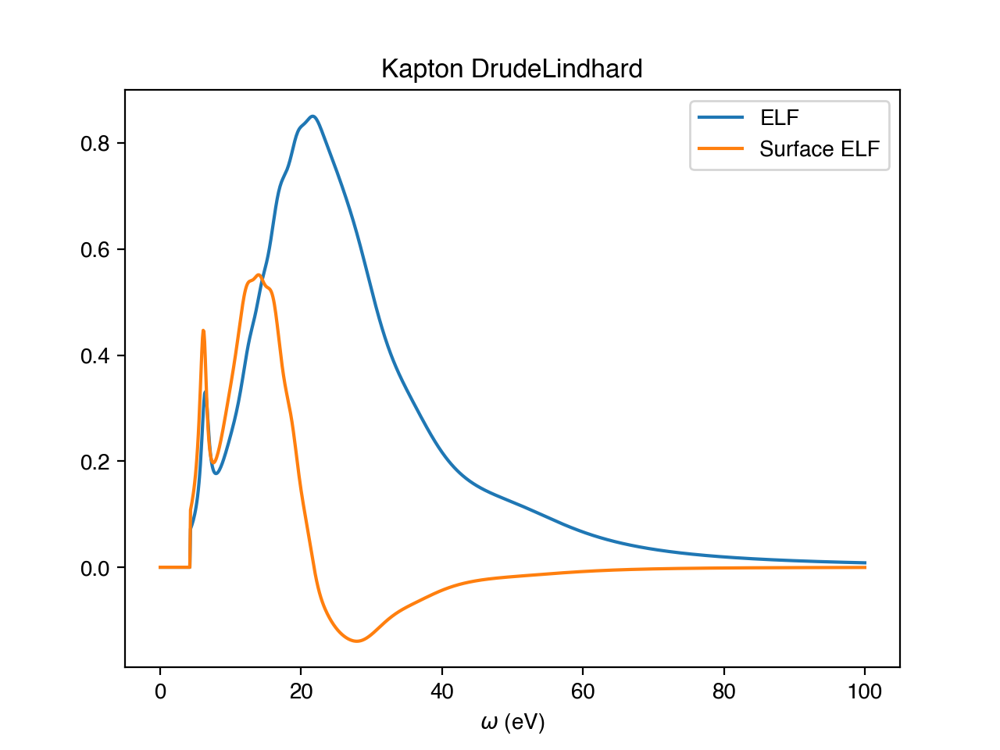

In [20]:
osc = kapton_dl
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


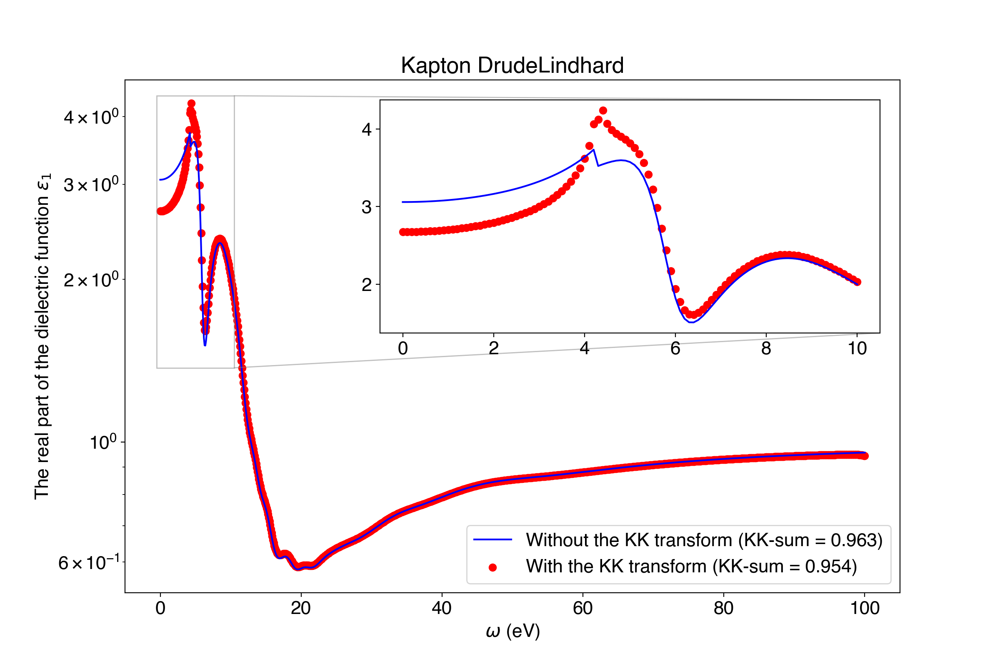

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 4.803494375339016
KKSum = 0.9634294230421128

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 4.793470298713192
KKSum = 0.9542273099274674


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [20]:
fig, ax = plt.subplots(figsize=[12,8])

osc = kapton_dl
x_limit = 10

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 4.983761138881817
Z = 5
KKSum = 0.9636500923260423
A = [0.05, 0.037, 0.041, 0.022, 0.1, 0.046, 0.047, 0.124, 0.158, 0.038, 0.024, 0.021]
gamma = [1.32, 5.307, 3.667, 2.924, 4.836, 3.85, 4.749, 8.82, 12.802, 12.273, 34.882, 23.223]
omega = [6.41, 10.535, 12.604, 14.328, 16.875, 19.431, 21.598, 24.094, 28.262, 35.961, 46.327, 53.123]
osc.A = [0.05 0.037 0.041 0.022 0.1 0.046 0.047 0.124 0.158 0.038 0.024 0.021];
osc.G = [1.32 5.307 3.667 2.924 4.836 3.85 4.749 8.82 12.802 12.273 34.882 23.223];
osc.Om = [6.41 10.535 12.604 14.328 16.875 19.431 21.598 24.094 28.262 35.961 46.327 53.123];


<IPython.core.display.Javascript object>


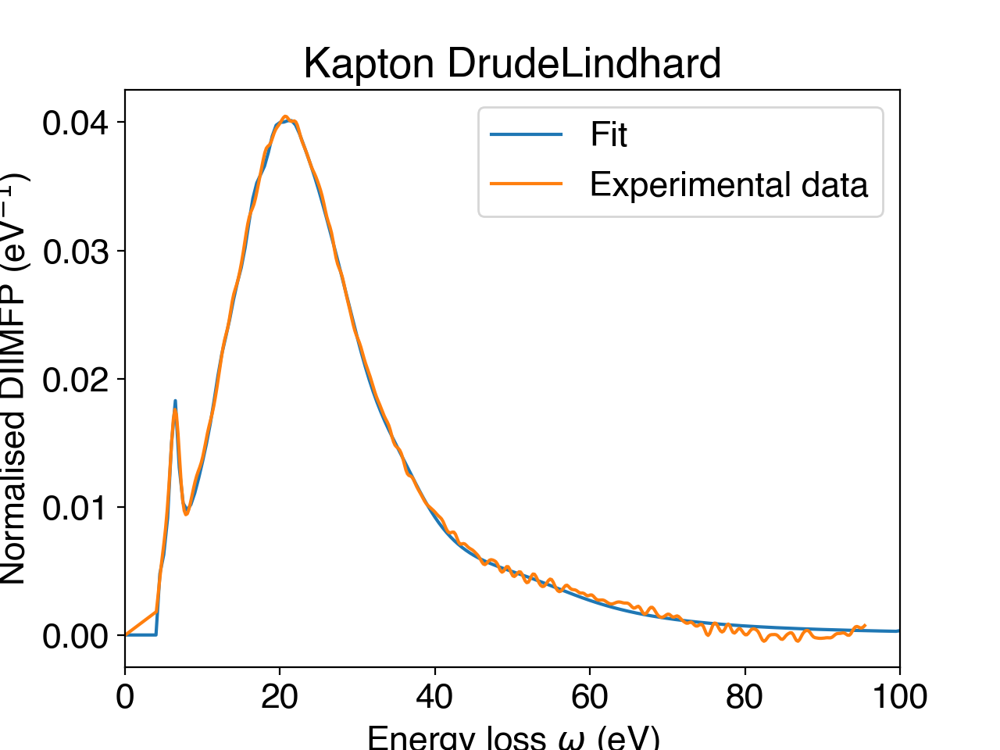

In [61]:
fd = pd.read_csv('../diimfp/kapton_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(kapton_dl, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 1000, xtol_rel = 1e-12)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


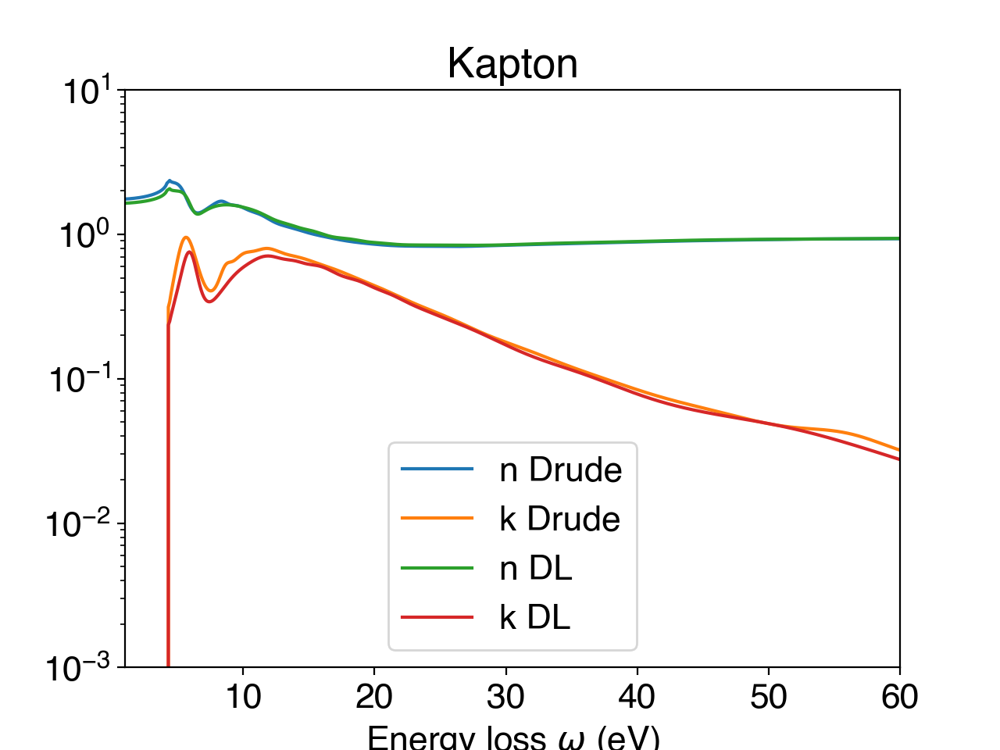

In [57]:
kapton_drude.calculateOpticalConstants()

plt.figure()
plt.plot(kapton_drude.eloss,kapton_drude.refractive_index,label='n Drude')
plt.plot(kapton_drude.eloss,kapton_drude.extinction_coefficient,label='k Drude')
plt.yscale('log')
# plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(1,60)
plt.ylim(0.001,10)
plt.title(f'{kapton_drude.name}')

kapton_dl.calculateOpticalConstants_()
plt.plot(kapton_dl.eloss,kapton_dl.refractive_index,label='n DL')
plt.plot(kapton_dl.eloss,kapton_dl.extinction_coefficient,label='k DL')

plt.legend()
plt.show()

kapton_drude.writeOpticalData()

**PE**

In [43]:
# A = [30.9649, 33.8626, 33.8368, 29.324 , 26.0666, 27.1075, 27.4519, 10.9467, 12.1362, 18.0936, 20.9278, 34.1272, 20.536,  8.4471]
# gamma = [0.6, 1.5, 2.6, 2.9, 3.6, 11.9, 4.4, 3.4, 3.9, 6.7, 12.1, 14.3, 16.8, 89.7]
# omega = [7.9, 8.4, 9.7, 10.9, 12.5, 14.8, 14.9, 17.3, 19.5, 22.2, 26.0, 26.1, 31.2, 72.0]

A = [46.756, 32.41, 32.744, 30.936, 22.237, 26.408, 27.192, 10.514, 12.4, 18.2, 19.23, 34.227, 20.43]
gamma = [0.543, 1.324, 2.303, 2.902, 3.413, 11.551, 4.273, 3.307, 3.801, 6.477, 11.59, 13.44, 15.978]
omega = [7.8, 8.247, 9.754, 11.033, 12.617, 15.735, 14.889, 17.253, 19.519, 22.273, 26.339, 26.062, 31.873]

alpha = 0.7437098952025178

M = (2 * 12.01 + 4 * 1.01) / (2 + 4) # Molar weight
Z_av = (2 * 6 + 4 * 1) / (2 + 4)
rho = 0.94 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','h'], [2,4]) # well defined quantity
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pe_drude = opt.Material('PE', oscillators, composition, eloss, q, xraypath)
pe_drude.Eg = 7.5
pe_drude.width_of_the_valence_band = 15.5
pe_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
pe_drude.static_refractive_index = 1.519
pe_drude.electron_density = 0.242
pe_drude.Z = Z_av
pe_drude.use_henke_for_ne = False
pe_drude.use_KK_relation = True

fsum = pe_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pe_drude.Z))

kksum = pe_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 2.62014697578462
Z = 2.6666666666666665
Insulator Eg = 7.5
KKSum = 1.1414945052891385


Starting optimisation...
found minimum after 5000 evaluations
minimum value =  0.004666869127022351
result code =  5
FSum = 2.098623640024404
Z = 2.6666666666666665
Insulator Eg = 7.5
KKSum = 0.9775248781571602
A = [5.83, 18.182, 31.635, 18.537, 30.203, 24.286, 26.874, 15.036, 18.997, 16.989, 9.644, 21.395, 5.8]
gamma = [0.369, 1.604, 3.339, 2.207, 3.003, 9.823, 4.06, 4.104, 4.84, 11.566, 20.653, 6.404, 30.092]
omega = [8.188, 9.229, 11.591, 11.972, 13.708, 19.86, 15.491, 16.685, 18.985, 24.474, 31.047, 24.266, 27.422]
alpha = 0.721598779694556


<IPython.core.display.Javascript object>


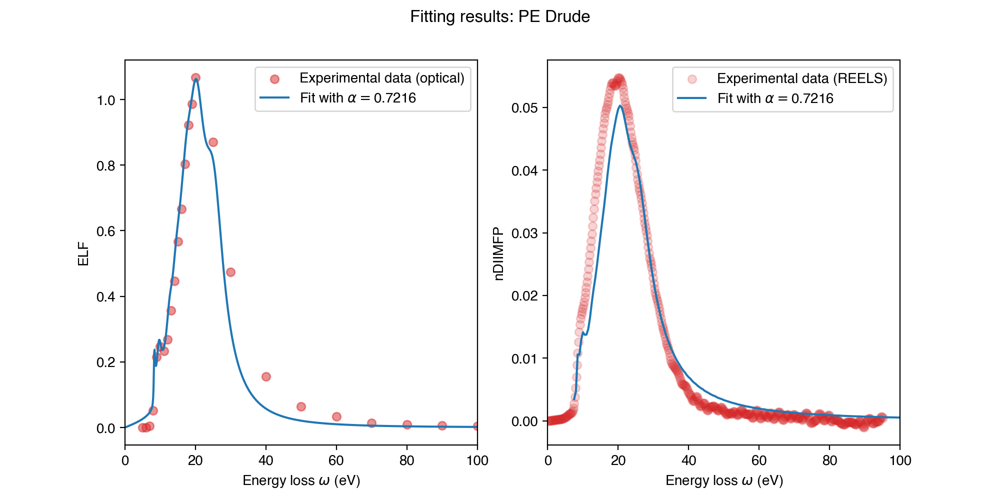

In [44]:
fd = np.loadtxt('/Users/olgaridzel/Research/PHYSDAT/opt/pal/polyethylene.diel')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,1]

fd = pd.read_csv('../diimfp/pe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(pe_drude, exp_data, 1600, n_q = 8)
result = opt_.runOptimisation(0.9,0.1, maxeval = 5000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = pe_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_fit.png', dpi=600)

In [ ]:
# A = [30.9649, 33.8626, 33.8368, 29.324 , 26.0666, 27.1075, 27.4519, 10.9467, 12.1362, 18.0936, 20.9278, 34.1272, 20.536,  8.4471]
# gamma = [0.6, 1.5, 2.6, 2.9, 3.6, 11.9, 4.4, 3.4, 3.9, 6.7, 12.1, 14.3, 16.8, 89.7]
# omega = [7.9, 8.4, 9.7, 10.9, 12.5, 14.8, 14.9, 17.3, 19.5, 22.2, 26.0, 26.1, 31.2, 72.0]

# A = [46.756, 32.41, 32.744, 30.936, 22.237, 26.408, 27.192, 10.514, 12.4, 18.2, 19.23, 34.227, 20.43]
# gamma = [0.543, 1.324, 2.303, 2.902, 3.413, 11.551, 4.273, 3.307, 3.801, 6.477, 11.59, 13.44, 15.978]
# omega = [7.8, 8.247, 9.754, 11.033, 12.617, 15.735, 14.889, 17.253, 19.519, 22.273, 26.339, 26.062, 31.873]

# with zeroing
A = [69.183, 32.895, 30.7, 20.147, 44.706, 24.669, 10.21, 11.984, 18.077, 18.354, 31.748, 21.02]
gamma = [1.187, 2.729, 2.843, 3.231, 12.622, 4.265, 3.425, 3.955, 6.929, 13.721, 15.093, 17.652]
omega = [7.939, 9.491, 10.779, 12.408, 14.365, 14.797, 17.22, 19.558, 22.501, 27.105, 26.519, 28.381]

M = (2 * 12.01 + 4 * 1.01) / (2 + 4) # Molar weight
Z_av = (2 * 6 + 4 * 1) / (2 + 4)
rho = 0.94 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = 1)
composition = opt.Composition(['c','h'], [2,4]) # well defined quantity
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pe_mll = opt.Material('PE', oscillators, composition, eloss, q, xraypath)
pe_drude.Eg = 7.5
pe_drude.width_of_the_valence_band = 15.5
pe_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
pe_drude.static_refractive_index = 1.519
pe_drude.electron_density = 0.242
pe_drude.Z = Z_av
pe_drude.use_henke_for_ne = False
pe_drude.use_KK_constraint = True
pe_drude.use_KK_relation = True

fsum = pe_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pe_drude.Z))

kksum = pe_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

<IPython.core.display.Javascript object>


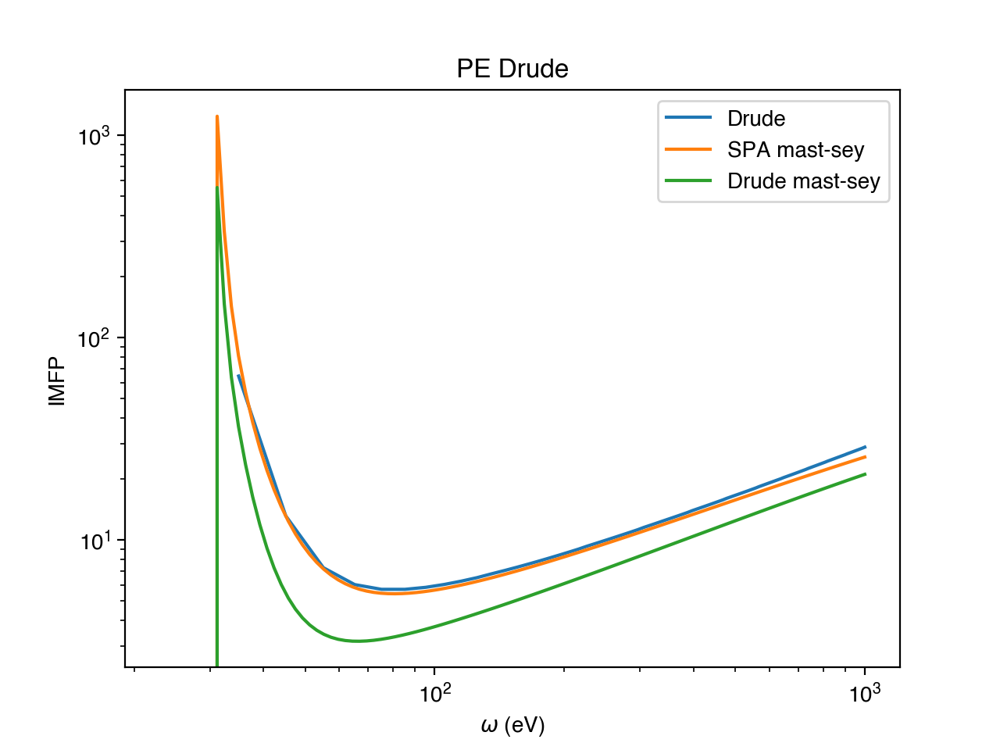

In [36]:
osc = pe_drude
energy = opt.linspace(35, 1000, 10)
osc.calculateIMFP(energy, False)

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.IMFP_E, osc.IMFP, label='Drude')

fd = np.loadtxt('/Users/olgaridzel/Research/MAST-SEY/examples/PE/PE_SPA/mfp.plot')
plt.plot(fd[:,0], fd[:,1],label='SPA mast-sey')

fd = np.loadtxt('/Users/olgaridzel/Research/MAST-SEY/examples/PE/PE_CUSTOM_Drude/mfp.plot')
plt.plot(fd[:,0], fd[:,1],label='Drude mast-sey')

plt.xscale('log')
plt.yscale('log')

plt.xlabel('$\omega$ (eV)')
plt.ylabel('IMFP')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


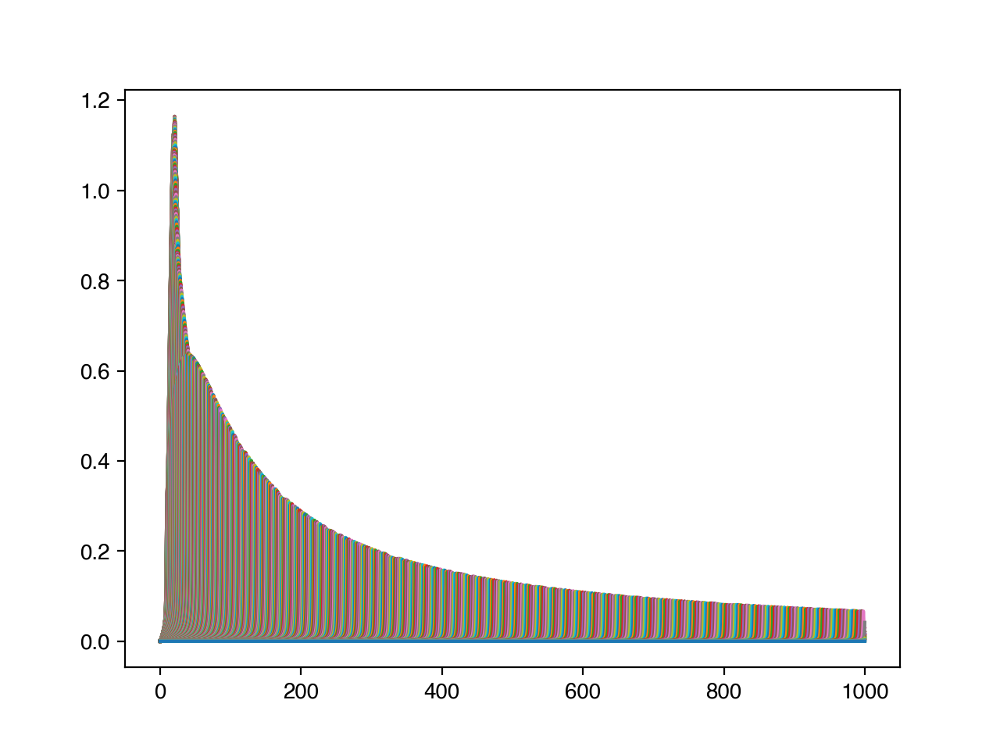

In [12]:
plt.figure()

pe_drude.eloss = np.linspace(0,1000,5000)
q_list = opt.linspace(0.0, 20, 0.02)

fd = open('/Users/olgaridzel/Research/MAST-SEY/materials/PE/PE_CUSTOM_Drude/elf.in', 'w')

for q in q_list:
    pe_drude.q = q
    pe_drude.calculateELF()
    for i in range(len(pe_drude.eloss)):
        fd.write(f'{pe_drude.eloss[i]:.8f} {pe_drude.ELF[i]:.8f}\n')
    fd.write(f'{q} {q}\n')
    fd.write('99999999 99999999\n')
    plt.plot(pe_drude.eloss, pe_drude.ELF)
    
plt.show()
fd.close()

<IPython.core.display.Javascript object>


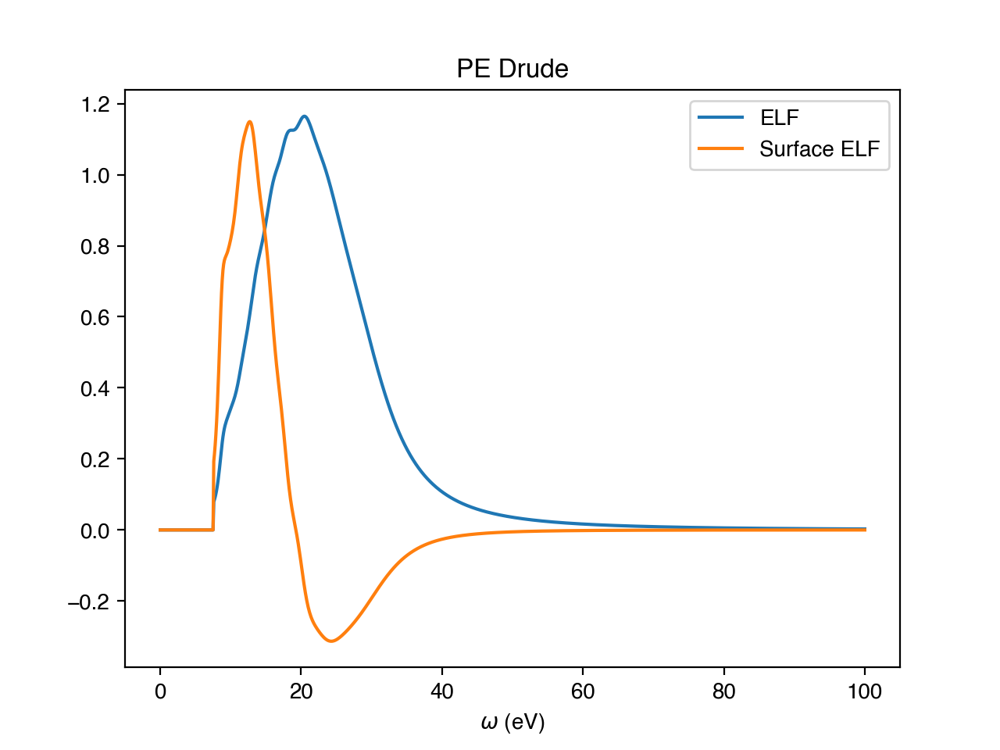

In [22]:
osc = pe_drude
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


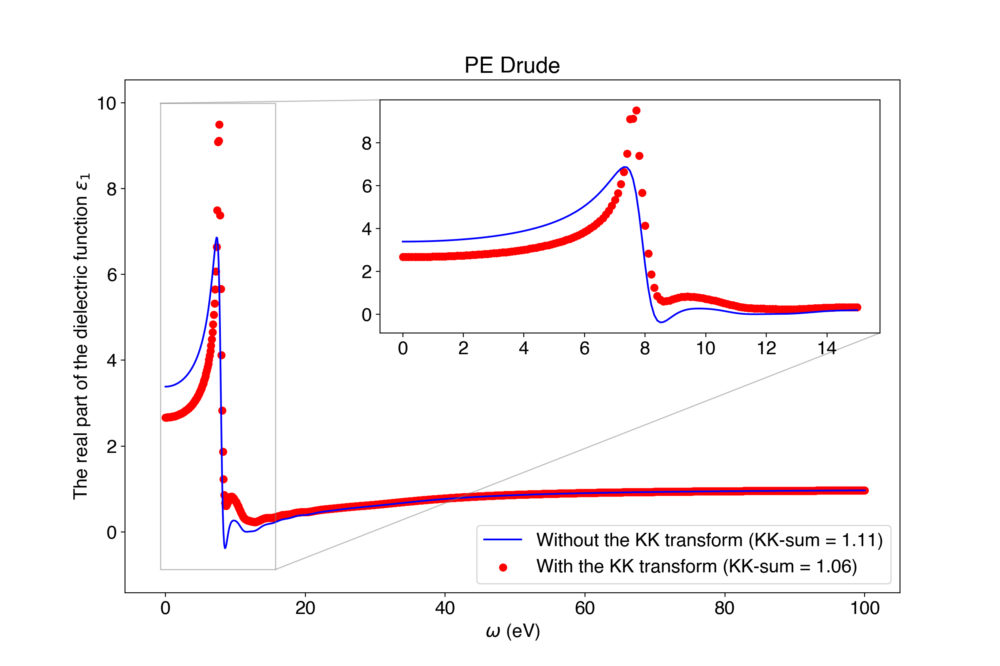

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.602264340738612
KKSum = 1.1099287650762355



The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.4612796236278935
KKSum = 1.0603565307131515


In [25]:
fig, ax = plt.subplots(figsize=[12,8])

osc = pe_drude
x_limit = 15

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
# plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 2.595758114288426
Z = 2.6666666666666665
Insulator Eg = 7.5
KKSum = 1.160041925589967
A = [85.561, 32.532, 29.718, 11.992, 49.143, 23.054, 10.246, 9.11, 22.094, 15.656, 27.845, 16.724]
gamma = [0.307, 2.23, 2.508, 2.532, 13.293, 4.019, 4.045, 4.197, 11.236, 25.643, 11.228, 35.388]
omega = [7.751, 9.26, 10.855, 12.496, 14.821, 14.876, 17.693, 19.787, 23.72, 24.762, 24.985, 27.643]
alpha = 0.004427580903802557

osc.A = [85.561 32.532 29.718 11.992 49.143 23.054 10.246 9.11 22.094 15.656 27.845 16.724];
osc.G = [0.307 2.23 2.508 2.532 13.293 4.019 4.045 4.197 11.236 25.643 11.228 35.388];
osc.Om = [7.751 9.26 10.855 12.496 14.821 14.876 17.693 19.787 23.72 24.762 24.985 27.643];


<IPython.core.display.Javascript object>


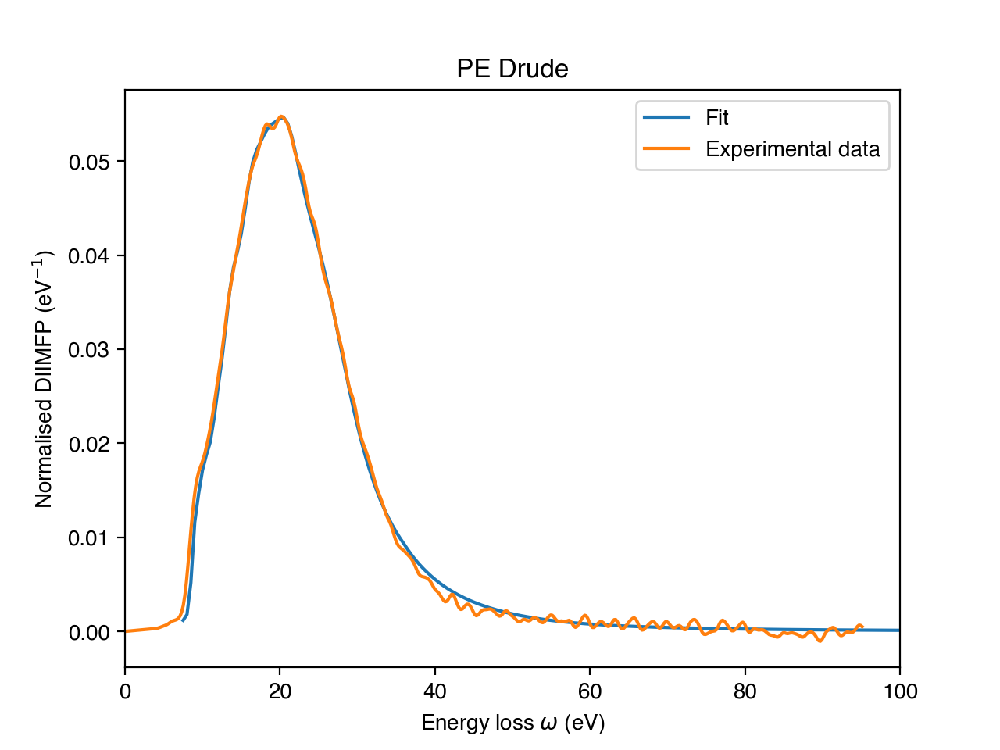

In [19]:
fd = pd.read_csv('../diimfp/pe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(pe_drude, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 500, xtol_rel = 1e-17)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
print()
print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

In [23]:
A =  [0.018, 0.099, 0.124, 0.092, 0.109, 0.097, 0.077, 0.114]
gamma =  [1.62, 4.4, 4.46, 3.89, 4.43, 5.46, 7.03, 12.42]
omega = [9.79, 13.07, 15.79, 18.09, 20.57, 23.22, 26.31, 29.92]

# A = [0.131, 0.052, 0.055, 0.044, 0.018, 0.045, 0.052, 0.051, 0.033, 0.021, 0.025, 0.014, 0.012, 0.005, 0.008]
# gamma = [6.517, 4.344, 9.531, 7.108, 5.985, 4.822, 6.883, 7.198, 6.46, 24.55, 27.206, 73.652, 50.617, 77.801, 83.321]
# omega = [14.824, 17.623, 20.685, 19.691, 31.184, 20.814, 27.169, 23.638, 23.833, 24.256, 20.466, 28.388, 27.72, 33.707, 41.732]

M = (2 * 12.01 + 4 * 1.01) / (2 + 4) # Molar weight
rho = 0.94 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
# oscillators = opt.Oscillators('DLL', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','h'], [2,4])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pe_dl = opt.Material('PE', oscillators, composition, eloss, q, xraypath)
pe_dl.Eg = 7.5
pe_dl.width_of_the_valence_band = 6
pe_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
pe_dl.static_refractive_index = 1.519
pe_dl.electron_density = 0.2421
pe_dl.Z = 2.667
pe_dl.use_henke_for_ne = False
pe_dl.use_KK_constraint = True
pe_dl.use_KK_relation = False

fsum = pe_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pe_dl.Z))

kksum = pe_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 2.5907826542381596
Z = 2.667
KKSum = 1.1041693130578645


<IPython.core.display.Javascript object>


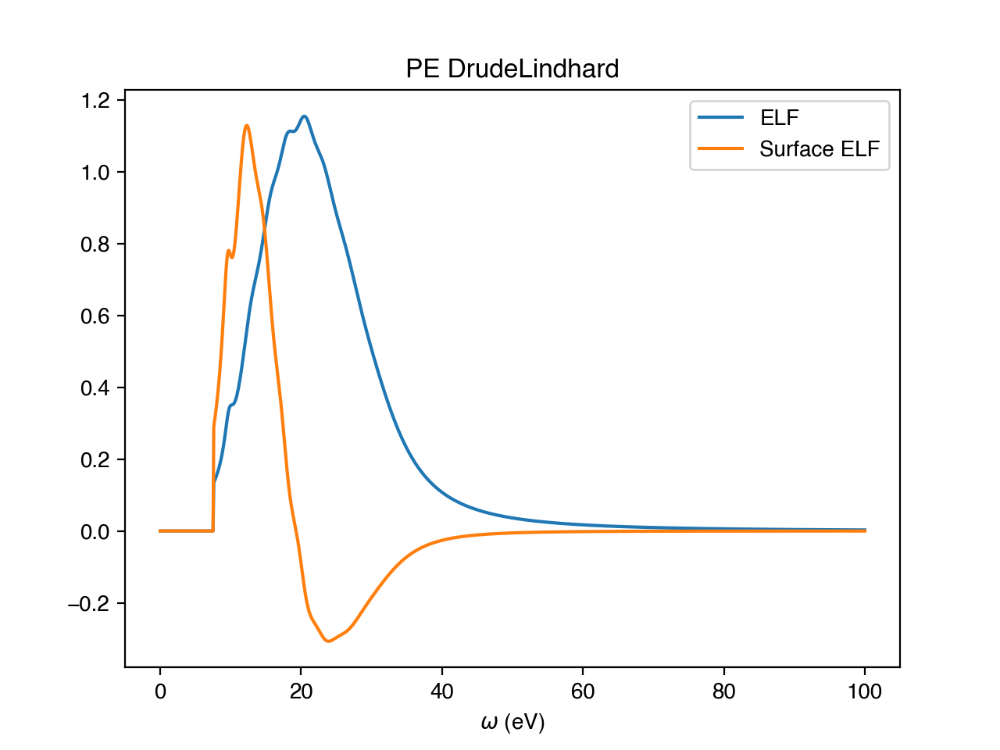

In [24]:
osc = pe_dl
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


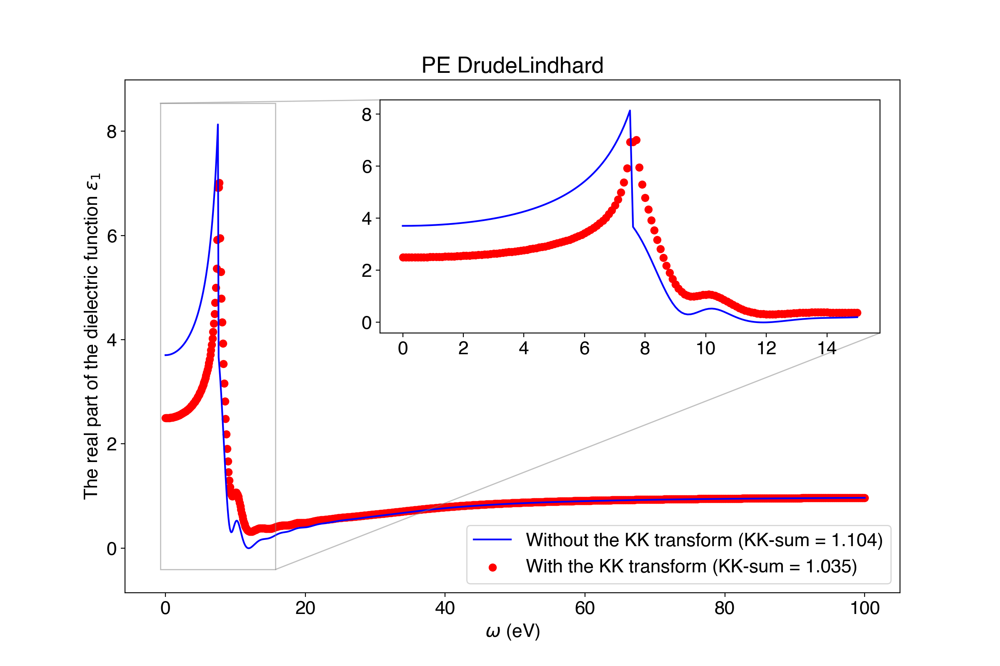

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.5907826542381596
KKSum = 1.1041693130578645



The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.405391345567997
KKSum = 1.034566676868523


In [29]:
fig, ax = plt.subplots(figsize=[12,8])

osc = pe_dl
x_limit = 15

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
# plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 2.5601130059279225
Z = 2.667
KKSum = 0.9634722055234481
A = [0.015, 0.086, 0.075, 0.081, 0.083, 0.089, 0.064, 0.074]
gamma = [1.572, 4.123, 4.326, 3.814, 4.124, 5.17, 7.018, 17.203]
omega = [10.049, 14.596, 16.808, 18.741, 21.327, 24.375, 28.199, 40.576]
osc.A = [0.015 0.086 0.075 0.081 0.083 0.089 0.064 0.074];
osc.G = [1.572 4.123 4.326 3.814 4.124 5.17 7.018 17.203];
osc.Om = [10.049 14.596 16.808 18.741 21.327 24.375 28.199 40.576];


<IPython.core.display.Javascript object>


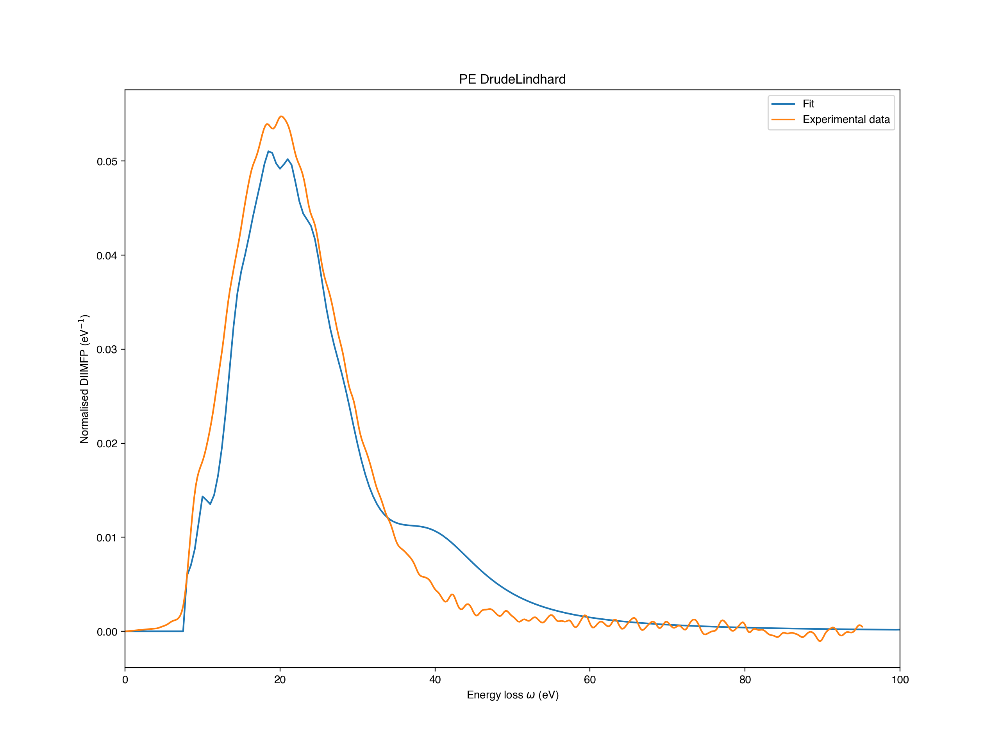

In [156]:
fd = pd.read_csv('../diimfp/pe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(pe_dl, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 500, xtol_rel = 1e-17)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


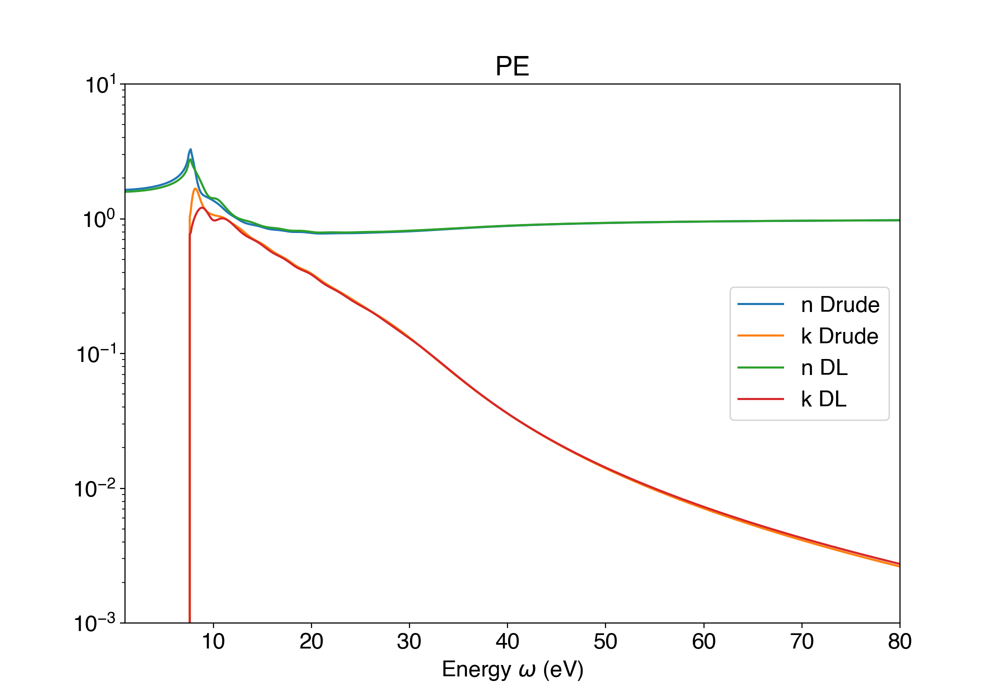

In [62]:
plt.figure(figsize=[10,7])

pe_drude.calculateOpticalConstants_()
plt.plot(pe_drude.eloss, pe_drude.refractive_index, label='n Drude')
plt.plot(pe_drude.eloss, pe_drude.extinction_coefficient, label='k Drude')

pe_dl.calculateOpticalConstants_()
plt.plot(pe_dl.eloss, pe_dl.refractive_index, label='n DL')
plt.plot(pe_dl.eloss, pe_dl.extinction_coefficient, label='k DL')

plt.yscale('log')
# plt.xscale('log')
plt.xlabel('Energy $\omega$ (eV)')
plt.xlim(1, 80)
plt.ylim(0.001, 10)
plt.title(f'{pe_dl.name}')
plt.legend()
plt.show()

plt.savefig("pe_optical_constants.png", dpi=600)
pe_drude.writeOpticalData()

**PMMA**

In [40]:
A = [11.9637, 25.1598, 22.138 , 26.6971, 27.7229, 29.5537, 27.6149, 23.4497, 39.2408, 28.3709, 28.4939, 22.4436, 16.7607, 19.9005, 41.9562]
gamma = [2.1, 2.2, 2.1, 2.6, 3.1, 4.0, 5.1, 6.1, 9.3, 11.6, 15.8, 16.6, 21.2, 22.3, 41.6]
omega = [9.3, 10.5, 11.9, 13.2, 14.6, 16.5, 18.7, 21.2, 24.2, 28.5, 32.0, 36.3, 44.6, 48.4 ,62.0]
alpha = 0

M = (5 * 12.01 + 2 * 15.999 + 8 * 1.01) / (5 + 2 + 8) # Molar weight
Z_av = (5 * 6 + 2 * 8 + 8 * 1) / (5 + 2 + 8)
rho = 1.18 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','o','h'], [5,2,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pmma_drude_0 = opt.Material('PMMA', oscillators, composition, eloss, q, xraypath)
pmma_drude_0.Eg = 6.7
pmma_drude_0.width_of_the_valence_band = 15.8
pmma_drude_0.atomic_density = rho * opt.N_Avogadro / M *1e-24
pmma_drude_0.static_refractive_index = 1.4813 # 1.49
pmma_drude_0.electron_density = 0.284
pmma_drude_0.Z = Z_av
pmma_drude_0.use_henke_for_ne = False
pmma_drude_0.use_KK_constraint = False
pmma_drude_0.use_KK_relation = False

fsum = pmma_drude_0.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pmma_drude_0.Z))

kksum = pmma_drude_0.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.513590442011066
Z = 3.6
Insulator Eg = 6.7
KKSum = 1.0063341110892563


In [7]:
# A = [18.889, 45.221, 20.989, 25.082, 44.506, 47.173, 18.557, 38.135, 18.244, 19.204, 9.122, 11.397, 35.474, 21.393, 18.217]
# gamma = [1.231, 2.838, 1.564, 3.727, 6.323, 8.394, 11.392, 11.104, 9.782, 65.557, 99.877, 98.611, 98.683, 96.972, 99.979]
# omega = [9.913, 12.733, 11.248, 14.59, 16.115, 19.178, 25.833, 23.468, 30.8, 30.067, 384.003, 168.075, 447.641, 44.876, 229.654]
# alpha = 0.7977242585652723

A = [16.338, 51.506, 27.767, 40.557, 49.495, 37.05, 18.917, 43.644]
gamma = [1.581, 4.358, 1.989, 2.815, 6.455, 9.828, 12.156, 8.31]
omega = [9.855, 15.392, 11.429, 13.193, 18.574, 28.301, 38.597, 22.834]
alpha = 0.8546324322397256

# A = [13.179, 17.574, 26.597, 29.29, 25.507, 27.866, 32.292, 20.396, 38.246, 31.6, 30.706, 23.602, 20.365, 21.381, 32.981]
# gamma = [2.604, 2.196, 2.193, 2.688, 4.159, 3.736, 5.493, 6.649, 10.664, 21.105, 13.351, 37.493, 38.036, 46.154, 72.2]
# omega = [9.878, 10.432, 11.939, 13.436, 15.923, 14.803, 17.977, 20.584, 23.294, 26.924, 27.801, 66.706, 36.081, 51.443, 85.185]
# alpha = 0.08575744583576088

M = (5 * 12.01 + 2 * 15.999 + 8 * 1.01) / (5 + 2 + 8) # Molar weight
Z_av = (5 * 6 + 2 * 8 + 8 * 1) / (5 + 2 + 8)
rho = 1.18 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','o','h'], [5,2,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pmma_drude = opt.Material('PMMA', oscillators, composition, eloss, q, xraypath)
pmma_drude.Eg = 6.7
pmma_drude.width_of_the_valence_band = 15.8
pmma_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
pmma_drude.static_refractive_index = 1.4813 # 1.49
pmma_drude.electron_density = 0.284
pmma_drude.Z = Z_av
pmma_drude.use_henke_for_ne = False
pmma_drude.use_KK_constraint = False
pmma_drude.use_KK_relation = False

fsum = pmma_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pmma_drude.Z))

kksum = pmma_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 2.9534429242000635
Z = 3.6
Insulator Eg = 6.7
KKSum = 0.9853310900365035


<IPython.core.display.Javascript object>


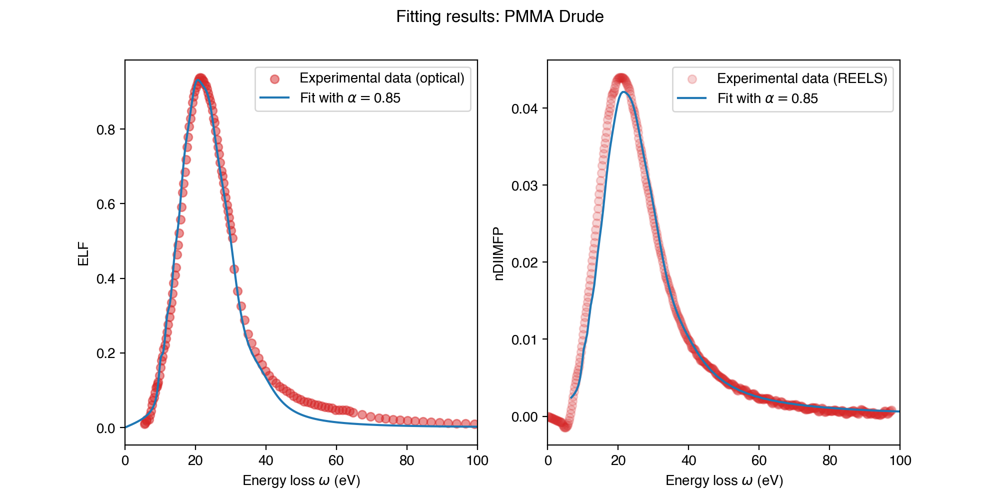

In [11]:
fd = np.loadtxt('/Users/olgaridzel/Research/PHYSDAT/opt/pal/polymethylmethacrylate.diel')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,1]

fd = pd.read_csv('../diimfp/pmma_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

# opt_ = opt.OptFit(pmma_drude, exp_data, 1600, n_q = 8)
# result = opt_.runOptimisation(0.95,0.05, maxeval = 50000, xtol_rel = 1e-6)
# oscOptimised = opt_.vec2Struct(result)

# fsum = oscOptimised.evaluateFsum()
# print('FSum = {}'.format(fsum))
# print('Z = {}'.format(oscOptimised.Z))

# kksum = oscOptimised.evaluateKKsum()
# print('KKSum = {}'.format(kksum))

# print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
# print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
# print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
# print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised = pmma_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 2)}')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 2)}')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_fit.png', dpi=600)

In [42]:
A =  [0.0499, 0.0249, 0.0333, 0.0705, 0.0798, 0.0789, 0.0761, 0.0583, 0.0163, 0.0556]
gamma =  [3.1866, 2.2187, 2.6918, 4.4238, 5.4260, 7.4259, 11.3708, 3.5890, 100, 25.1106]
omega = [16.0247, 12.1569, 14.1559, 20.4000, 23.1250, 26.5685, 31.2690, 18.1200, 58.5387, 40.5198]
alpha = 0

M = (5 * 12.01 + 2 * 15.999 + 8 * 1.01) / (5 + 2 + 8) # Molar weight
Z_av = (5 * 6 + 2 * 8 + 8 * 1) / (5 + 2 + 8)
rho = 1.18 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','o','h'], [5,2,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pmma_dl_0 = opt.Material('PMMA', oscillators, composition, eloss, q, xraypath)
pmma_dl_0.Eg = 6.7
pmma_dl_0.width_of_the_valence_band = 15.8
pmma_dl_0.atomic_density = rho * opt.N_Avogadro / M *1e-24
pmma_dl_0.static_refractive_index = 1.4813 # 1.49
pmma_dl_0.electron_density = 0.284
pmma_dl_0.Z = Z_av
pmma_dl_0.use_henke_for_ne = False
pmma_dl_0.use_KK_constraint = True
pmma_dl_0.use_KK_relation = False

fsum = pmma_dl_0.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pmma_dl_0.Z))

kksum = pmma_dl_0.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.345939541208395
Z = 3.6
Insulator Eg = 6.7
KKSum = 0.9687484110141673


In [43]:
# A =  [0.0499, 0.0249, 0.0333, 0.0705, 0.0798, 0.0789, 0.0761, 0.0583, 0.0163, 0.0556]
# gamma =  [3.1866, 2.2187, 2.6918, 4.4238, 5.4260, 7.4259, 11.3708, 3.5890, 100, 25.1106]
# omega = [16.0247, 12.1569, 14.1559, 20.4000, 23.1250, 26.5685, 31.2690, 18.1200, 58.5387, 40.5198]

A = [0.027, 0.04, 0.062, 0.077, 0.118, 0.117, 0.033, 0.028, 0.021, 0.021]
gamma = [5.866, 6.833, 5.771, 4.585, 5.834, 7.139, 6.599, 17.917, 28.739, 55.927]
omega = [12.716, 16.495, 17.357, 19.351, 22.325, 26.055, 29.939, 32.416, 44.941, 65.215]
alpha = 0.498932273690893

M = (5 * 12.01 + 2 * 15.999 + 8 * 1.01) / (5 + 2 + 8) # Molar weight
Z_av = (5 * 6 + 2 * 8 + 8 * 1) / (5 + 2 + 8)
rho = 1.18 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','o','h'], [5,2,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

pmma_dl = opt.Material('PMMA', oscillators, composition, eloss, q, xraypath)
pmma_dl.Eg = 6.7
pmma_dl.width_of_the_valence_band = 15.8
pmma_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
pmma_dl.static_refractive_index = 1.4813 # 1.49
pmma_dl.electron_density = 0.284
pmma_dl.Z = Z_av
pmma_dl.use_henke_for_ne = False
pmma_dl.use_KK_constraint = True
pmma_dl.use_KK_relation = False

fsum = pmma_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(pmma_dl.Z))

kksum = pmma_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.3462020452098677
Z = 3.6
Insulator Eg = 6.7
KKSum = 0.9623273761371964


In [ ]:
fd = np.loadtxt('/Users/olgaridzel/Research/PHYSDAT/opt/pal/polymethylmethacrylate.diel')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,1]

fd = pd.read_csv('../diimfp/pmma_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(pmma_dl, exp_data, 1600, n_q = 7)
result = opt_.runOptimisation(0.3,0.7, maxeval = 1000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = pmma_dl
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label='Fit')
axs[0].plot(exp_data.x_elf,exp_data.y_elf,label='Experimental data')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
axs[1].plot(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

Starting optimisation...


In [6]:
import copy

In [44]:
pmma_mll = copy.deepcopy(pmma_dl)
pmma_mll.convert_to_MLL()
pmma_mll.oscillators.model = 'MerminLL'

currentU 1.0 UstepSize 1.0
currentU 2.0 UstepSize 1.0
currentU 3.0 UstepSize 1.0
currentU 4.0 UstepSize 1.0
currentU 5.0 UstepSize 1.0
currentU 6.0 UstepSize 1.0
currentU 7.0 UstepSize 1.0
currentU 8.0 UstepSize 1.0
currentU 9.0 UstepSize 1.0
currentU 10.0 UstepSize 1.0
currentU 11.0 UstepSize 1.0
currentU 12.0 UstepSize 1.0
newsumA 0.8086434883863476
currentU 11.1 UstepSize 0.1
currentU 11.2 UstepSize 0.1
currentU 11.299999999999999 UstepSize 0.1
currentU 11.399999999999999 UstepSize 0.1
currentU 11.499999999999998 UstepSize 0.1
currentU 11.599999999999998 UstepSize 0.1
currentU 11.699999999999998 UstepSize 0.1
currentU 11.799999999999997 UstepSize 0.1
currentU 11.899999999999997 UstepSize 0.1
currentU 11.999999999999996 UstepSize 0.1
newsumA 0.9701149350663665
currentU 11.909999999999997 UstepSize 0.01
currentU 11.919999999999996 UstepSize 0.01
currentU 11.929999999999996 UstepSize 0.01
currentU 11.939999999999996 UstepSize 0.01
currentU 11.949999999999996 UstepSize 0.01
currentU 11.

In [45]:
pmma_mll_0 = copy.deepcopy(pmma_dl_0)
pmma_mll_0.convert_to_MLL()
pmma_mll_0.oscillators.model = 'MerminLL'

currentU 1.0 UstepSize 1.0
currentU 2.0 UstepSize 1.0
currentU 3.0 UstepSize 1.0
currentU 4.0 UstepSize 1.0
currentU 5.0 UstepSize 1.0
currentU 6.0 UstepSize 1.0
currentU 7.0 UstepSize 1.0
currentU 8.0 UstepSize 1.0
currentU 9.0 UstepSize 1.0
currentU 10.0 UstepSize 1.0
currentU 11.0 UstepSize 1.0
currentU 12.0 UstepSize 1.0
newsumA 0.8696329417099423
currentU 11.1 UstepSize 0.1
currentU 11.2 UstepSize 0.1
currentU 11.299999999999999 UstepSize 0.1
currentU 11.399999999999999 UstepSize 0.1
currentU 11.499999999999998 UstepSize 0.1
newsumA 0.9683854793707646
currentU 11.409999999999998 UstepSize 0.01
currentU 11.419999999999998 UstepSize 0.01
currentU 11.429999999999998 UstepSize 0.01
currentU 11.439999999999998 UstepSize 0.01
currentU 11.449999999999998 UstepSize 0.01
currentU 11.459999999999997 UstepSize 0.01
currentU 11.469999999999997 UstepSize 0.01
currentU 11.479999999999997 UstepSize 0.01
currentU 11.489999999999997 UstepSize 0.01
newsumA 0.9986223929456843


<IPython.core.display.Javascript object>


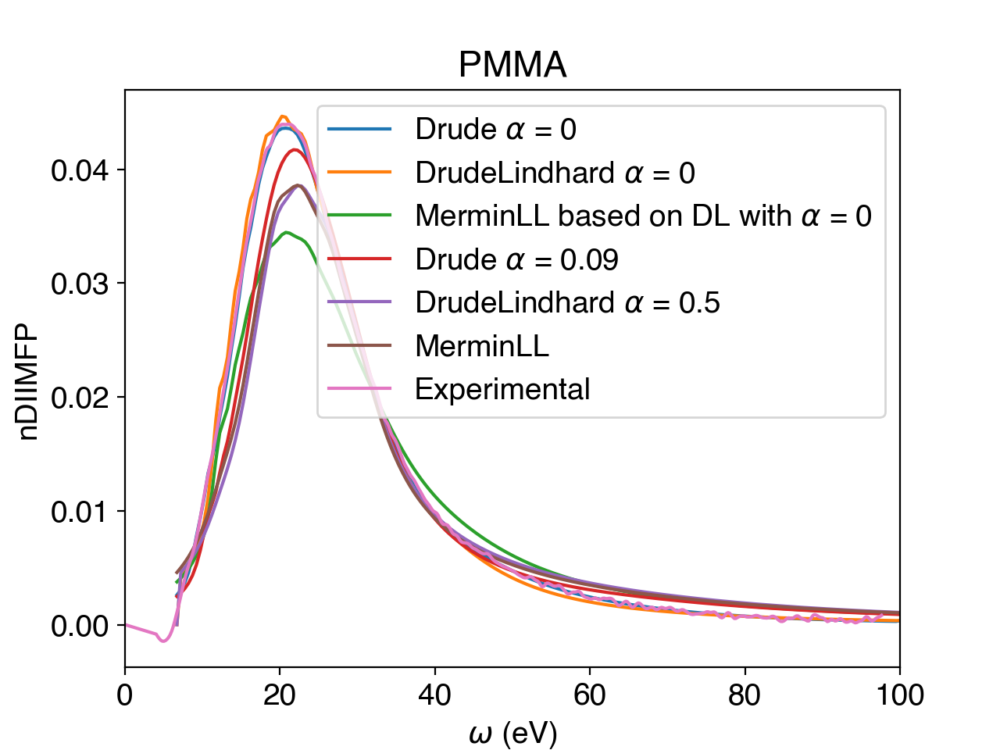

In [68]:
pmma_drude_0.calculateDIIMFP(1600)
pmma_drude.calculateDIIMFP(1600)
pmma_dl.calculateDIIMFP(1600)
pmma_dl_0.calculateDIIMFP(1600)
pmma_mll.calculateDIIMFP(1600)
pmma_mll_0.calculateDIIMFP(1600)

plt.figure()
plt.plot(pmma_drude_0.DIIMFP_E, pmma_drude_0.DIIMFP, label=pmma_drude_0.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_drude_0.oscillators.alpha,2)}')
plt.plot(pmma_dl_0.DIIMFP_E, pmma_dl_0.DIIMFP, label=pmma_dl.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_dl_0.oscillators.alpha,2)}')
plt.plot(pmma_mll_0.DIIMFP_E, pmma_mll_0.DIIMFP, label=pmma_mll.oscillators.model + r' based on DL with $\alpha$ = 0')

plt.plot(pmma_drude.DIIMFP_E, pmma_drude.DIIMFP, label=pmma_drude.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_drude.oscillators.alpha,2)}')
plt.plot(pmma_dl.DIIMFP_E, pmma_dl.DIIMFP, label=pmma_dl.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_dl.oscillators.alpha,2)}')
plt.plot(pmma_mll.DIIMFP_E, pmma_mll.DIIMFP, label=pmma_mll.oscillators.model)


fd = pd.read_csv('../diimfp/pmma_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]
plt.plot(x_exp_ndiimfp, y_exp_ndiimfp,label='Experimental')

plt.title('PMMA')
plt.xlabel('$\omega$ (eV)')
plt.ylabel('nDIIMFP')
plt.legend()
plt.xlim(0, 100)
plt.show()

plt.savefig('pmma_diimfps.png', dpi=600)

<IPython.core.display.Javascript object>


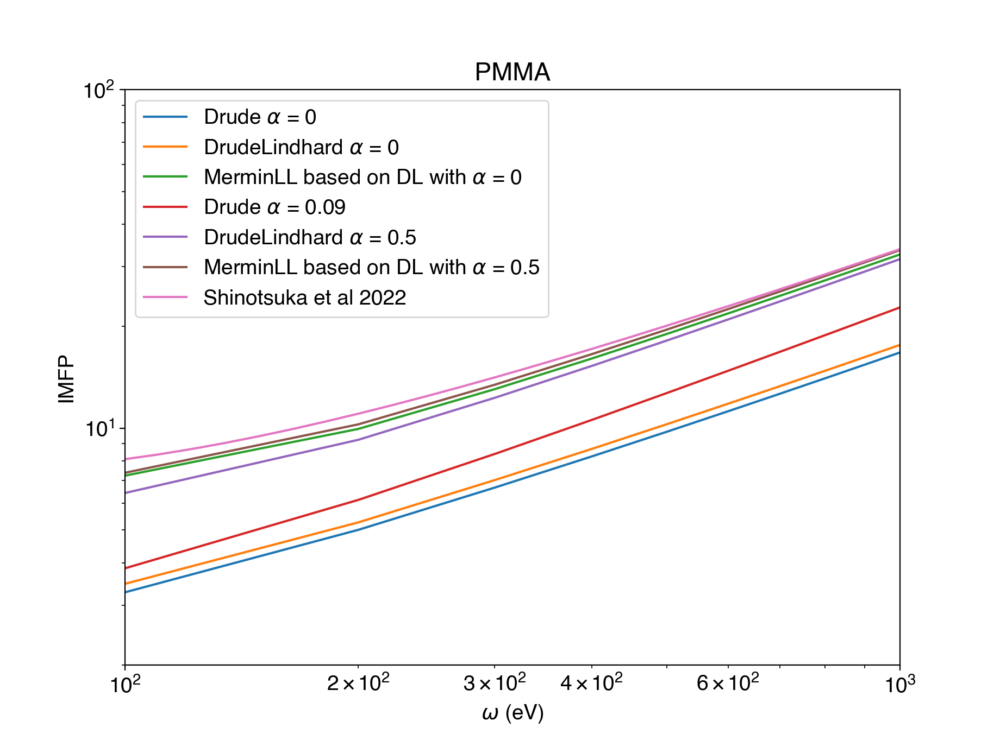

In [69]:
energy = opt.linspace(100, 1000, 100)

# pmma_drude_0.calculateIMFP(energy, False)
pmma_drude.calculateIMFP(energy, False)
# pmma_dl_0.calculateIMFP(energy, False)
# pmma_dl.calculateIMFP(energy, False)
# pmma_mll_0.calculateIMFP(energy, False)
# pmma_mll.calculateIMFP(energy, False)

plt.figure()
plt.plot(pmma_drude_0.IMFP_E, pmma_drude_0.IMFP, label=pmma_drude.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_drude_0.oscillators.alpha,2)}')
plt.plot(pmma_dl_0.IMFP_E, pmma_dl_0.IMFP, label=pmma_dl_0.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_dl_0.oscillators.alpha,2)}')
plt.plot(pmma_mll_0.IMFP_E, pmma_mll_0.IMFP, label=pmma_mll_0.oscillators.model + r' based on DL with $\alpha$ = 0')

plt.plot(pmma_drude.IMFP_E, pmma_drude.IMFP, label=pmma_drude.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_drude.oscillators.alpha,2)}')
plt.plot(pmma_dl.IMFP_E, pmma_dl.IMFP, label=pmma_dl.oscillators.model + r' $\alpha$ = ' + f'{round(pmma_dl.oscillators.alpha,2)}')
plt.plot(pmma_mll.IMFP_E, pmma_mll.IMFP, label=pmma_mll.oscillators.model + r' based on DL with $\alpha$ = ' + f'{round(pmma_dl.oscillators.alpha,2)}')

tpp = np.loadtxt('/Users/olgaridzel/Research/olga-optical-data/imfp/pmma/pmma_New_TPP-2M.imfp')
plt.plot(tpp[:,0], tpp[:,1],label='Shinotsuka et al 2022')

plt.title('PMMA')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\omega$ (eV)')
plt.ylabel('IMFP')
plt.legend()
plt.xlim(100, 1000)
plt.ylim(2,100)
plt.show()

plt.savefig('pmma_imfps.png', dpi=600)

In [56]:
plt.savefig('pmma_imfps.png', dpi=600)

In [5]:
# plt.figure()
pmma_mll.eloss = np.linspace(0,1000,5000)
q_list = opt.linspace(0.0, 20, 0.02)
pmma_mll.q = q_list
pmma_mll.size_q = q_list.size
pmma_mll.calculateELF()
print(pmma_mll.ELF.shape)

fd = open('/Users/olgaridzel/Research/MAST-SEY/materials/PMMA/PMMA_CUSTOM_MLL/elf.in', 'w')

j = 0
for q in q_list:
#     print(q)
    for i in range(len(pmma_mll.eloss)):
        fd.write(f'{pmma_mll.eloss[i]:.8f} {pmma_mll.ELF[i][j]:.8f}\n')
    fd.write(f'{q} {q}\n')
    fd.write('99999999 99999999\n')
#     plt.plot(pmma_mll.eloss, pmma_mll.ELF)
    j += 1
    
# plt.show()
fd.close()

(5000, 1001)
0.0
0.02
0.04
0.06
0.08
0.1
0.12
0.14
0.16
0.18
0.2
0.22
0.24
0.26
0.28
0.3
0.32
0.34
0.36
0.38
0.4
0.42
0.44
0.46
0.48
0.5
0.52
0.54
0.56
0.58
0.6
0.62
0.64
0.66
0.68
0.7000000000000001
0.72
0.74
0.76
0.78
0.8
0.8200000000000001
0.84
0.86
0.88
0.9
0.92
0.9400000000000001
0.96
0.98
1.0
1.02
1.04
1.06
1.08
1.1
1.12
1.1400000000000001
1.16
1.18
1.2
1.22
1.24
1.26
1.28
1.3
1.32
1.34
1.36
1.3800000000000001
1.4000000000000001
1.42
1.44
1.46
1.48
1.5
1.52
1.54
1.56
1.58
1.6
1.62
1.6400000000000001
1.6600000000000001
1.68
1.7
1.72
1.74
1.76
1.78
1.8
1.82
1.84
1.86
1.8800000000000001
1.9000000000000001
1.92
1.94
1.96
1.98
2.0
2.02
2.04
2.06
2.08
2.1
2.12
2.14
2.16
2.18
2.2
2.22
2.24
2.2600000000000002
2.2800000000000002
2.3000000000000003
2.32
2.34
2.36
2.38
2.4
2.42
2.44
2.46
2.48
2.5
2.52
2.54
2.56
2.58
2.6
2.62
2.64
2.66
2.68
2.7
2.72
2.74
2.7600000000000002
2.7800000000000002
2.8000000000000003
2.82
2.84
2.86
2.88
2.9
2.92
2.94
2.96
2.98
3.0
3.02
3.04
3.06
3.08
3.1
3.12
3.14


<IPython.core.display.Javascript object>


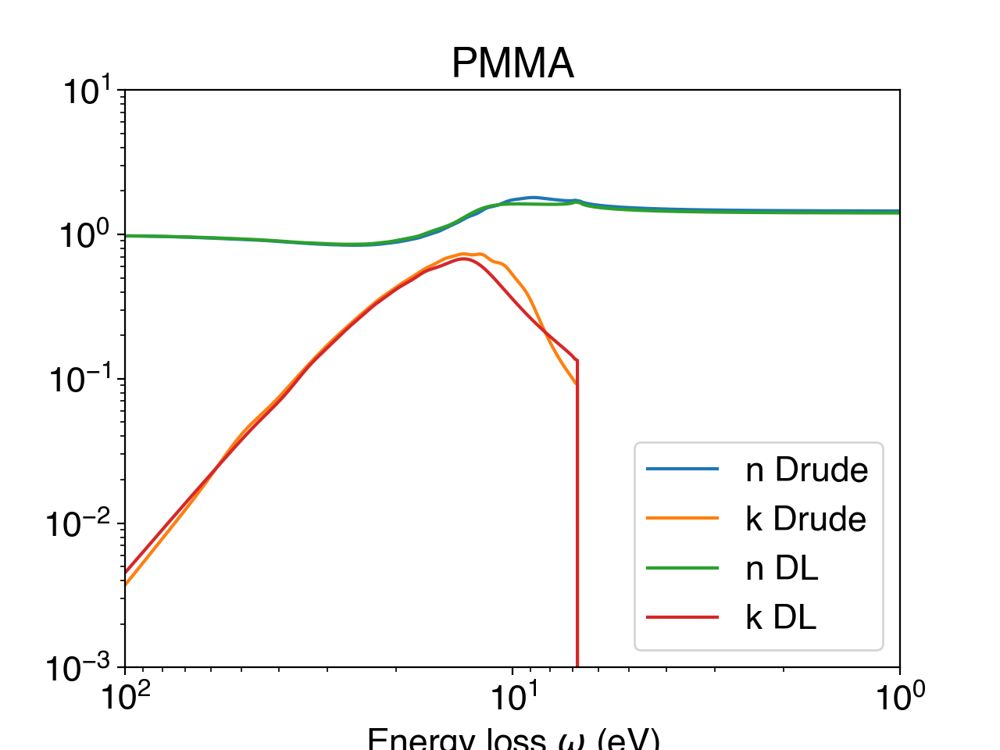

In [35]:
pmma_drude.calculateOpticalConstants()

plt.figure()
plt.plot(pmma_drude.eloss, pmma_drude.refractive_index, label='n Drude')
plt.plot(pmma_drude.eloss, pmma_drude.extinction_coefficient, label='k Drude')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(100,1)
plt.ylim(0.001,10)
plt.title(f'{pmma_drude.name}')

pmma_dl.calculateOpticalConstants_()
plt.plot(pmma_dl.eloss, pmma_dl.refractive_index, label='n DL')
plt.plot(pmma_dl.eloss, pmma_dl.extinction_coefficient, label='k DL')

plt.legend()
plt.show()

pmma_drude.writeOpticalData()

**PS**

In [27]:
# A = [61.94, 6.89,32.36,34.78,31.78,40.3,36.12,27.7,22.66,18.23,12.48,9.55]
# gamma = [0.5,0.5,5.2,2.7,3,3.8,4.5,5.2,5.4,5.3,4.8,4.7]
# omega = [5.7,8.9,9.6,9.8,11.8,14.2,17.1,20.3,23.6,27.1,30.6,34.4]

# with zeroing no kk
# A = [47.417, 5.353, 13.258, 25.616, 34.017, 31.045, 45.014, 36.093, 31.099, 25.239, 17.96, 13.877, 7.705]
# gamma = [0.452, 1.974, 1.411, 4.621, 2.929, 3.203, 4.24, 4.83, 5.895, 6.141, 5.574, 5.383, 4.852]
# omega = [5.7, 9.901, 9.071, 10.443, 9.91, 11.86, 14.219, 17.055, 20.356, 23.882, 27.544, 31.432, 35.45]

# with zeroing with kk
A =     [15.378, 10.077, 8.649, 22.288, 32.817, 18.036, 54.667, 31.116, 35.866, 26.84, 15.412, 13.615, 26.346]
gamma = [0.344, 1.84, 1.44, 4.791, 2.964, 3.099, 4.243, 4.684, 6.357, 8.154, 20.006, 7.589, 14.333]
omega = [6.44, 10.694, 9.43, 12.405, 12.003, 13.663, 15.399, 18.223, 21.226, 25.88, 28.768, 32.311, 42.324]
alpha = 0.0036834488393378394

M = (8 * 12.01 + 8 * 1.01) / (8 + 8) # Molar weight
Z_av = (8 * 6 + 8 * 1) / (8 + 8)
rho = 1.06 # g/cm3

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','h'], [8,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

ps_drude = opt.Material('PS', oscillators, composition, eloss, q, xraypath)
ps_drude.Eg = 5.7
ps_drude.width_of_the_valence_band = 17
ps_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
ps_drude.static_refractive_index = 1.5892 # 1.5537 # 1.5717
ps_drude.electron_density = 0.242
ps_drude.Z = Z_av
ps_drude.use_henke_for_ne = False
ps_drude.use_KK_constraint = False
ps_drude.use_KK_relation = False

fsum = ps_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(ps_drude.Z))

kksum = ps_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 3.248870941548933
Z = 3.5
Insulator Eg = 5.7
KKSum = 0.9996191577381902


Starting optimisation...
found minimum after 5000 evaluations
minimum value =  0.005195232732457741
result code =  5
FSum = 3.2658735640118164
Z = 3.5
Insulator Eg = 5.7
KKSum = 1.0005296007617437
A = [15.702, 10.126, 8.738, 21.861, 33.192, 18.368, 55.982, 31.113, 35.807, 26.602, 16.458, 13.275, 26.879]
gamma = [0.345, 1.681, 1.427, 4.336, 2.945, 2.747, 4.338, 4.779, 6.651, 8.613, 20.241, 8.294, 15.84]
omega = [6.436, 10.651, 9.373, 12.892, 11.807, 13.659, 15.556, 18.423, 21.471, 26.108, 29.444, 32.702, 42.773]
alpha = 0.0021655982117679594


<IPython.core.display.Javascript object>


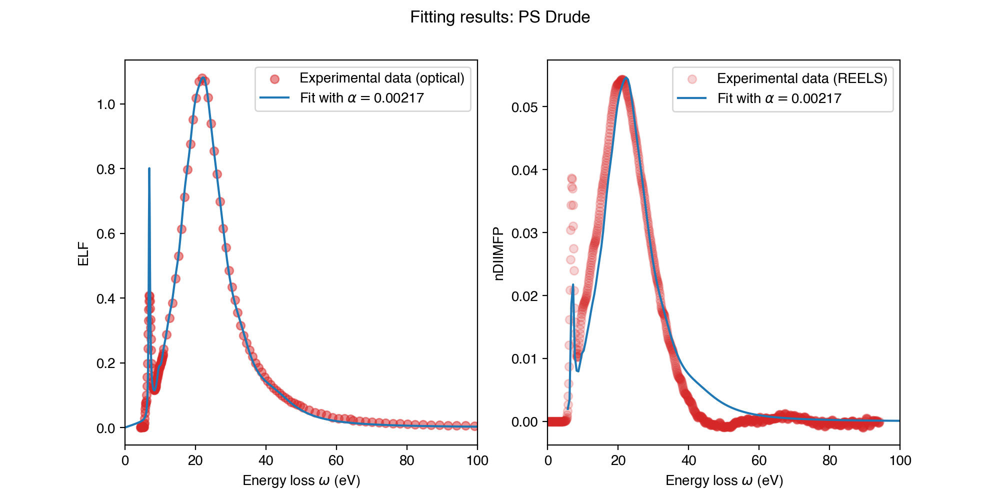

In [28]:
fd = np.loadtxt('/Users/olgaridzel/Research/PHYSDAT/opt/pal/polystyrene.diel')
x_exp_elf = fd[:,0]
y_exp_elf = fd[:,1]

fd = pd.read_csv('../diimfp/ps_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp_ndiimfp = exp_diimfp[:,0]
y_exp_ndiimfp = exp_diimfp[:,1]

exp_data = opt.exp_data()
exp_data.x_elf = x_exp_elf
exp_data.y_elf = y_exp_elf
exp_data.x_ndiimfp = x_exp_ndiimfp
exp_data.y_ndiimfp = y_exp_ndiimfp

opt_ = opt.OptFit(ps_drude, exp_data, 1600, n_q = 8)
result = opt_.runOptimisation(0.7,0.3, maxeval = 5000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

# oscOptimised = ps_drude
oscOptimised.calculateELF()

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 5)}')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_fit.png', dpi=600)

In [6]:
ps_drude.atomic_density

0.09805683870967742

<IPython.core.display.Javascript object>


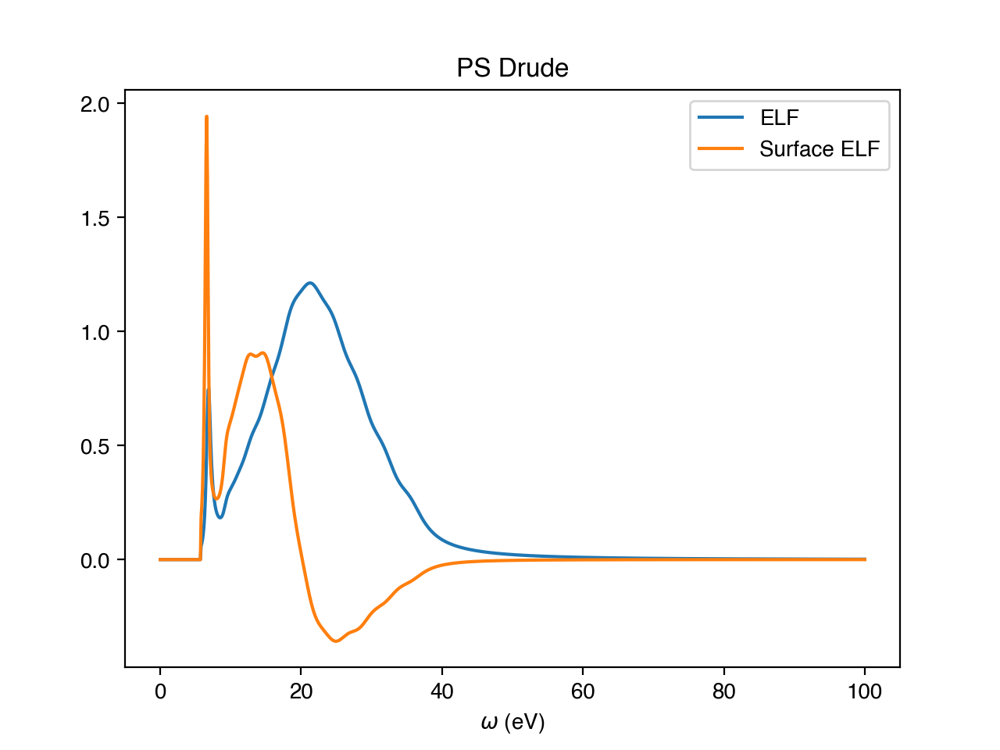

In [30]:
osc = ps_drude
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


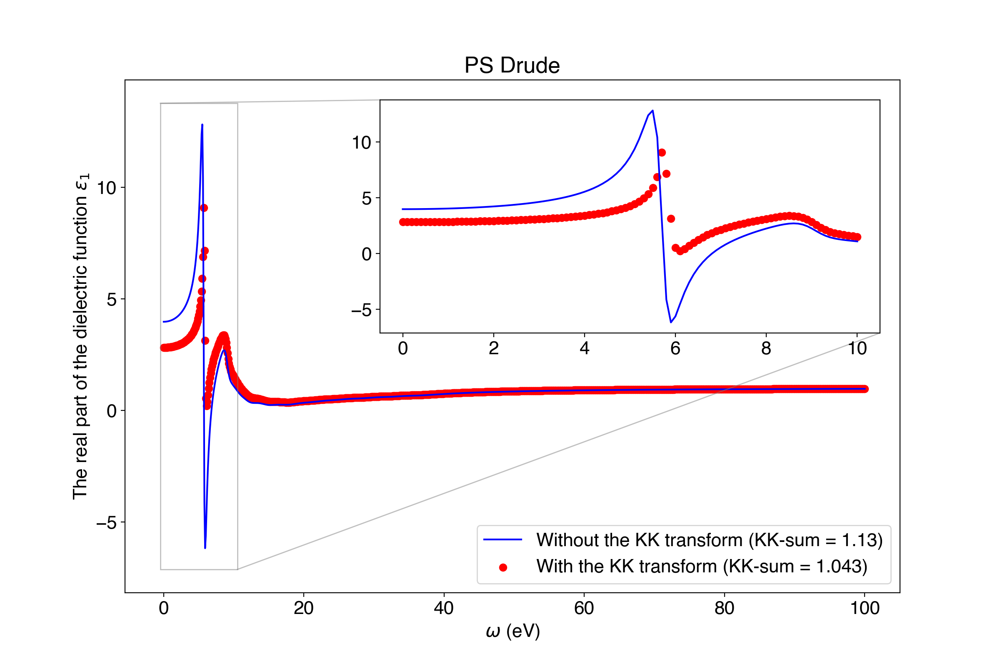

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 3.4453365936706275
KKSum = 1.1301397002516214



The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 3.227772553813103
KKSum = 1.042635129022213


In [80]:
fig, ax = plt.subplots(figsize=[12,8])

osc = ps_drude
x_limit = 10

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
# plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
Electron density = 0.2407679982890935
FSum = 3.420206868009149
Z = 3.5
Insulator Eg = 5.7
KKSum = 1.13222342583859
A = [41.849, 1.931, 14.32, 26.21, 32.152, 30.046, 49.932, 37.082, 30.524, 30.38, 20.678, 11.153, 5.745]
gamma = [0.308, 2.298, 0.942, 5.469, 3.331, 3.397, 5.311, 5.083, 6.351, 9.409, 5.704, 8.586, 8.56]
omega = [5.7, 11.268, 8.81, 11.039, 10.031, 11.48, 14.15, 16.981, 21.36, 24.678, 29.727, 56.167, 55.956]
alpha = 0.0009494646961438625

osc.A = [41.849 1.931 14.32 26.21 32.152 30.046 49.932 37.082 30.524 30.38 20.678 11.153 5.745];
osc.G = [0.308 2.298 0.942 5.469 3.331 3.397 5.311 5.083 6.351 9.409 5.704 8.586 8.56];
osc.Om = [5.7 11.268 8.81 11.039 10.031 11.48 14.15 16.981 21.36 24.678 29.727 56.167 55.956];


<IPython.core.display.Javascript object>


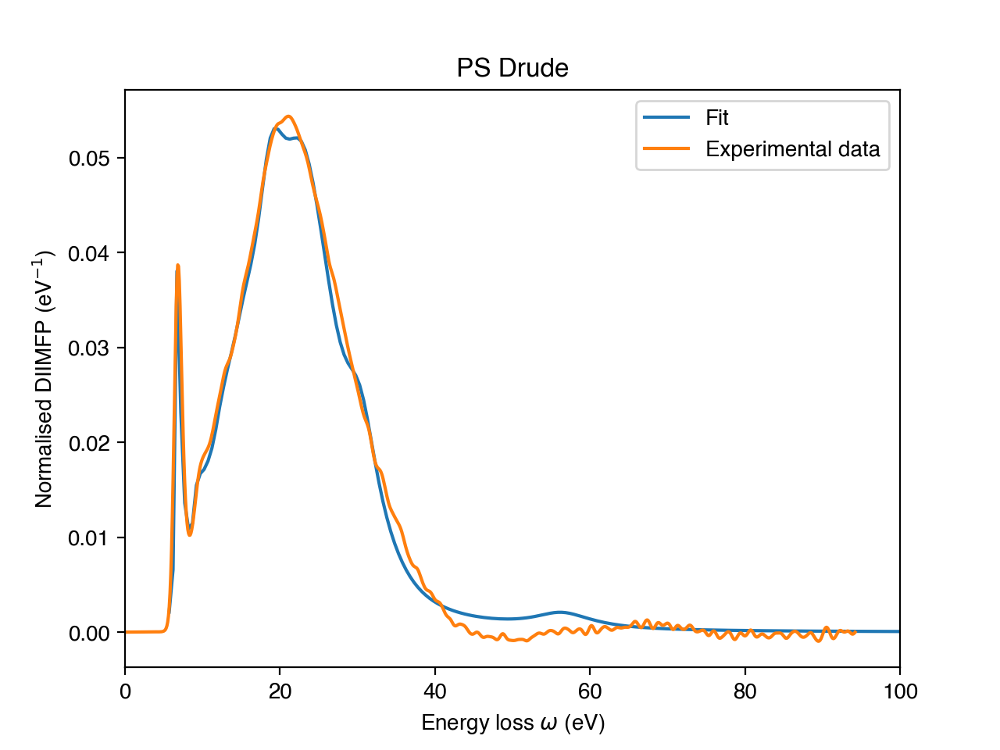

In [30]:
fd = pd.read_csv('../diimfp/ps_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(ps_drude, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 500, xtol_rel = 1e-20)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
print()
print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

In [31]:
A =  [0.0595, 0.0109, 0.0118, 0.0439, 0.1157, 0.0859, 0.0760, 0.0191, 0.0904, 0.0500, 0.0285, 0.005]
gamma =  [0.8766, 1.3500, 2.1377, 3.5174, 4.8311, 4.8859, 4.7143, 4.5001, 4.6727, 4.5861, 4.4314, 4.0]
omega = [6.9127, 9.7587, 10.8557, 12.7739, 18.9939, 15.7646, 24.1189, 33.3917, 21.5138, 27.1145, 29.9836, 37.0]

# A = [0.068, 0.011, 0.012, 0.04, 0.118, 0.09, 0.074, 0.017, 0.085, 0.048, 0.027]
# gamma = [0.844, 1.281, 2.305, 3.088, 4.932, 5.407, 4.33, 4.241, 4.442, 4.159, 4.194]
# omega = [6.869, 9.772, 10.865, 12.859, 18.906, 15.984, 24.107, 33.035, 21.516, 27.042, 29.909]

M = (8 * 12.01 + 8 * 1.01) / (8 + 8) # Molar weight
rho = 1.06 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','h'], [8,8])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

ps_dl = opt.Material('PS', oscillators, composition, eloss, q, xraypath)
ps_dl.Eg = 5.7
ps_dl.width_of_the_valence_band = 10
ps_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
ps_dl.static_refractive_index = 1.5717
ps_dl.electron_density = 0.242
ps_dl.Z = 3.5
ps_dl.use_henke_for_ne = False
ps_dl.use_KK_constraint = False
ps_dl.use_KK_relation = False

fsum = ps_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(ps_dl.Z))

kksum = ps_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 2.8493186650014297
Z = 3.5
KKSum = 0.9674062645567276


<IPython.core.display.Javascript object>


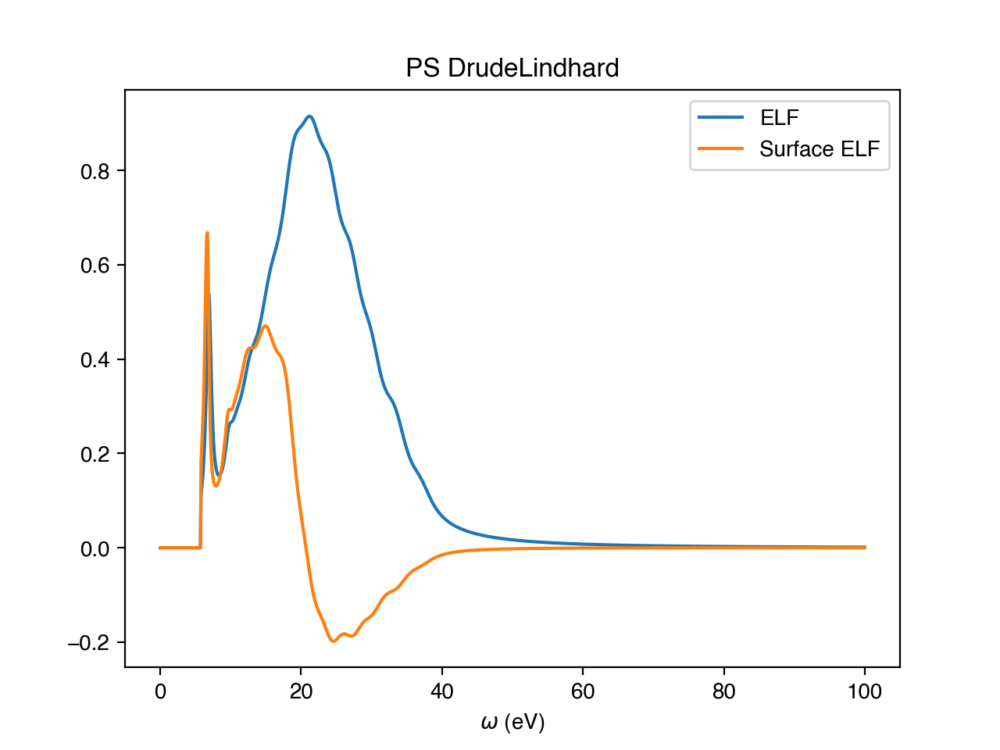

In [32]:
osc = ps_dl
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


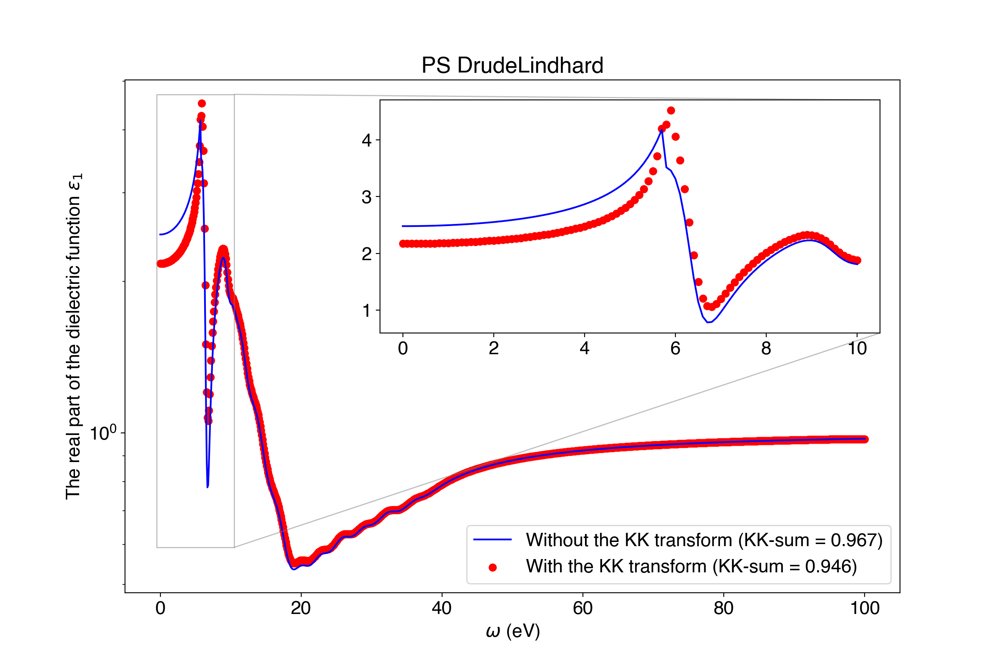

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.866445705546018
KKSum = 0.9673905227409831

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 2.831974205428928
KKSum = 0.9461710736657263


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [41]:
fig, ax = plt.subplots(figsize=[12,8])

osc = ps_dl
x_limit = 10

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 2.8092611340719644
Z = 3.5
KKSum = 0.9656420159917066
A = [0.068, 0.011, 0.012, 0.04, 0.119, 0.091, 0.076, 0.017, 0.086, 0.048, 0.027]
gamma = [0.824, 1.211, 2.219, 3.144, 4.924, 5.243, 4.409, 4.223, 4.366, 4.194, 4.157]
omega = [6.864, 9.777, 10.958, 12.883, 18.968, 15.986, 24.283, 33.882, 21.6, 27.284, 30.362]
osc.A = [0.068 0.011 0.012 0.04 0.119 0.091 0.076 0.017 0.086 0.048 0.027];
osc.G = [0.824 1.211 2.219 3.144 4.924 5.243 4.409 4.223 4.366 4.194 4.157];
osc.Om = [6.864 9.777 10.958 12.883 18.968 15.986 24.283 33.882 21.6 27.284 30.362];


<IPython.core.display.Javascript object>


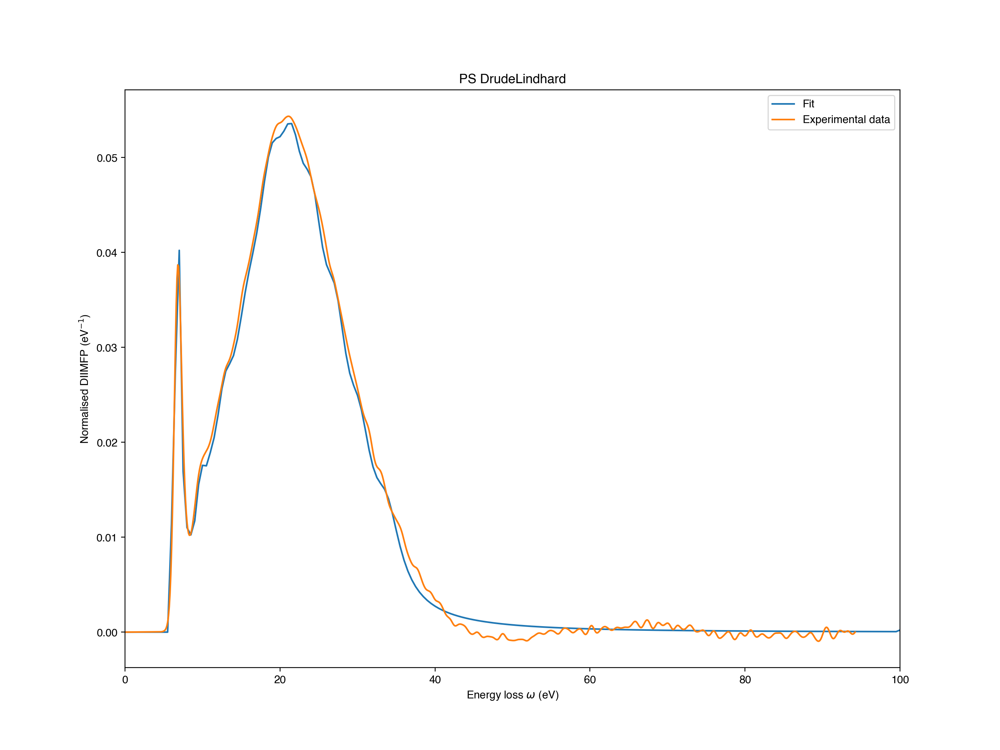

In [128]:
fd = pd.read_csv('../diimfp/ps_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(ps_dl, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 1000, xtol_rel = 1e-12)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


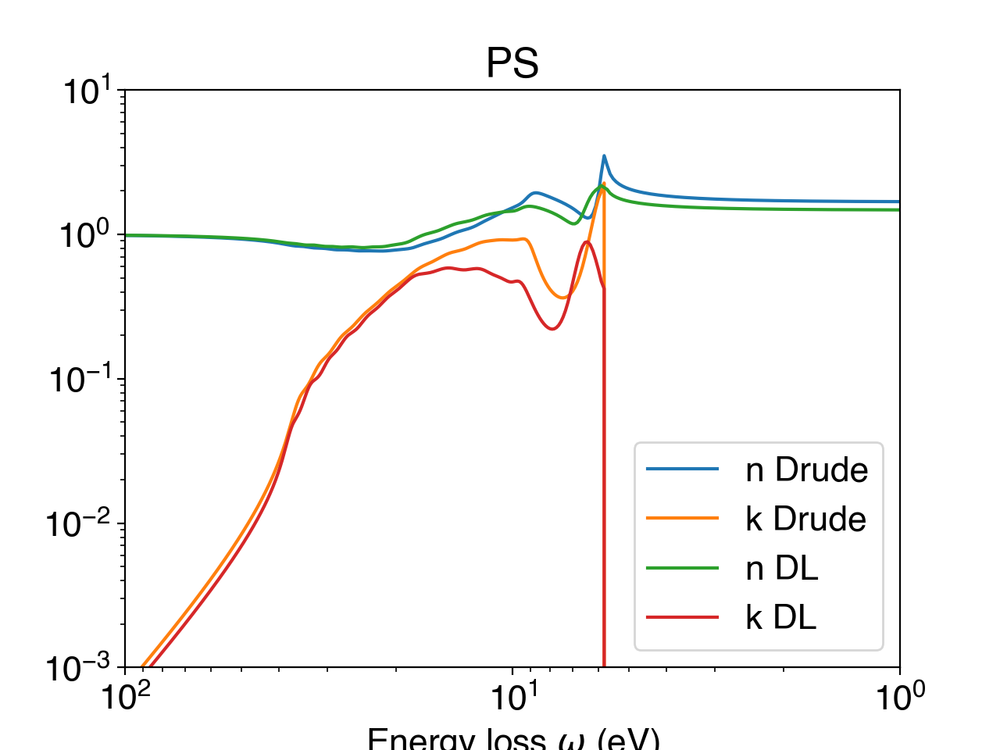

In [42]:
ps_drude.calculateOpticalConstants()

plt.figure()
plt.plot(ps_drude.eloss, ps_drude.refractive_index, label='n Drude')
plt.plot(ps_drude.eloss, ps_drude.extinction_coefficient, label='k Drude')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(100,1)
plt.ylim(0.001,10)
plt.title(f'{ps_drude.name}')

ps_dl.calculateOpticalConstants_()
plt.plot(ps_dl.eloss, ps_dl.refractive_index, label='n DL')
plt.plot(ps_dl.eloss, ps_dl.extinction_coefficient, label='k DL')

plt.legend()
plt.show()

ps_drude.writeOpticalData()

**PTFE**

In [12]:
# A = [0.93,3.87,39.19,15.06,38.65,92.64,105,185]
# gamma = [0.4,1.04,3.27,4.6,5.28,11.81,21.96,41.3]
# omega = [7.94,12.38,15.57,19.54,20.42,26.11,36.96,52.95]

A = [2.279, 11.677, 80.177, 16.704, 33.335, 90.827, 137.575, 162.022]
gamma = [0.252, 1.086, 3.825, 2.997, 4.916, 10.738, 23.595, 38.963]
omega = [7.808, 12.072, 15.075, 19.558, 20.146, 25.665, 37.061, 52.489]
alpha = 0.8

M = (2 * 12.01 + 4 * 18.998) / (2 + 4) # Molar weight
Z_av = (2 * 6 + 4 * 9) / (2 + 4)
rho = 2.2 # g/cm3 pstar

oscillators = opt.Oscillators('Drude', A, gamma, omega, alpha = alpha)
composition = opt.Composition(['c','f'], [2,4])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

ptfe_drude = opt.Material('PTFE', oscillators, composition, eloss, q, xraypath)
ptfe_drude.Eg = 7.2
ptfe_drude.width_of_the_valence_band = 5.5
ptfe_drude.atomic_density = rho * opt.N_Avogadro / M *1e-24
ptfe_drude.static_refractive_index = 1.4
ptfe_drude.electron_density = 0.47
ptfe_drude.Z = Z_av
ptfe_drude.use_henke_for_ne = True
ptfe_drude.use_KK_constraint = True
ptfe_drude.use_KK_relation = False

fsum = ptfe_drude.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(ptfe_drude.Z))

kksum = ptfe_drude.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 7.25425825805232
Z = 8.0
Insulator Eg = 7.2
KKSum = 0.9860442197762902


Start optimisation
Electron density = 0.38768515366394024
FSum = 7.261633478394448
Z = 8.0
Insulator Eg = 7.2
KKSum = 0.9840666830255567
A = [2.281, 11.666, 76.813, 18.137, 33.168, 92.229, 139.187, 161.152]
gamma = [0.248, 1.107, 3.545, 2.871, 4.695, 10.535, 22.633, 38.959]
omega = [7.826, 12.087, 15.026, 19.393, 20.18, 25.553, 37.057, 53.515]
alpha = 0.013669806219412217

osc.A = [2.281 11.666 76.813 18.137 33.168 92.229 139.187 161.152];
osc.G = [0.248 1.107 3.545 2.871 4.695 10.535 22.633 38.959];
osc.Om = [7.826 12.087 15.026 19.393 20.18 25.553 37.057 53.515];


<IPython.core.display.Javascript object>


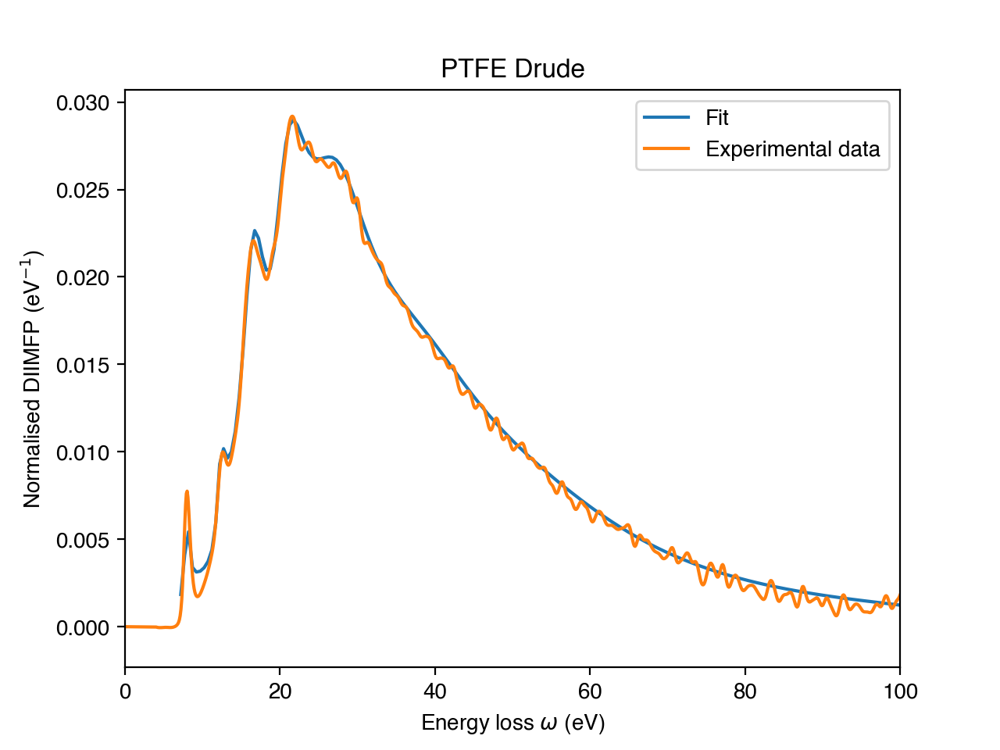

In [37]:
fd = pd.read_csv('../diimfp/ptfe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(ptfe_drude, x_exp, y_exp, 1600)
result = opt_.runOptimisation(1,0, maxeval = 1000, xtol_rel = 1e-4)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')
print(f'alpha = {oscOptimised.oscillators.alpha}')
# print()
# print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
# print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
# print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

axs[0].scatter(exp_data.x_elf,exp_data.y_elf,label='Experimental data (optical)', c='tab:red', alpha=0.5)
axs[0].plot(oscOptimised.eloss,oscOptimised.ELF,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 2)}')
axs[0].set_xlabel('Energy loss $\omega$ (eV)')
axs[0].set_ylabel('ELF')
axs[0].legend()
axs[0].set_xlim(0,100)

oscOptimised.calculateDIIMFP(1600)
axs[1].scatter(exp_data.x_ndiimfp,exp_data.y_ndiimfp,label='Experimental data (REELS)', c='tab:red', alpha=0.2)
axs[1].plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label=r'Fit with $\alpha = $' + f'{round(oscOptimised.oscillators.alpha, 2)}')
axs[1].set_xlabel('Energy loss $\omega$ (eV)')
axs[1].set_ylabel('nDIIMFP')
axs[1].legend()
axs[1].set_xlim(0,100)

fig.suptitle(f'Fitting results: {oscOptimised.name} {oscOptimised.oscillators.model}')
plt.show()

plt.savefig(f'{oscOptimised.name}_{oscOptimised.oscillators.model}_fit.png', dpi=600)

<IPython.core.display.Javascript object>


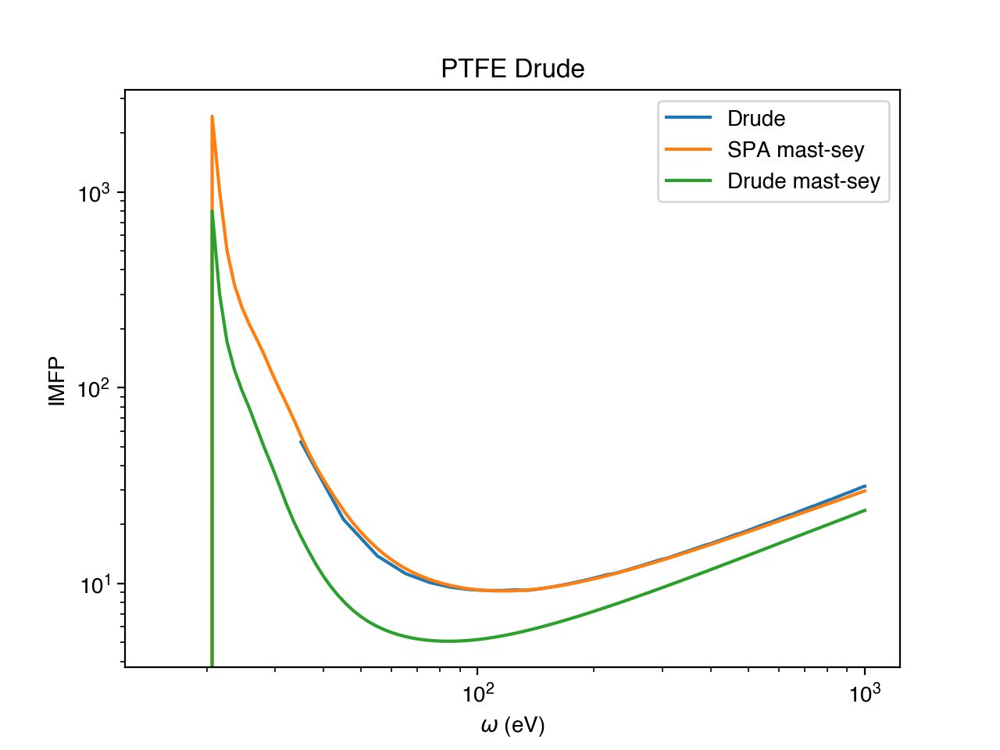

In [38]:
osc = ptfe_drude
energy = opt.linspace(35, 1000, 10)
osc.calculateIMFP(energy, False)

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.IMFP_E, osc.IMFP, label='Drude')

fd = np.loadtxt('/Users/olgaridzel/Research/MAST-SEY/examples/PTFE/PTFE_FPA/mfp.plot')
plt.plot(fd[:,0], fd[:,1],label='SPA mast-sey')

fd = np.loadtxt('/Users/olgaridzel/Research/MAST-SEY/examples/PTFE/PTFE_CUSTOM_Drude/mfp.plot')
plt.plot(fd[:,0], fd[:,1],label='Drude mast-sey')

plt.xscale('log')
plt.yscale('log')

plt.xlabel('$\omega$ (eV)')
plt.ylabel('IMFP')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


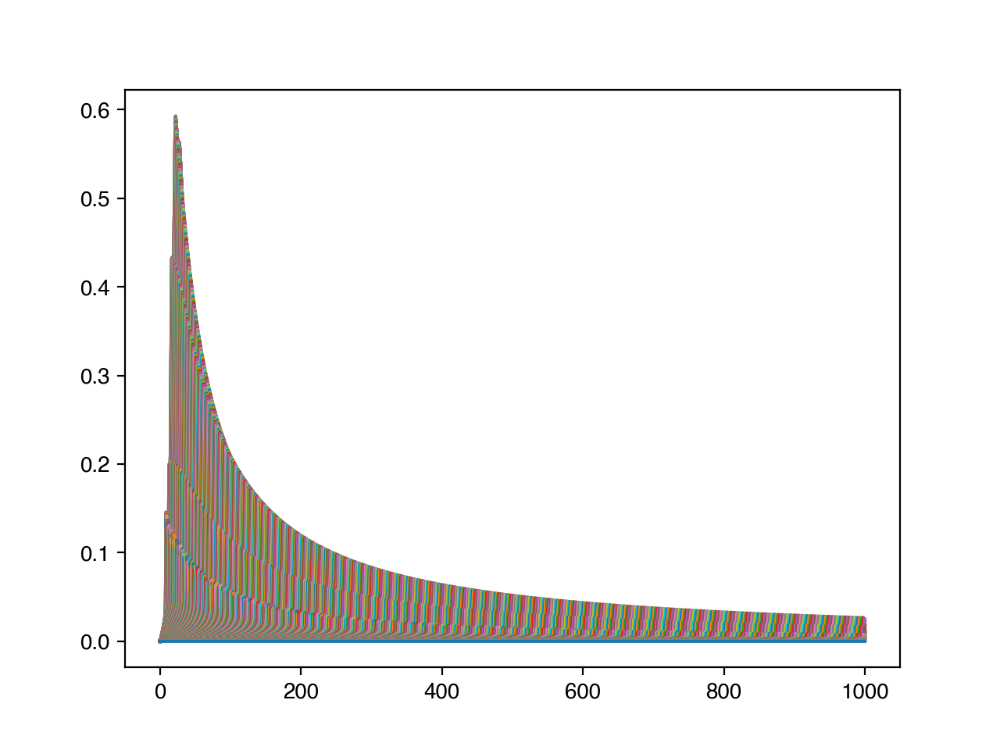

In [28]:
plt.figure()

ptfe_drude.eloss = np.linspace(0,1000,5000)
q_list = opt.linspace(0.0, 20, 0.02)

fd = open('/Users/olgaridzel/Research/MAST-SEY/examples/PTFE/PTFE_CUSTOM_Drude/elf.in', 'w')

for q in q_list:
    ptfe_drude.q = q
    ptfe_drude.calculateELF()
    for i in range(len(ptfe_drude.eloss)):
        fd.write(f'{ptfe_drude.eloss[i]:.8f} {ptfe_drude.ELF[i]:.8f}\n')
    fd.write(f'{q} {q}\n')
    fd.write('99999999 99999999\n')
    plt.plot(ptfe_drude.eloss, ptfe_drude.ELF)
    
plt.show()
fd.close()

<IPython.core.display.Javascript object>


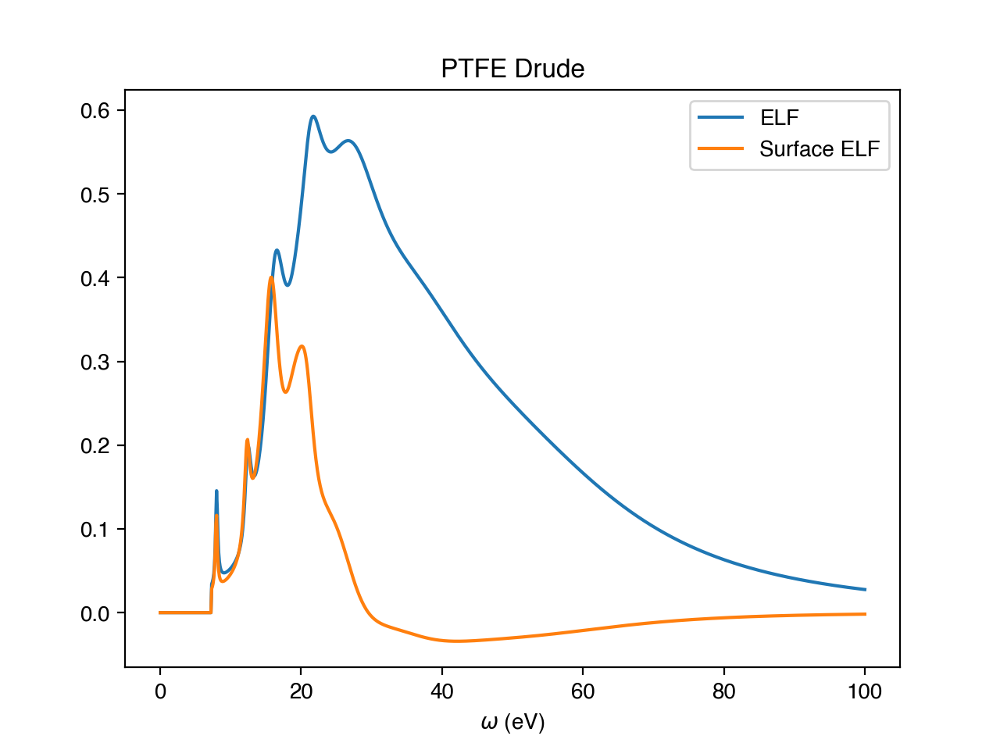

In [34]:
osc = ptfe_drude
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


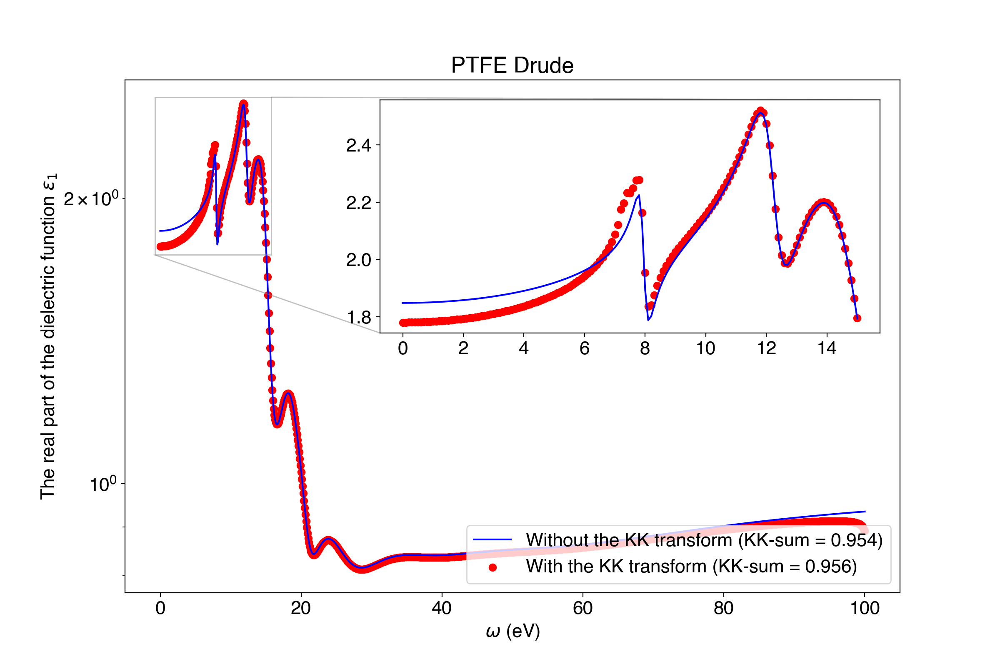

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.776563774080254
KKSum = 0.9540867358148035



The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.827468615341673
KKSum = 0.9558421441237037


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [73]:
fig, ax = plt.subplots(figsize=[12,8])

osc = ptfe_drude
x_limit = 15

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

In [35]:
# A = [0.006, 0.007, 0.038, 0.02, 0.061, 0.047, 0.029, 0.016, 0.057, 0.04, 0.06, 0.062]
# gamma = [0.49, 1.12, 2.82, 3.47, 4.2, 4.99, 4.41, 3.75, 9.12, 12.15, 24.65, 60.22]
# omega = [8.01, 12.63, 16.21, 18.01, 21.26, 24.26, 27.08, 29.39, 33.15, 39.96, 49.89, 65.47]

A = [0.007, 0.007, 0.037, 0.023, 0.068, 0.054, 0.03, 0.017, 0.062, 0.044, 0.067, 0.067]
gamma = [0.455, 1.138, 2.738, 3.54, 4.31, 4.953, 4.511, 3.971, 9.328, 12.19, 22.566, 54.93]
omega = [8.008, 12.597, 16.162, 17.488, 21.079, 24.123, 27.08, 29.226, 32.732, 38.964, 49.304, 59.297]

M = (2 * 12.01 + 4 * 18.998) / (2 + 4) # Molar weight
rho = 2.17 # g/cm3

oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','f'], [2,4])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

ptfe_dl = opt.Material('PTFE', oscillators, composition, eloss, q, xraypath)
ptfe_dl.Eg = 7.2
ptfe_dl.width_of_the_valence_band = 5.5
ptfe_dl.atomic_density = rho * opt.N_Avogadro / M *1e-24
ptfe_dl.static_refractive_index = 1.39
ptfe_dl.electron_density = 0.47
ptfe_dl.Z = 8
ptfe_dl.use_henke_for_ne = False
ptfe_dl.use_KK_constraint = True
ptfe_dl.use_KK_relation = False

fsum = ptfe_dl.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(ptfe_dl.Z))

kksum = ptfe_dl.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 7.870771703430149
Z = 8
KKSum = 0.9792830244500191


<IPython.core.display.Javascript object>


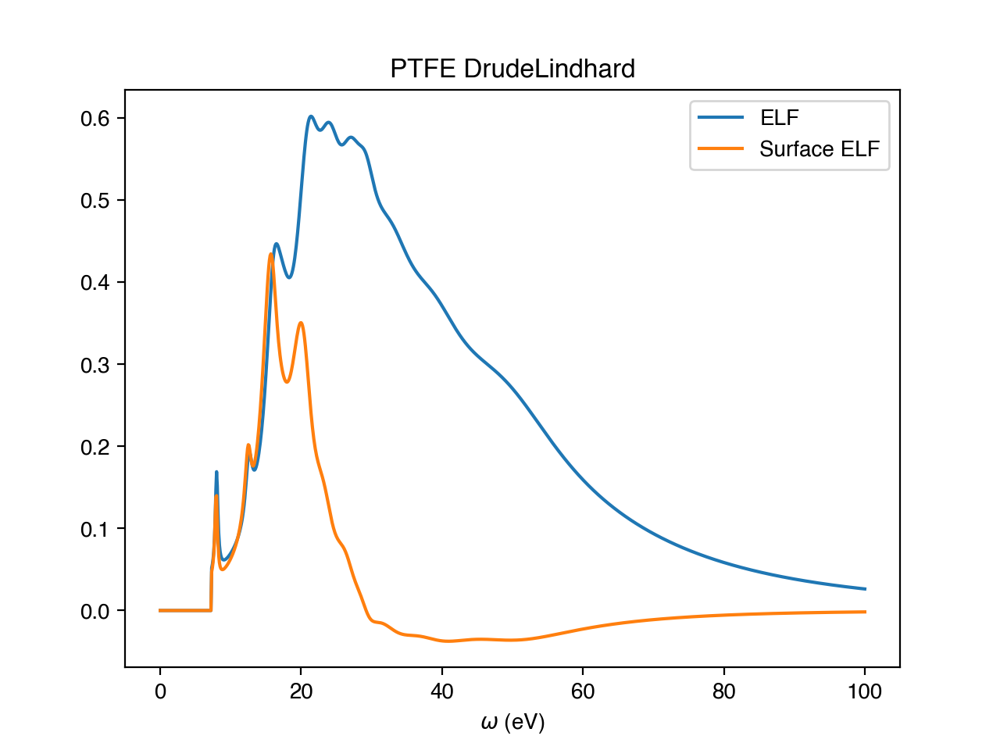

In [36]:
osc = ptfe_dl
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


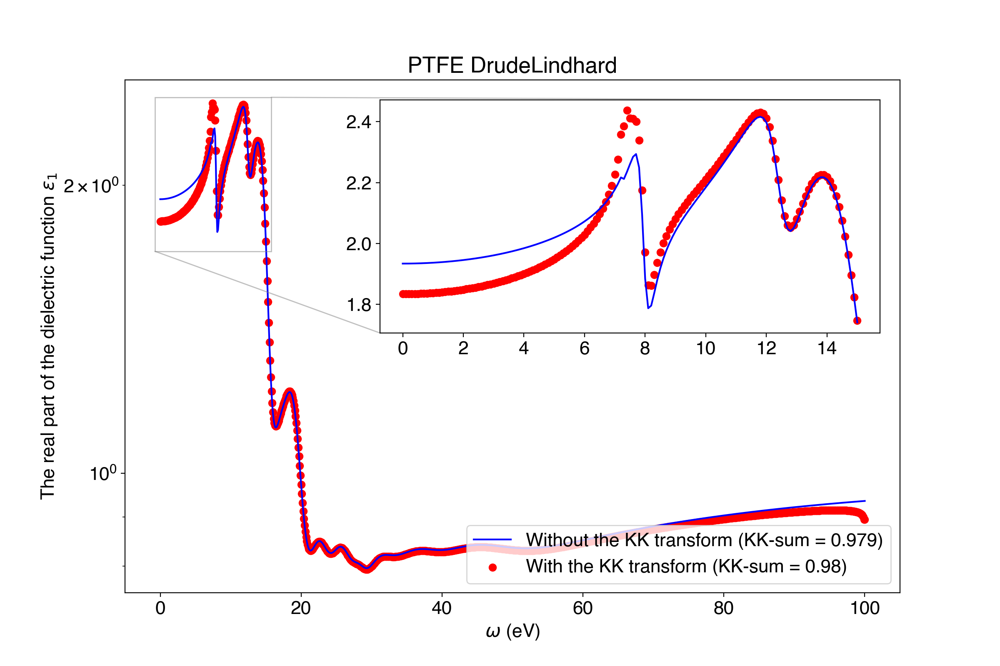

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.870771703430149
KKSum = 0.9792830244500191

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.91478069020909
KKSum = 0.9796427952473818


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [47]:
fig, ax = plt.subplots(figsize=[12,8])

osc = ptfe_dl
x_limit = 15

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
FSum = 7.871756906369915
Z = 8
KKSum = 0.9788068706960513
A = [0.007, 0.007, 0.038, 0.023, 0.069, 0.053, 0.03, 0.016, 0.06, 0.04, 0.067, 0.072]
gamma = [0.454, 1.107, 2.657, 3.496, 4.297, 4.935, 4.353, 3.822, 8.949, 11.791, 22.972, 54.264]
omega = [8.03, 12.736, 16.136, 17.672, 21.135, 24.2, 27.169, 29.342, 32.873, 39.173, 49.449, 57.953]
osc.A = [0.007 0.007 0.038 0.023 0.069 0.053 0.03 0.016 0.06 0.04 0.067 0.072];
osc.G = [0.454 1.107 2.657 3.496 4.297 4.935 4.353 3.822 8.949 11.791 22.972 54.264];
osc.Om = [8.03 12.736 16.136 17.672 21.135 24.2 27.169 29.342 32.873 39.173 49.449 57.953];


<IPython.core.display.Javascript object>


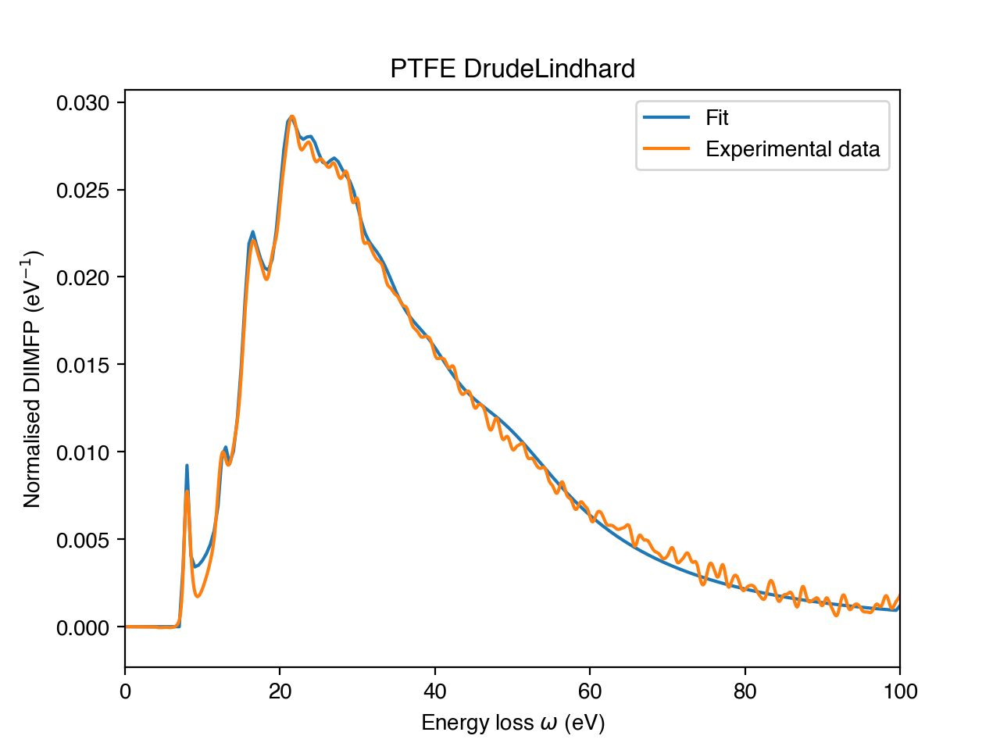

In [133]:
fd = pd.read_csv('../diimfp/ptfe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(ptfe_dl, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 1000, xtol_rel = 1e-12)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


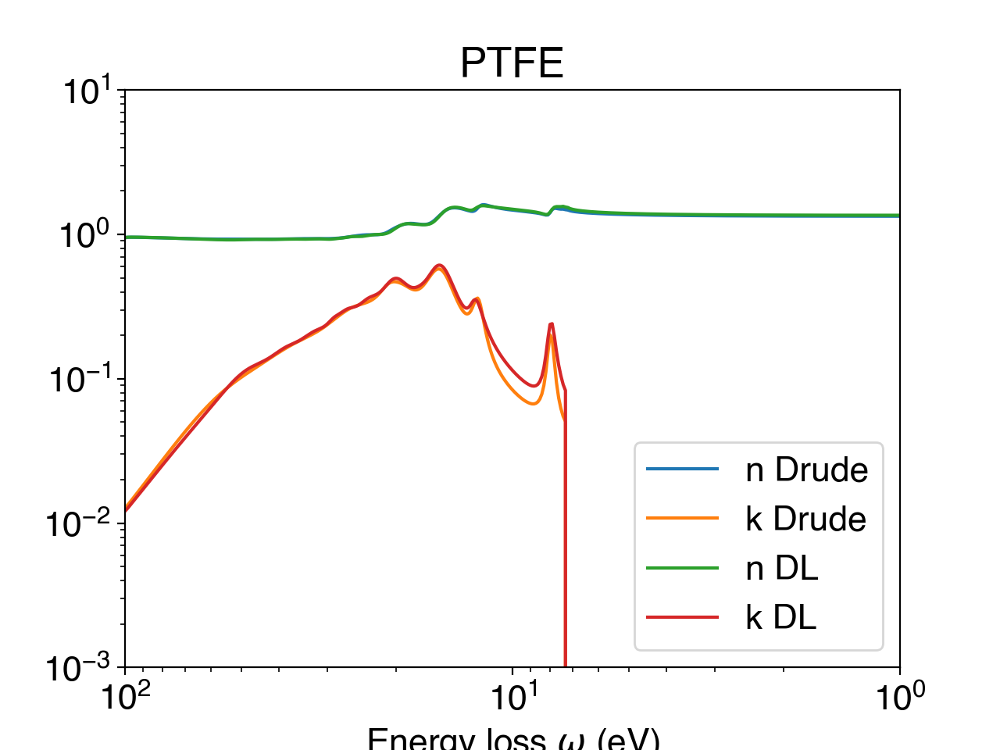

In [48]:
ptfe_drude.calculateOpticalConstants()

plt.figure()
plt.plot(ptfe_drude.eloss, ptfe_drude.refractive_index, label='n Drude')
plt.plot(ptfe_drude.eloss, ptfe_drude.extinction_coefficient, label='k Drude')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(100,1)
plt.ylim(0.001,10)
plt.title(f'{ptfe_drude.name}')

ptfe_dl.calculateOpticalConstants_()
plt.plot(ptfe_dl.eloss, ptfe_dl.refractive_index, label='n DL')
plt.plot(ptfe_dl.eloss, ptfe_dl.extinction_coefficient, label='k DL')

plt.legend()
plt.show()

ptfe_drude.writeOpticalData()

In [10]:
A = [0.01, 0.008, 0.03, 0.033, 0.072, 0.064, 0.04, 0.025, 0.084, 0.032, 0.052, 0.033]
gamma = [0.444, 0.854, 3.163, 3.242, 3.863, 4.364, 4.499, 6.107, 9.851, 11.696, 22.359, 79.78]
omega = [7.904, 12.571, 16.6, 17.434, 21.414, 23.929, 26.935, 29.216, 32.552, 39.315, 49.294, 59.224]

M = (2 * 12.01 + 4 * 18.998) / (2 + 4) # Molar weight
rho = 2.17 # g/cm3

oscillators = opt.Oscillators('Mermin', A, gamma, omega, alpha = 0)
composition = opt.Composition(['c','f'], [2,4])
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

ptfe_mermin = opt.Material('PTFE', oscillators, composition, eloss, q, xraypath)
ptfe_mermin.Eg = 7.2
ptfe_mermin.width_of_the_valence_band = 5.5
ptfe_mermin.atomic_density = rho * opt.N_Avogadro / M *1e-24
ptfe_mermin.static_refractive_index = 1.39
ptfe_mermin.electron_density = 0.47
ptfe_mermin.Z = 8
ptfe_mermin.use_henke_for_ne = True
ptfe_mermin.use_KK_constraint = True
ptfe_mermin.use_KK_relation = False

fsum = ptfe_mermin.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(ptfe_mermin.Z))

kksum = ptfe_mermin.evaluateKKsum()
print('KKSum = {}'.format(kksum))

FSum = 7.065895886437223
Z = 8
KKSum = 0.9811063883745611


<IPython.core.display.Javascript object>


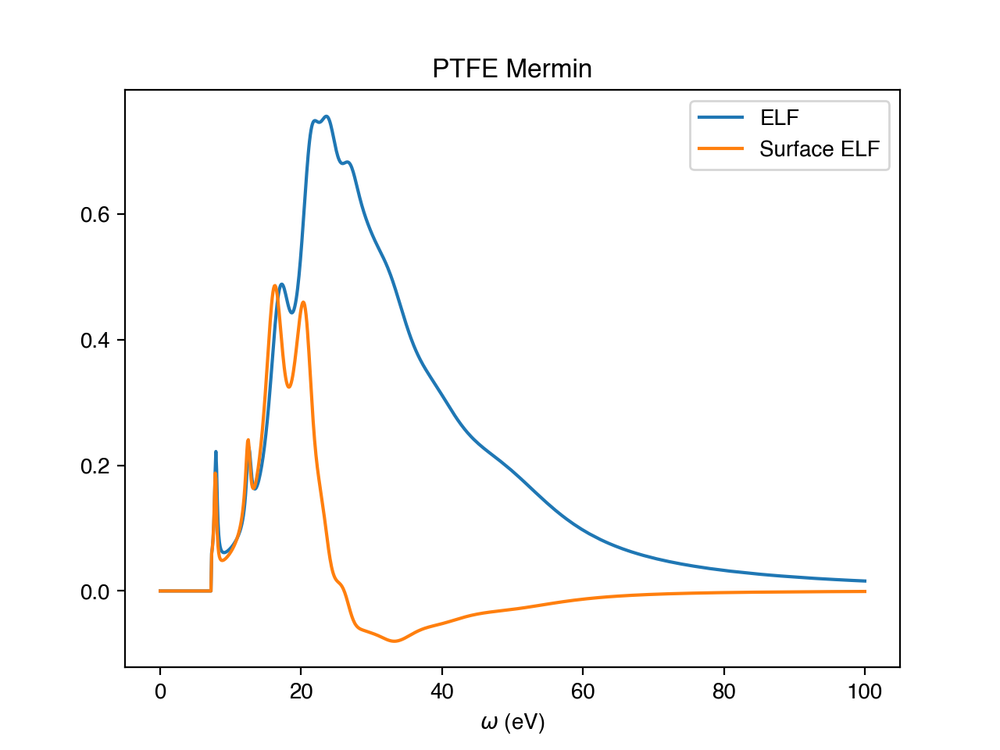

In [7]:
osc = ptfe_mermin
osc.calculateSurfaceELF()

plt.figure()
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.plot(osc.eloss, osc.ELF, label='ELF')
plt.plot(osc.eloss, osc.surfaceELF, label='Surface ELF')

plt.xlabel('$\omega$ (eV)')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


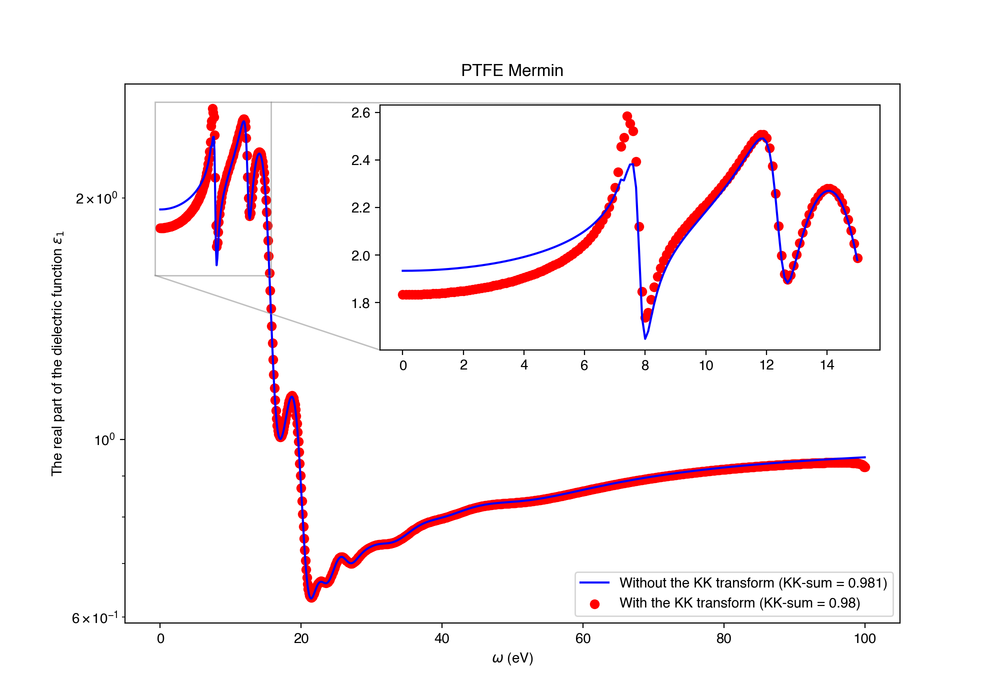

Without the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.065895886437223
KKSum = 0.9811063883745611

With the Kramers-Kronig transfer after the zeroing procedure:
FSum = 7.081085335125923
KKSum = 0.9796353142704893


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [8]:
fig, ax = plt.subplots(figsize=[10,7])

osc = ptfe_mermin
x_limit = 15

osc.use_kk_relation = False
osc.calculateDielectricFunction()
ind_zoom = osc.eloss <= x_limit
x_zoom_no_kk = osc.eloss[ind_zoom]
y_zoom_no_kk = osc.epsilon.real[ind_zoom]
kk_sum_no_kk = osc.evaluateKKsum()
plt.plot(osc.eloss, osc.epsilon.real, label=f'Without the KK transform (KK-sum = {round(kk_sum_no_kk, 3)})', c='blue')

print('Without the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_no_kk}')
print()

osc.use_kk_relation = True
osc.calculateDielectricFunction()
x_zoom_kk = osc.eloss[ind_zoom]
y_zoom_kk = osc.epsilon.real[ind_zoom]
kk_sum_kk = osc.evaluateKKsum()
plt.scatter(osc.eloss, osc.epsilon.real, label=f'With the KK transform (KK-sum = {round(kk_sum_kk, 3)})', c='red')


print('With the Kramers-Kronig transfer after the zeroing procedure:')
print(f'FSum = {osc.evaluateFsum()}')
print(f'KKSum = {kk_sum_kk}')

plt.legend(loc='lower right')
plt.title(f'{osc.name} {osc.oscillators.model}')
plt.ylabel('The real part of the dielectric function $\epsilon_1$')
plt.xlabel('$\omega$ (eV)')
plt.yscale('log')

axes = plt.axes([0.38, .5, 0.5, 0.35])
axes.plot(x_zoom_no_kk, y_zoom_no_kk, c='blue')
axes.scatter(x_zoom_kk, y_zoom_kk, c='red')
# axes.set_yscale('log')
ax.indicate_inset_zoom(axes)

plt.show()
plt.savefig(f'zeroing_{osc.name}_{osc.oscillators.model}.eps', dpi=600)

Start optimisation
Electron density = 0.3824715359746466
FSum = 7.059108785416071
Z = 8
KKSum = 0.9806478529783262
A = [0.01, 0.008, 0.03, 0.033, 0.072, 0.064, 0.04, 0.025, 0.084, 0.032, 0.052, 0.033]
gamma = [0.444, 0.854, 3.163, 3.242, 3.863, 4.364, 4.499, 6.107, 9.851, 11.696, 22.359, 79.78]
omega = [7.904, 12.571, 16.6, 17.434, 21.414, 23.929, 26.935, 29.216, 32.552, 39.315, 49.294, 59.224]
osc.A = [0.01 0.008 0.03 0.033 0.072 0.064 0.04 0.025 0.084 0.032 0.052 0.033];
osc.G = [0.444 0.854 3.163 3.242 3.863 4.364 4.499 6.107 9.851 11.696 22.359 79.78];
osc.Om = [7.904 12.571 16.6 17.434 21.414 23.929 26.935 29.216 32.552 39.315 49.294 59.224];


<IPython.core.display.Javascript object>


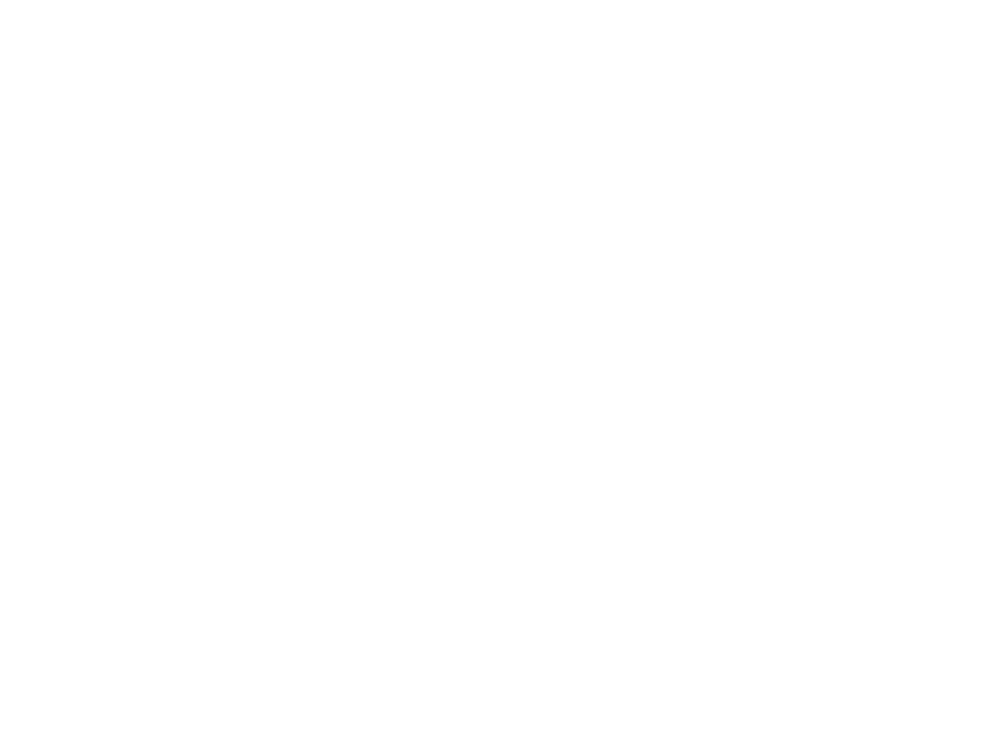

In [5]:
fd = pd.read_csv('../diimfp/ptfe_diimfp.dat',sep=' ',header=None)
exp_diimfp = fd.values
x_exp = exp_diimfp[:,0]
y_exp = exp_diimfp[:,1]

opt_ = opt.OptFit(ptfe_mermin, x_exp, y_exp, 1600)
result = opt_.runOptimisation('ndiimfp', maxeval = 100, xtol_rel = 1e-12)
oscOptimised = opt_.vec2Struct(result)

fsum = oscOptimised.evaluateFsum()
print('FSum = {}'.format(fsum))
print('Z = {}'.format(oscOptimised.Z))

kksum = oscOptimised.evaluateKKsum()
print('KKSum = {}'.format(kksum))

print(f'A = [{", ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}]')
print(f'gamma = [{", ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}]')
print(f'omega = [{", ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}]')

print(f'osc.A = [{" ".join([str(i) for i in oscOptimised.oscillators.A.round(3).tolist()])}];')
print(f'osc.G = [{" ".join([str(i) for i in oscOptimised.oscillators.gamma.round(3).tolist()])}];')
print(f'osc.Om = [{" ".join([str(i) for i in oscOptimised.oscillators.omega.round(3).tolist()])}];')

oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

<IPython.core.display.Javascript object>


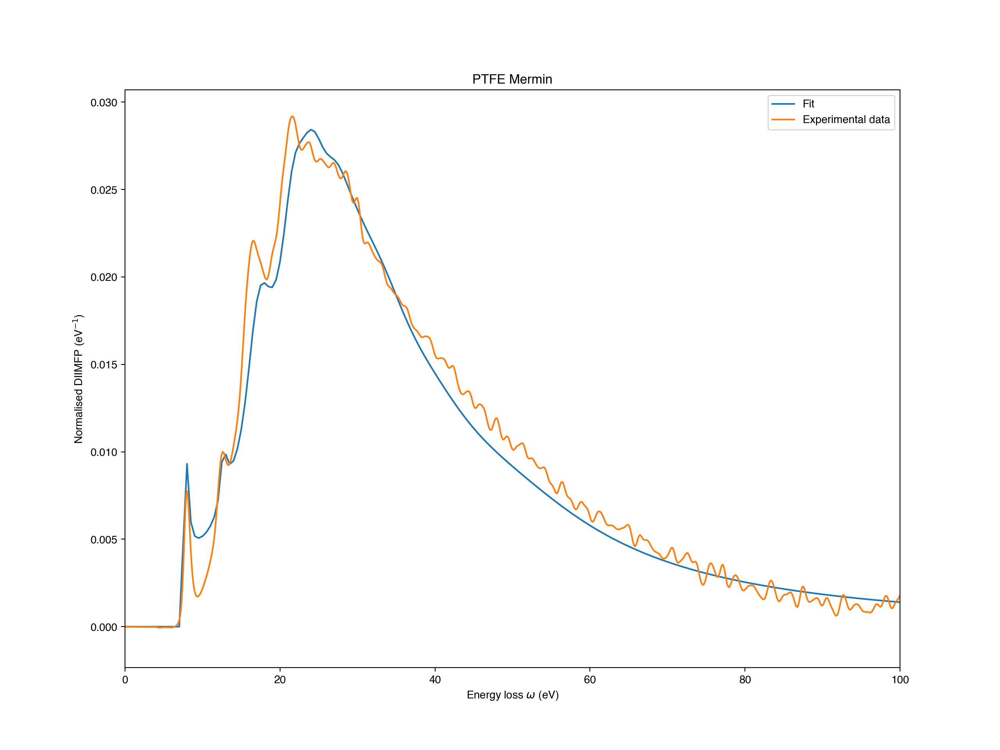

In [11]:
oscOptimised = ptfe_mermin
oscOptimised.calculateDIIMFP(opt_.E0)

plt.figure()
plt.plot(oscOptimised.DIIMFP_E,oscOptimised.DIIMFP,label='Fit')
plt.plot(x_exp,y_exp,label='Experimental data')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('Normalised DIIMFP (eV$^{-1}$)')
plt.title(f'{oscOptimised.name} {oscOptimised.oscillators.model}')
plt.legend()
plt.xlim(0,100)
plt.show()

**Au**

In [14]:
A = [0.01, 0.02, 0.07, 0.1, 0.07,0.007, 0.16, 0.15,0.13,0.08,0.02,0.09,0.16,0.02,0.003,0.005,0.008]
omega = [2.62,3.34,6.31,10.58,17.08,25.75,25.39,33.65,39.17,45.72,52.12,14.57,64.21,96.19,278.92,210.69,470.93]
gamma = [0.29,0.81,3.05,5.62,5.04,2.05,8.04,8.56,10.86,10.79,11.13,5.39,29.85,34.51,38.38,62.79,376.54]
oscillators = opt.Oscillators('DrudeLindhard', A, gamma, omega, alpha = 1)
composition = opt.Composition('au', 1)
eloss = opt.linspace(opt.machine_eps,100,0.1)
q = 0

au_dl = opt.Material('Au', oscillators, composition, eloss, q, xraypath)
au_dl.Ef = 9
au_dl.atomic_density = 0.059

<IPython.core.display.Javascript object>


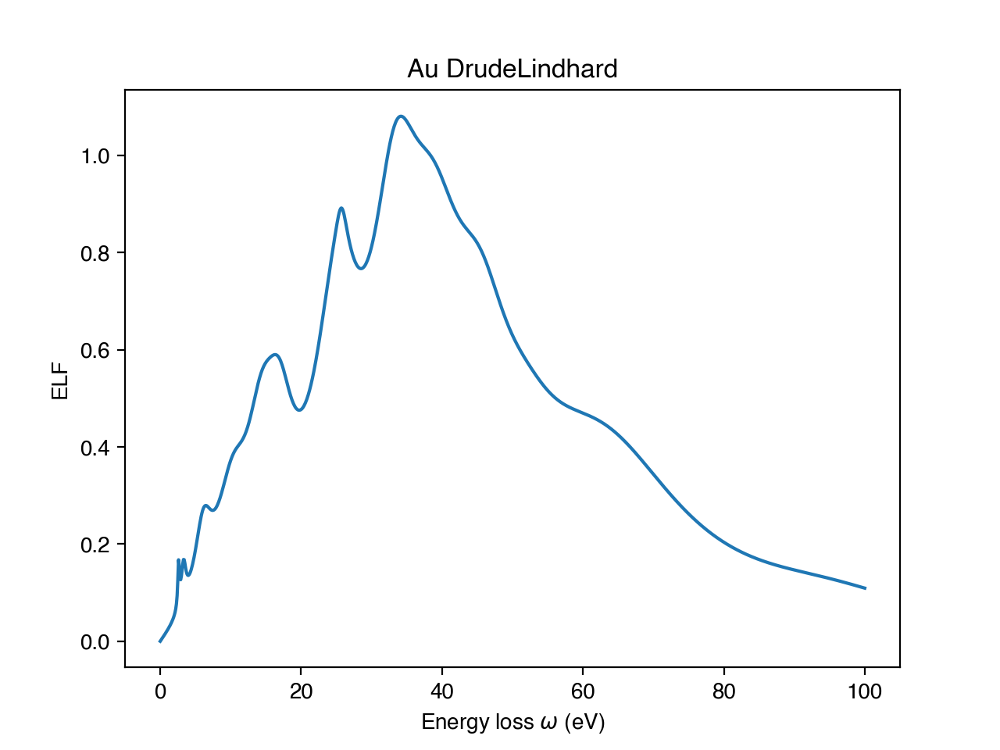

In [16]:
au_dl.plotELF()

<IPython.core.display.Javascript object>


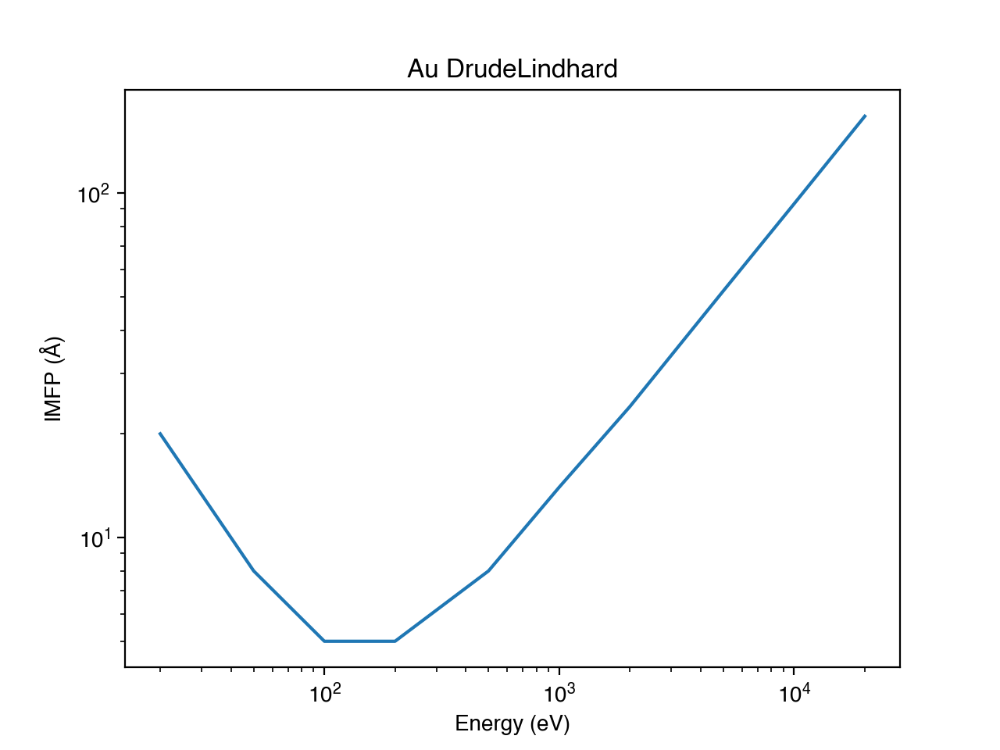

In [15]:
E0 = np.array([20, 50, 100, 200, 500, 1000, 2000, 5000, 10000, 20000]) # eV
au_dl.plotIMFP(E0)

<IPython.core.display.Javascript object>


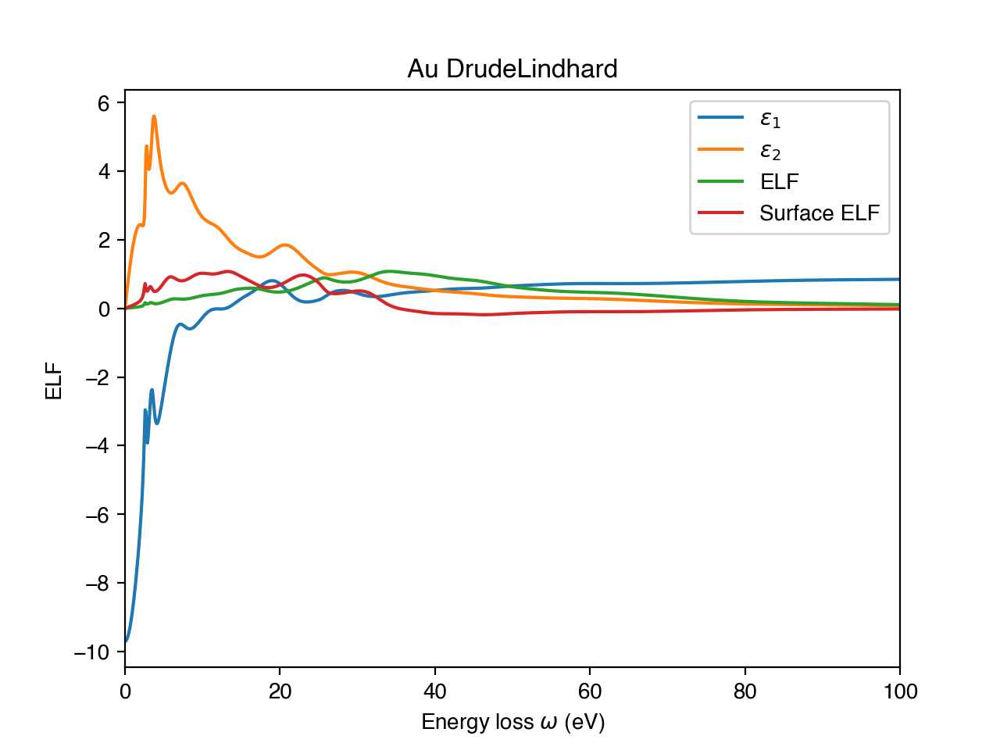

In [17]:
au_dl.calculateELF()
au_dl.calculateSurfaceELF()

plt.figure()
plt.plot(au_dl.eloss,au_dl.epsilon.real,label='$\epsilon_1$')
plt.plot(au_dl.eloss,au_dl.epsilon.imag,label='$\epsilon_2$')
plt.plot(au_dl.eloss,au_dl.ELF,label='ELF')
plt.plot(au_dl.eloss,au_dl.surfaceELF,label='Surface ELF')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.ylabel('ELF')
plt.title(f'{au_dl.name} {au_dl.oscillators.model}')
plt.xlim(0,100)
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


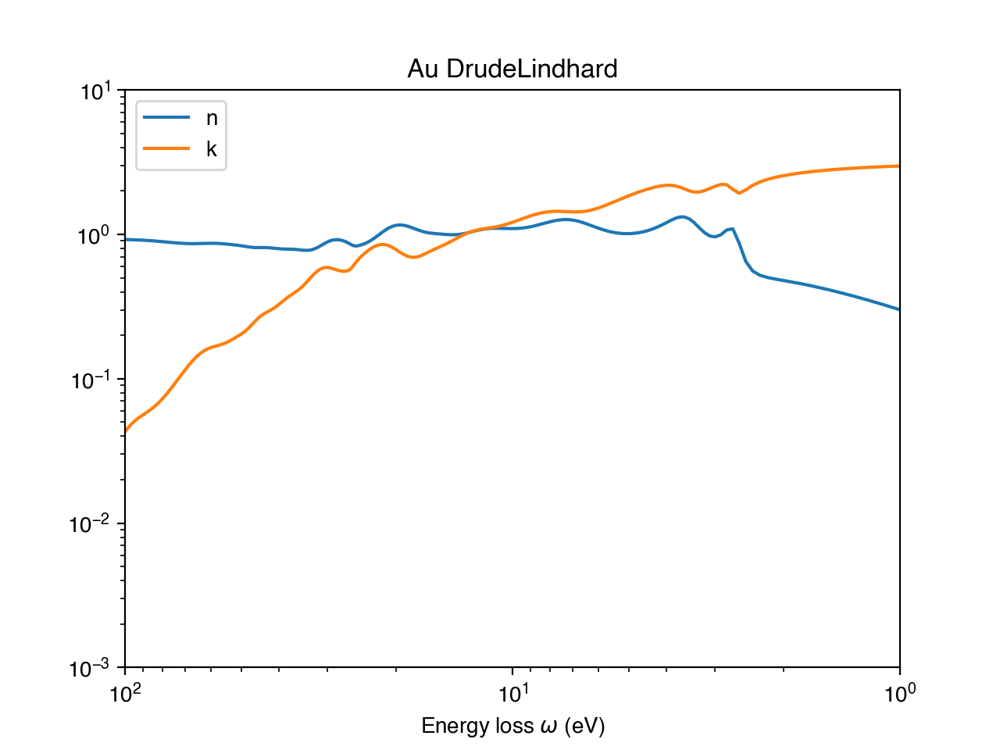

In [18]:
au_dl.calculateOpticalConstants()

plt.figure()
plt.plot(au_dl.eloss,au_dl.refractive_index,label='n')
plt.plot(au_dl.eloss,au_dl.extinction_coefficient,label='k')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Energy loss $\omega$ (eV)')
plt.xlim(100,1)
plt.ylim(0.001,10)
plt.legend()
plt.title(f'{au_dl.name} {au_dl.oscillators.model}')
plt.show()